In [14]:
import torch
import torchvision
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

import wandb
from matplotlib import pyplot as plt
import numpy as np
import torch
import math
import umap.umap_ as umap
import os
import pickle
import pickle5
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import pandas as pd
from torch.autograd import Variable
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader
from torchvision import transforms
from pathlib import Path
import torch.nn.init as init
from torch.nn.parameter import Parameter
from torch.distributions.normal import Normal
from torch.distributions.multivariate_normal import MultivariateNormal
from torch.distributions.multinomial import Multinomial
from torchvision.datasets import FashionMNIST, CIFAR100,ImageFolder
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from torchvision import datasets, transforms
from tqdm import tqdm
import gc
from torch.utils.data import Dataset
import wandb
import time
from torch.utils.tensorboard import SummaryWriter
import pdb
import glob
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import umap.umap_ as umap
import cw  # Carlini Wagner L2 attack

#### Load imagenet 2012 data

In [15]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
# Set the root directory where the ImageNet dataset is stored
DATASET_DIR = '/D/datasets/imagenet/'

# transform = transforms.Compose([transforms.Resize((299, 299)),
#                                 transforms.ToTensor()])

transform = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the ImageNet dataset and select the first 100,000 samples
train_dataset = datasets.ImageNet(root=DATASET_DIR, split='train', transform=transform)
train_subset_dataset = torch.utils.data.Subset(train_dataset, range(100000))

val_dataset = datasets.ImageNet(root=DATASET_DIR, split='val', transform=transform)
val_subset_dataset = torch.utils.data.Subset(val_dataset, range(20000))

# Create a data loader to iterate over the subset dataset
# train_data_loader = torch.utils.data.DataLoader(train_subset_dataset, batch_size=32, shuffle=True)
train_data_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
# val_data_loader = torch.utils.data.DataLoader(val_subset_dataset, batch_size=32, shuffle=True)
val_data_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=True)

# TEST_DATASET_DIR = '/D/datasets/imagenet/test'
# test_dataset = ImageFolder(TEST_DATASET_DIR, transform=transform)
# test_data_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=True)

# for x, y in test_data_loader:
#     break
# plt.imshow(np.transpose(x[0], (1, 2, 0))
# print(y[0])

#### Load inception_v3 pretrained model
Inception v3 is a deep convolutional neural network architecture for image classification. It achieved a top-1 accuracy of 78.0% and a top-5 accuracy of 93.9% on the ImageNet dataset.<br>
Note this is inception v3 and not v2 as in the VIB paper, v2 is only available in Keras. Also It indeed has a higher accuracy on the 2012 validation set than v3

In [53]:
model = torchvision.models.inception_v3(pretrained=True, transform_input=True)

/home/nir/.pyenv/versions/3.7.9/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/home/nir/.pyenv/versions/3.7.9/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [57]:
!ls /D/models/pretrained

In [58]:
torch.save(model, '/D/models/pretrained/inceptionv3.pkl')

In [4]:
# Load the pretrained Inception V3 model
model = torchvision.models.inception_v3(pretrained=True, transform_input=True)
_ = model.eval()

# Move the model to the GPU if available
_ = model.to(device)

#### Test inception v3 on test data - Sanity test

In [16]:
def test_model(model, test_data_loader):
    model.eval()
    total_correct = 0
    total_incorrect = 0
    with torch.no_grad():
        for x, y in tqdm(test_data_loader):
            output = model(x.to(device))
            if type(output) == tuple:
                logits = output[-1].squeeze(0)
            else:
                logits = output
            predictions = torch.argmax(torch.softmax(logits, dim=-1), dim=1)#.to(torch.device('cpu'))
            correct_classifications = sum(predictions == y.to(device))
            incorrect_classifications = len(x) - correct_classifications
            total_correct += correct_classifications
            total_incorrect += incorrect_classifications
    model.train()
    print(f"acc: {print(total_correct / (total_correct + total_incorrect))}")

#### Sanity check for model's accuracy
Expected acc: ~77.3%
We can only test on the validation set as the test set is unlabled
https://pytorch.org/vision/main/models/generated/torchvision.models.inception_v3.html

In [5]:
test_model(model, val_data_loader)

100%|███████████████████████████████████████| 1563/1563 [05:00<00:00,  5.21it/s]

tensor(0.7722, device='cuda:0')
acc: None


#### Replace last classifier layer with identity layer

In [32]:
# Replace the last layer with an identity layer
model.fc = torch.nn.Identity()

#### Create new dataloaders with embeddings

In [17]:
class LogitsDataset(Dataset):
    def __init__(self, data, labels):
        self.data = data
        self.labels = labels
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        x = self.data[idx]
        y = self.labels[idx]
        return x, y

In [18]:
def get_logits_dataloader(model, original_loader, batch_size=32, whiten=False):
    logits_data_list = []
    logits_labels_list = []
    with torch.no_grad():
        for x, y in tqdm(original_loader):
            logits = model(x.to(device))
            logits_data_list.append(logits.to(torch.device('cpu')))
            logits_labels_list.append(y.to(torch.device('cpu')))

    logits_data_set = LogitsDataset(torch.concat(logits_data_list), torch.concat(logits_labels_list))
    logits_dataloader = DataLoader(logits_data_set, batch_size=batch_size, shuffle=True)
    if whiten:
        # Apply whitening to the features
        scaler = StandardScaler()
        outputs = scaler.fit_transform(torch.concat(logits_data_list).numpy())
        pca = PCA()
        whitened = pca.fit_transform(outputs)

        whitened_logits_data_set = LogitsDataset(whitened, torch.concat(logits_labels_list))
        whitened_logits_dataloader = DataLoader(whitened_logits_data_set, batch_size=batch_size, shuffle=True)
        return whitened_logits_dataloader
    else:
        return logits_dataloader

In [8]:
logits_trian_dataloader = get_logits_dataloader(model, train_data_loader, batch_size=32, whiten=False)
logits_val_dataloader = get_logits_dataloader(model, val_data_loader, batch_size=32, whiten=False)

100%|███████████████████████████████████████| 1563/1563 [05:11<00:00,  5.01it/s]


In [17]:
LOGITS_TRAIN_DATALOADER_PATH = '/D/datasets/imagenet/logits_dataloaders/logits_train_dataloader.pkl'
LOGITS_VAL_DATALOADER_PATH = '/D/datasets/imagenet/logits_dataloaders/logits_val_dataloader.pkl'

In [ ]:
# Save
# with open(LOGITS_TRAIN_DATALOADER_PATH, 'wb') as f:
#     pickle5.dump(logits_trian_dataloader, f)
# with open(LOGITS_VAL_DATALOADER_PATH, 'wb') as f:
#     pickle5.dump(logits_val_dataloader, f)
# print('Saved dataloaders!')

In [18]:
# Load
with open(LOGITS_TRAIN_DATALOADER_PATH, 'rb') as f:
    logits_trian_dataloader = pickle5.load(f)
with open(LOGITS_VAL_DATALOADER_PATH, 'rb') as f:
    logits_val_dataloader = pickle5.load(f)

In [28]:
new_logits_train_dataloader = DataLoader(logits_trian_dataloader.dataset, batch_size=32, shuffle=True)

In [31]:
new_logits_val_dataloader = DataLoader(logits_val_dataloader.dataset, batch_size=32, shuffle=True)

In [32]:
for x,y in new_logits_val_dataloader:
    break

In [33]:
# Save
with open(LOGITS_TRAIN_DATALOADER_PATH, 'wb') as f:
    pickle5.dump(new_logits_train_dataloader, f)
with open(LOGITS_VAL_DATALOADER_PATH, 'wb') as f:
    pickle5.dump(new_logits_val_dataloader, f)
print('Saved dataloaders!')

Saved dataloaders!


##### Statistical functions
Note we assume a diagonal (and of course positive cov matrix $\Sigma$.
Where $D$ is the dimention size of a multivariate gaussian:
$$H(N_D(\mu,\Sigma))=\frac{D}{2}(1+log(2\pi))+\frac{1}{2}log|\Sigma|$$
<br>
$$H(X~multi)=\Sigma_{x}p(x)log(\frac{1}{x})$$
<br>
$$KL(N(\mu_1,\Sigma_1||N(\mu_2,\Sigma_2))=\frac{1}{2}[log\frac{|\Sigma_2|}{|\Sigma_1|}-D+tr\{\Sigma^{-1}_{2}\Sigma_1\}+(\mu_2-\mu_1)^T\Sigma^{-1}_{2}(\mu_2-\mu_1)]$$
<br>
* https://gregorygundersen.com/blog/2020/09/01/gaussian-entropy/#:~:text=Entropy%20of%20the%20multivariate%20Gaussian.&text=Again%2C%20we%20use%20the%20fact,a%20function%20of%20the%20covariance.
* https://stats.stackexchange.com/questions/60680/kl-divergence-between-two-multivariate-gaussians

In [19]:
EPSILON = 1e-20


def get_multivariate_gaussian_entropy(std, epsilon=EPSILON):
    """
    $$H(N_D(\mu,\Sigma))=\frac{D}{2}(1+log(2\pi))+\frac{1}{2}log|\Sigma|$$
    Assuming a diagonal cov matrix represented as a vector
    """
    std = std.to(torch.float64)
    if not (std > 0).all():
        raise ValueError('Got a non-positive entry in diagonal cov matrix')
    D = std.shape[-1]
    log_term = torch.log(torch.clamp(torch.prod(std, dim=-1), min=epsilon))
    return torch.maximum(epsilon, ((D / 2) * (1 + np.log(2 * np.pi)) + 0.5 * log_term)).mean()


def get_multinomial_entropy(logits, epsilon=EPSILON):
    """
    Receives unactivates logits
    epsilon replaces 0 probability that results from torch's low float resolution
    """
    logits = logits.squeeze(0).to(torch.float64)
    probs = torch.softmax(logits, dim=-1)
    probs = torch.clamp(probs, epsilon, 1 - epsilon)
    return (probs * torch.log(1/probs)).sum(dim=-1).mean()


def get_kld_between_multivariate_gaussians(mu1, mu2, std1, std2, epsilon=EPSILON):
    """
    assuming diagonal cov matrix as 1d ndarray
    """
    N, D = mu1.shape

    # Compute the log term
    log_term = torch.log(torch.clamp(torch.prod(
        std2, dim=-1) / torch.prod(std1, dim=-1), min=epsilon))

    # Compute the trace term
    trace_term = ((1 / std2) * std1).sum(dim=-1)

    # Compute the quadratic term
    mu_diff = mu2 - mu1
    quadratic_term = torch.sum((mu_diff * (1 / std2) * mu_diff), dim=-1)

    # Compute the KLD for each pair of Gaussians
    kld = 0.5 * (log_term - D + trace_term + quadratic_term)

    return kld


#### VIB classifier
Inputs are passed through two fully connected
layers, each with 1024 (2048) units. Next, data is fed to a stochastic encoding layer; this layer is characterized by a spherical Gaussian with 1024 (2048) learned means and standard deviations. The output of
the stochastic layer is fed to the variational classifier–itself a logistic regression

In [20]:
def reparametrize(mu, std, device):
    """
    Performs reparameterization trick z = mu + epsilon * std
    Where epsilon~N(0,1)
    """
    mu = mu.expand(1, *mu.size())
    std = std.expand(1, *std.size())
    eps = torch.normal(0, 1, size=std.size()).to(device)
    return mu + eps * std

class VIB(nn.Module):
    """
    Classifier with stochastic layer and KL regularization
    """
    def __init__(self, hidden_size, output_size, device):
        super(VIB, self).__init__()
        self.device = device
        self.description = 'Vanilla IB VAE as per the paper'
        self.hidden_size = hidden_size
        self.k = hidden_size // 2
        self.output_size = output_size
        self.train_loss = []
        self.test_loss = []

        self.encoder = nn.Sequential(
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU()
        )
        self.classifier = nn.Linear(self.k, output_size)

        # Xavier initialization
        for _, module in self._modules.items():
            if isinstance(module, nn.Linear) or isinstance(module, nn.Conv2d):
                        nn.init.xavier_uniform_(module.weight, gain=nn.init.calculate_gain('relu'))
                        module.bias.data.zero_()
                        continue
            for layer in module:
                if isinstance(layer, nn.Linear) or isinstance(layer, nn.Conv2d):
                            nn.init.xavier_uniform_(layer.weight, gain=nn.init.calculate_gain('relu'))
                            layer.bias.data.zero_()
        
        # Init with a small bias in std to create initial high entropy
        # biased_layer = self.encoder[2]
        # slice_size = biased_layer.bias.shape[0] // 2
        # new_bias = torch.concat((biased_layer.bias[:slice_size], torch.ones(slice_size) * 0.1))
        # biased_layer.bias.data = new_bias


    def forward(self, x):
        z_params = self.encoder(x)
        mu = z_params[:, :self.k]
        # softplus transformation (soft relu) and a -5 bias is added as in the paper
        # std = F.softplus(z_params[:, self.k:] - 5, beta=1)
        std = F.softplus(z_params[:, self.k:] - 1, beta=1)
        # std = F.softplus(z_params[:, self.k:], beta=1)
        if self.training:
            z = reparametrize(mu, std, self.device)
        else:
            z = mu.clone().unsqueeze(0)
        n = Normal(mu, std)
        log_probs = n.log_prob(z.squeeze(0))  # These may be positive as this is a PDF
        
        logits = self.classifier(z)
        return (mu, std), log_probs, logits
   
def vib_loss(logits, labels, mu, std, beta):
    classification_loss = nn.CrossEntropyLoss()(logits.squeeze(0), labels)  # In torch cross entropy function applies the softmax itself
    normalization_loss = -0.5 * (1 + 2 * std.log() - mu.pow(2) - std.pow(2)).sum()
    # KLD = 0.5 * torch.sum(logvar.exp() - logvar - 1 + mu.pow(2))
    return classification_loss + beta * normalization_loss


In [21]:
class MNIST_CNN(nn.Module):
    def __init__(self):
        super(MNIST_CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.25)
        self.fc1 = nn.Linear(64 * 7 * 7 * 4, 256)
        self.fc2 = nn.Linear(256, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool(F.relu(self.conv2(x)))
#         x = self.dropout(x)
        x = x.view(-1, 64 * 7 * 7 * 4)
        x = F.relu(self.fc1(x))
#         x = self.dropout(x)
        x = self.fc2(x)
        return x

class HybridModel(nn.Module):
    """
    Head is inception, classifier is VIB
    """
    def __init__(self, inception_model, vib_model, device):
        super(HybridModel, self).__init__()
        self.device = device
        self.inception_model = inception_model
        self.inception_model.fc = torch.nn.Identity()
        self.vib_model = vib_model
        self.train_loss = []
        self.test_loss = []

    def forward(self, x):
        encoded = self.inception_model(x)
        logits = self.vib_model(encoded)
        return logits
    
class NewHybridModel(nn.Module):
    """
    Head is inception, classifier is VIB
    """
    def __init__(self, base_model, vib_model, device):
        super(NewHybridModel, self).__init__()
        self.device = device
        self.base_model = base_model
        self.base_model.fc2 = torch.nn.Identity()
        self.vib_model = vib_model
        self.train_loss = []
        self.test_loss = []
        
    def freeze_base(self):
        # Freeze the weights of the inception_model
        for param in self.base_model.parameters():
            param.requires_grad = False

    def unfreeze_base(self):
        # Freeze the weights of the inception_model
        for param in self.base_model.parameters():
            param.requires_grad = True
            
    def forward(self, x):
        encoded = self.base_model(x)
        logits = self.vib_model(encoded)
        return logits

#### Create adverserial test set
The Fast Gradient Sign (FGS) method proposed in Goodfellow et al. (2015) and the L2 optimization method proposed in Carlini & Wagner (2016). FGS is a standard baseline attack that takes a single step in the gradient direction to generate the adversarial example. As originally described, FGS generates untargeted adversarial examples. On MNIST, Goodfellow et al. (2015) reported that FGS could generate adversarial examples that fooled a maxout network approximately 90% of the time with  = 0.25, where  is the magnitude of the perturbation at each pixel. The L2 optimization method has been shown to generate adversarial examples with smaller perturbations than any other method published to date, which were capable of fooling the target network 100% of the time. We consider both targeted attacks and untargeted attacks for the L2 optimization method. <br>

Original image $\rightarrow x$ <br>
Petrubation = $\rightarrow r$ <br>
Adverserial example $\rightarrow x'=x+r$ <br>
True label $\rightarrow l$ <br>
Target label $\rightarrow l'$ <br>
We minimize the $L_2$ distance between $x$ and $x'$:
$$\underset{x'}{min}||x'-x||$$
$$s.t.$$
$$f(x)=l, f(x')=l', l\ne l'$$

*FGS - Fast Gradient Sign*

for each image do:
    run through net
    compute the sign gradient for that image $s\leftarrowsign(\grad_x(\theta,x,y))$
    

In [22]:
EPSILONS = [0, .05, .1, .15, .2, .25, .3]

def fgsm_attack(data, epsilon, data_grad, is_targeted=False, is_image=True):
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()
    if is_targeted:
        sign_data_grad *= -1
    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_data = data + epsilon*sign_data_grad
    # Adding clipping to maintain [0,1] range
    if is_image:
        perturbed_data = torch.clamp(perturbed_data, 0, 1)
    # Return the perturbed image
    return perturbed_data

def run_adverserial_attacks(model, device, test_loader, epsilon, target_label=None, is_image=True):

    # Accuracy counter
    correct = 0
    relevant_pertrubations = 0
    total_succesful_attacks = 0
    adv_examples = []

    model.eval()
    
    # Loop over all examples in test set
    for data, labels in test_loader:
        # Send the data and label to the device
        data, labels = data.to(device), labels.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        data.requires_grad = True

        # Forward pass the data through the model
        output = model(data)
        if type(output) == tuple:
            _, _, output = model(data)
        
#         if type(model) == torchvision.models.inception.Inception3:
#             output = model(data)
#         elif type(model) == MNIST_CNN:
#             output = model(data)
#         else:
#             _, _, output = model(data) # (mu, std), log_probs, logits
#         init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        init_pred = output.squeeze(0).max(dim=-1, keepdim=True)[1] # get the index of the max log-probability
        
        hit_vector = init_pred.squeeze(1) == labels
#         relevant_targeted_attack_vector = init_pred.squeeze(1) != target_label
        relevant_targeted_attack_vector = labels != target_label
        if target_label:
            relevant_attack_idx = torch.nonzero(relevant_targeted_attack_vector & (init_pred.squeeze(1) != target_label)).flatten()
        else:
            relevant_attack_idx = torch.nonzero(hit_vector).flatten()        
        
        # If the initial prediction is wrong, don't bother attacking, just move on
#         if init_pred.item() != labels.item():
        if len(relevant_attack_idx) == 0:
            correct += hit_vector.sum().to(torch.device('cpu'))
            continue
    
        relevant_output = output.squeeze(0)[relevant_attack_idx]
        relevant_labels = labels[relevant_attack_idx]

        # Calculate the loss for the gradient
        if target_label:
            # Targeted attack
#             loss = F.nll_loss(relevant_output, torch.tensor([target_label]).to(device))
            loss = F.nll_loss(relevant_output, torch.tensor(target_label).expand(relevant_output.shape[0]).to(device))
        else:
            # Untargeted attack
            loss = F.nll_loss(relevant_output, relevant_labels)

        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward()
       
        # Collect ``datagrad``
        data_grad = data.grad[relevant_attack_idx].data

        # Call FGSM Attack
        perturbed_data = fgsm_attack(data[relevant_attack_idx], epsilon, data_grad, is_targeted=bool(target_label), is_image=is_image)
        
#         if (epsilon == 0) and not torch.all(perturbed_data == data[relevant_attack_idx]).item():
#             pdb.set_trace()
        
        # Re-classify the perturbed image
        perturbed_output = model(perturbed_data)
        if type(perturbed_output) == tuple:
            perturbed_output = perturbed_output[-1]
            
#         if type(model) == torchvision.models.inception.Inception3:
#             perturbed_output = model(perturbed_data)
#         elif type(model) == MNIST_CNN:
#             perturbed_output = model(perturbed_data)
#         else:
#             _, _, perturbed_output = model(perturbed_data)  # (mu, std), log_probs, logits
        
        relevant_pertrubations += perturbed_output.squeeze(0).shape[0]

        # Check for success
#         perturbed_pred = perturbed_output.max(1, keepdim=True)[1] # get the index of the max log-probability
        
        perturbed_pred = perturbed_output.squeeze(0).max(dim=-1, keepdim=True)[1] # get the index of the max log-probability
        
        correct_perturbed_classifications = perturbed_pred.flatten() == labels[relevant_attack_idx]
        
#         if (epsilon == 0) and not torch.all(correct_perturbed_classifications).item():
#             pdb.set_trace()
        
        # Unsuccessful attack
        if target_label:
            unsuccessful_attack_vector = perturbed_pred.flatten() != target_label
        else:
            unsuccessful_attack_vector = correct_perturbed_classifications
        
        num_unsuccessful_attacks = unsuccessful_attack_vector.sum()
        successful_attack_idx = torch.nonzero(~unsuccessful_attack_vector.flatten())
        num_successful_attacks = (~unsuccessful_attack_vector).sum()
        unsuccessful_attack_idx = torch.nonzero(unsuccessful_attack_vector.flatten())

        total_succesful_attacks += num_successful_attacks        
        
        # Diff between unsuccessful attack and correct classification
        # In correct classification we also take into account unrelevant items and those who didn't reach the required target
#         correct_batch_classifications = (~relevant_targeted_attack_vector & hit_vector).sum() + correct_perturbed_classifications.sum()
        correct_batch_classifications = correct_perturbed_classifications.sum()

        correct += correct_batch_classifications.to(torch.device('cpu'))
        # Special case for saving 0 epsilon examples
        if (epsilon == 0) and (len(adv_examples) < 5):
            adv_ex = perturbed_data[unsuccessful_attack_idx][0].squeeze().detach().cpu().numpy()
            adv_examples.append( (init_pred[unsuccessful_attack_idx][0].item(), perturbed_pred[unsuccessful_attack_idx][0].item(), adv_ex) )

        if num_successful_attacks and (epsilon != 0):
            # Save some adv examples for visualization later
#             if (len(adv_examples) < 5) and (not bool(target_label) or (target_label != labels.item())):
            if (len(adv_examples) < 5):
                adv_ex = perturbed_data[successful_attack_idx][0].squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred[successful_attack_idx][0].item(), perturbed_pred[successful_attack_idx][0].item(), adv_ex) )
        
    # Calculate final accuracy for this epsilon
    final_acc = correct / relevant_pertrubations # float(len(test_loader) * test_loader.batch_size)
    succesful_attack_rate = total_succesful_attacks.item() / relevant_pertrubations  # float(len(test_loader) * test_loader.batch_size)
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}\t %succesful attacks: {}\t Out of total of {} data points".format(epsilon, correct, relevant_pertrubations, final_acc, succesful_attack_rate, len(test_loader) * test_loader.batch_size))

    # Return the accuracy and an adversarial example
    return final_acc, succesful_attack_rate, adv_examples


In [23]:
def loop_data(model, train_dataloader, test_dataloader, beta, model_save_path, epochs,
              device, optimizer=None, scheduler=None, eta=0.001,
              num_minibatches=1, is_ppo=False, run_name="test_run", is_dyn_beta=False, is_new_loss=False):
    wandb_run = wandb.init(
        project='dynamic_beta',
        entity=None,
        sync_tensorboard=True,
        config=None,
        name=run_name,
        monitor_gym=False,
        save_code=True,)
    writer = SummaryWriter(f"runs/{run_name}")

    model.train()

    epoch_i_z_x_array = np.zeros(epochs)
    epoch_i_z_y_array = np.zeros(epochs)

    for e in tqdm(range(epochs)):
        epoch_loss = 0
        epoch_classification_loss = 0
        epoch_total_kld = 0
        epoch_ratio1 = 0
        epoch_ratio2 = 0
        epoch_ratio3 = 0
        epoch_ratio4 = 0
        epoch_mean_y_entropy = 0
        epoch_mean_z_entropy = 0

        if is_dyn_beta:
            if e < 2:
                beta = EPSILON
            else:
                with torch.no_grad():
                    epoch_i_z_x_delta = epoch_i_z_x_array[e - 1] - epoch_i_z_x_array[e - 2]
                    epoch_i_z_y_delta = epoch_i_z_y_array[e - 1] - epoch_i_z_y_array[e - 2] 
                    beta = epoch_i_z_y_delta / epoch_i_z_x_delta
                    if (epoch_i_z_x_delta == 0) or (beta > 1):
                        beta = EPSILON

        for batch_num, (embeddings, labels) in enumerate(train_dataloader):
            # Compute base z distribution
            with torch.no_grad():
                x = embeddings.to(device)
                (base_mu, base_std), base_log_probs, _ = model(x)

            for i in range(num_minibatches):
                x = embeddings.to(device)
                y = labels.to(device)
                (mu, std), log_probs, logits = model(x)
#                 activated = torch.softmax(logits, -1)

                batch_h_z_x = get_multivariate_gaussian_entropy(std)
                batch_h_z_y = get_multinomial_entropy(logits)

                with torch.no_grad():
                    epoch_i_z_x_array[e] += batch_h_z_x / len(train_dataloader)
                    epoch_i_z_y_array[e] += batch_h_z_y / len(train_dataloader)

                kld_from_std_normal = (-0.5 * (1 + 2 * std.log() -
                                       mu.pow(2) - std.pow(2))).sum(1).mean(0, True)
                log_ratio = log_probs - base_log_probs

                if is_ppo:
                    with torch.no_grad():
                        #                         kld_from_base_dist_old = torch.distributions.kl_divergence(
                        #                             Normal(base_mu, base_std), Normal(mu, std)).sum(1).mean(0, True)
                        #                         kld_from_base_dist = torch.distributions.kl_divergence(
                        #                             Normal(mu, std), Normal(base_mu, base_std)).sum(1).mean(0, True)
                        kld_from_base_dist = get_kld_between_multivariate_gaussians(
                            base_mu, base_std, mu, std)

                classification_loss = nn.CrossEntropyLoss()(logits.squeeze(0), y)

                if is_ppo:
                    # Replacing Beta
                    ratio = kld_from_base_dist / \
                        (kld_from_std_normal + kld_from_base_dist)
                    minibatch_loss = classification_loss + \
                        (beta * ratio).mean() * kld_from_std_normal.sum()
                elif is_new_loss:
                    minibatch_loss = -batch_h_z_x + beta * (classification_loss + batch_h_z_y)
                else:
                    minibatch_loss = classification_loss + beta * kld_from_std_normal

                optimizer.zero_grad()
                minibatch_loss.backward()
                optimizer.step()

                with torch.no_grad():
                    epoch_total_kld += kld_from_std_normal / num_minibatches
                    epoch_classification_loss += classification_loss.item() / num_minibatches
                    if is_ppo:
                        if i == 0:
                            epoch_ratio1 += ratio
                        elif i == 1:
                            epoch_ratio2 += ratio
                        elif i == 2:
                            epoch_ratio3 += ratio
                        elif i == 3:
                            epoch_ratio4 += ratio

            epoch_loss += minibatch_loss.item()

        epoch_loss /= batch_num
        model.train_loss.append(epoch_loss)
        writer.add_scalar("charts/epoch_train_loss", epoch_loss, e)
        writer.add_scalar(
            "charts/epoch_classification_loss", epoch_classification_loss / len(train_dataloader), e)
        writer.add_scalar(
            "charts/epoch_total_kld", epoch_total_kld / len(train_dataloader), e)

        if is_dyn_beta:
            writer.add_scalar("charts/epoch_i_z_x", epoch_i_z_x_array[e], e)
            writer.add_scalar("charts/epoch_i_z_y", epoch_i_z_y_array[e], e)
            writer.add_scalar("charts/epoch_dyn_beta", beta, e)

        if is_ppo:
            writer.add_scalar(
                "charts/epoch_ratio1", epoch_ratio1 / len(train_dataloader), e)
            writer.add_scalar(
                "charts/epoch_ratio2", epoch_ratio2 / len(train_dataloader), e)
            writer.add_scalar(
                "charts/epoch_ratio3", epoch_ratio3 / len(train_dataloader), e)
            writer.add_scalar(
                "charts/epoch_ratio4", epoch_ratio4 / len(train_dataloader), e)
            writer.add_scalar(
                "charts/avg_epoch_ratio", (epoch_ratio1 + epoch_ratio2 +
                                           epoch_ratio3 + epoch_ratio4) / (len(train_dataloader) * 4), e)
            writer.add_scalar(
                "charts/total_epoch_ratio", (epoch_ratio1 + epoch_ratio2 + epoch_ratio3 + epoch_ratio4) / len(train_dataloader), e)

        # test loss
        model.eval()
        epoch_test_loss = 0
        for batch_num, (embeddings, labels) in enumerate(test_dataloader):
            x = embeddings.to(device)
            y = labels.to(device)
            (mu, std), log_probs, logits = model(x)
            epoch_test_loss += vib_loss(logits, y, mu, std, beta).item()
            # TODO: add this line
            # epoch_test_loss += vib_loss(logits, y, mu, std, beta).item() / len(train_dataloader)
        model.test_loss.append(epoch_test_loss)
        writer.add_scalar("charts/epoch_val_loss", epoch_test_loss, e)
        model.train()

    wandb_run.finish()



In [13]:
with open('/D/models/dicts/mnist_dict_0.1_ts_1684699444.pkl', 'rb') as f:
    d = pickle.load(f)

In [17]:
d['mnist_dict_0.1_ts_1684699444']['test_accuracy']

tensor(0.6486, device='cuda:0')

##### New dynamic beta $\frac{I(;Y)}{I(Z;X}$

In [51]:
LR = 1e-4
EPOCHS = 70
BETA = 1
NUM_MINIBATCHES = 1

run_name = f"vib_imagenet_beta_new_dyn_beta_time_{int(time.time())}"

new_dyn_imagenet_vib_classifier = VIB(2048, device).to(device)
optimizer = optim.Adam(new_dyn_imagenet_vib_classifier.parameters(), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(new_dyn_imagenet_vib_classifier, logits_trian_dataloader, logits_val_dataloader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=False, run_name=run_name, is_dyn_beta=True)

charts/epoch_classification_loss,█▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_dyn_beta,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_i_z_x,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_i_z_y,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_total_kld,▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇██
charts/epoch_train_loss,█▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_val_loss,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇█▇█
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
charts/epoch_classification_loss,0.07507
charts/epoch_dyn_beta,0.0
charts/epoch_i_z_x,0.0


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
100%|████████████████████████████████████████| 70/70 [5:39:04<00:00, 290.64s/it]


In [ ]:
with open(f'/D/models/{run_name}.pkl', 'wb') as f:
    pickle.dump(new_dyn_imagenet_vib_classifier, f)
print(f'Saved model to /D/models/{run_name}.pkl')

In [13]:
with open(f'/D/models/test_new_beta.pkl', 'rb') as f:
    m = pickle5.load(f)

In [ ]:
test_model(new_dyn_imagenet_vib_classifier, logits_val_dataloader)

##### Train and eval over imagenet: Train, Test  for $\beta=0.01$

In [58]:
LR = 1e-4
EPOCHS = 70
BETA = 1e-2
NUM_MINIBATCHES = 1

run_name = f"vib_imagenet_beta0.01_new_logits_200epochs_time_{int(time.time())}"

constant_vib_classifier = VIB(2048, device).to(device)
optimizer = optim.Adam(constant_vib_classifier.parameters(), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(constant_vib_classifier, logits_trian_dataloader, logits_val_dataloader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=False, run_name=run_name)

charts/avg_epoch_ratio,▆▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▇█
charts/epoch_classification_loss,█▅▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_ratio1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_ratio2,▂▁▁▂▂▂▂▂▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▆▆▇█
charts/epoch_ratio3,▅▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▆▆▇█
charts/epoch_ratio4,█▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▆▆▇
charts/epoch_total_kld,█▆▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
charts/epoch_train_loss,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▃▃▃▄
charts/epoch_val_loss,█▇▆▆▆▆▆▅▅▅▅▅▄▃▄▄▅▃▄▅▄▄▄▄▅▃▅▃▃▂▃▃▁▃▃▃▄▁▂▄
charts/total_epoch_ratio,▆▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▇█
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
100%|████████████████████████████████████████| 70/70 [4:36:36<00:00, 237.09s/it]


In [60]:
with open(f'/D/models/{run_name}.pkl', 'wb') as f:
    pickle.dump(constant_vib_classifier, f)
print(f'Saved model to /D/models/{run_name}.pkl')

Saved model to /D/models/vib_imagenet_beta0.01_new_logits_200epochs_time_1682845615.pkl


In [62]:
test_model(constant_vib_classifier, logits_val_dataloader)

100%|█████████████████████████████████████| 1563/1563 [00:01<00:00, 1308.86it/s]

tensor(0.7335, device='cuda:0')
acc: None


#### Train and eval over imagenet dynamic $\beta$

In [54]:
LR = 1e-4
EPOCHS = 200
BETA = 1e-3
NUM_MINIBATCHES = 4

run_name = f"vib_imagenet_dynamic_beta_new_logits_200epochs_time_{int(time.time())}"

vib_classifier = VIB(2048, device).to(device)
optimizer = optim.Adam(vib_classifier.parameters(), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(vib_classifier, logits_trian_dataloader, logits_val_dataloader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=True, run_name=run_name)

charts/epoch_classification_loss,▁
charts/epoch_total_kld,▁
charts/epoch_train_loss,▁
charts/epoch_val_loss,▁
global_step,▁
charts/epoch_classification_loss,1.09632
charts/epoch_total_kld,129.23921
charts/epoch_train_loss,2.38878
charts/epoch_val_loss,35782.64844
global_step,0


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
 35%|████████████▎                      | 70/200 [17:17:36<32:06:58, 889.37s/it]


KeyboardInterrupt: 

In [55]:
with open(f'/D/models/{run_name}.pkl', 'wb') as f:
    pickle.dump(vib_classifier, f)
print(f'/D/models/{run_name}.pkl')

In [63]:
test_model(vib_classifier, logits_val_dataloader)

100%|█████████████████████████████████████| 1563/1563 [00:01<00:00, 1310.36it/s]

tensor(0.7422, device='cuda:0')
acc: None


#### Load saved models

In [15]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [30]:
with open('/D/models/vib_imagenet_beta0.01_new_logits_200epochs_time_1682845615.pkl', 'rb') as f:
    model_beta_001 = pickle.load(f)
    
# with open('/D/models/vib_imagenet_dynamic_beta_new_logits_200epochs_time_1682783102.pkl', 'rb') as f:
#     model_beta_dyn = pickle.load(f)
    

**Uargeted attacks**

#### Attack code

Original model

In [35]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(model, device, val_data_loader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████                                    | 1/7 [10:10<1:01:00, 610.15s/it]

Epsilon: 0	Test Accuracy = 38610 / 38612 = 0.9999482035636902	 %succesful attacks: 5.179736869367036e-05	 Out of total of 50016 data points


 29%|████████████▌                               | 2/7 [20:27<51:13, 614.64s/it]

Epsilon: 0.05	Test Accuracy = 12616 / 38612 = 0.32673779129981995	 %succesful attacks: 0.6732621982803274	 Out of total of 50016 data points


 43%|██████████████████▊                         | 3/7 [30:53<41:19, 619.81s/it]

Epsilon: 0.1	Test Accuracy = 11980 / 38612 = 0.3102662265300751	 %succesful attacks: 0.6897337615249145	 Out of total of 50016 data points


 57%|█████████████████████████▏                  | 4/7 [41:24<31:12, 624.25s/it]

Epsilon: 0.15	Test Accuracy = 12106 / 38612 = 0.31352946162223816	 %succesful attacks: 0.6864705272972133	 Out of total of 50016 data points


 71%|███████████████████████████████▍            | 5/7 [51:58<20:55, 627.51s/it]

Epsilon: 0.2	Test Accuracy = 12344 / 38612 = 0.31969335675239563	 %succesful attacks: 0.6803066404226665	 Out of total of 50016 data points


 86%|████████████████████████████████████      | 6/7 [1:02:32<10:29, 629.89s/it]

Epsilon: 0.25	Test Accuracy = 12658 / 38612 = 0.32782554626464844	 %succesful attacks: 0.6721744535377603	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 7/7 [1:13:07<00:00, 626.80s/it]

Epsilon: 0.3	Test Accuracy = 12785 / 38612 = 0.33111467957496643	 %succesful attacks: 0.6688853206257123	 Out of total of 50016 data points


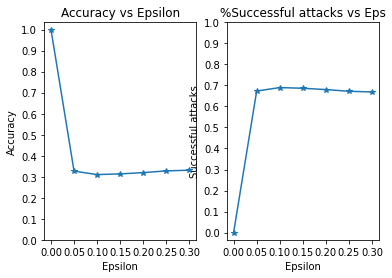

In [36]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


In [ ]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(EPSILONS)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(EPSILONS),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(EPSILONS[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.tight_layout()
plt.show()

Constant beta

In [34]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(model_beta_001, device, logits_val_dataloader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████▍                                      | 1/7 [00:03<00:20,  3.38s/it]

Epsilon: 0	Test Accuracy = 36674 / 36674 = 1.0	 Out of total of 50016 data points


 29%|████████████▊                                | 2/7 [00:06<00:16,  3.29s/it]

Epsilon: 0.05	Test Accuracy = 5709 / 36674 = 0.15566886961460114	 Out of total of 50016 data points


 43%|███████████████████▎                         | 3/7 [00:09<00:13,  3.26s/it]

Epsilon: 0.1	Test Accuracy = 552 / 36674 = 0.015051535330712795	 Out of total of 50016 data points


 57%|█████████████████████████▋                   | 4/7 [00:13<00:09,  3.25s/it]

Epsilon: 0.15	Test Accuracy = 250 / 36674 = 0.006816818378865719	 Out of total of 50016 data points


 71%|████████████████████████████████▏            | 5/7 [00:16<00:06,  3.24s/it]

Epsilon: 0.2	Test Accuracy = 145 / 36674 = 0.003953754901885986	 Out of total of 50016 data points


 86%|██████████████████████████████████████▌      | 6/7 [00:19<00:03,  3.23s/it]

Epsilon: 0.25	Test Accuracy = 94 / 36674 = 0.0025631238240748644	 Out of total of 50016 data points


100%|█████████████████████████████████████████████| 7/7 [00:22<00:00,  3.25s/it]

Epsilon: 0.3	Test Accuracy = 69 / 36674 = 0.0018814419163390994	 Out of total of 50016 data points


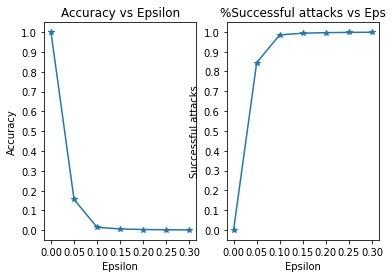

In [36]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


Dynamic beta

In [34]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(model_beta_dyn, device, logits_val_dataloader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████▍                                      | 1/7 [00:03<00:19,  3.32s/it]

Epsilon: 0	Test Accuracy = 37112 / 37112 = 1.0	 %succesful attacks: 0.0	 Out of total of 50016 data points


 29%|████████████▊                                | 2/7 [00:06<00:16,  3.31s/it]

Epsilon: 0.05	Test Accuracy = 34342 / 37112 = 0.9253610968589783	 %succesful attacks: 0.0746389308040526	 Out of total of 50016 data points


 43%|███████████████████▎                         | 3/7 [00:09<00:13,  3.31s/it]

Epsilon: 0.1	Test Accuracy = 32698 / 37112 = 0.8810627460479736	 %succesful attacks: 0.11893727096356974	 Out of total of 50016 data points


 57%|█████████████████████████▋                   | 4/7 [00:13<00:09,  3.31s/it]

Epsilon: 0.15	Test Accuracy = 30941 / 37112 = 0.8337195515632629	 %succesful attacks: 0.16628044837249406	 Out of total of 50016 data points


 71%|████████████████████████████████▏            | 5/7 [00:16<00:06,  3.31s/it]

Epsilon: 0.2	Test Accuracy = 28702 / 37112 = 0.773388683795929	 %succesful attacks: 0.22661133865057123	 Out of total of 50016 data points


 86%|██████████████████████████████████████▌      | 6/7 [00:19<00:03,  3.30s/it]

Epsilon: 0.25	Test Accuracy = 26362 / 37112 = 0.7103362679481506	 %succesful attacks: 0.289663720629446	 Out of total of 50016 data points


100%|█████████████████████████████████████████████| 7/7 [00:23<00:00,  3.31s/it]

Epsilon: 0.3	Test Accuracy = 24054 / 37112 = 0.6481461524963379	 %succesful attacks: 0.35185384781202844	 Out of total of 50016 data points


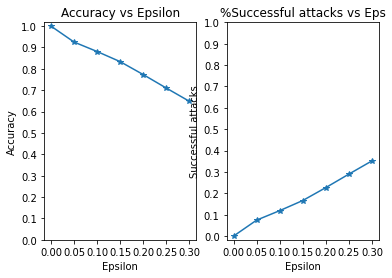

In [38]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


**Targeted attacks**

Original model

In [37]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(model, device, val_data_loader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████                                    | 1/7 [11:00<1:06:00, 660.07s/it]

Epsilon: 0	Test Accuracy = 38566 / 49929 = 0.7724168300628662	 %succesful attacks: 0.0	 Out of total of 50016 data points


 29%|████████████▌                               | 2/7 [22:00<55:00, 660.14s/it]

Epsilon: 0.05	Test Accuracy = 28398 / 49929 = 0.5687676668167114	 %succesful attacks: 0.0299625468164794	 Out of total of 50016 data points


 43%|██████████████████▊                         | 3/7 [33:02<44:03, 660.96s/it]

Epsilon: 0.1	Test Accuracy = 26429 / 49929 = 0.529331624507904	 %succesful attacks: 0.0263974844278876	 Out of total of 50016 data points


 57%|█████████████████████████▏                  | 4/7 [44:06<33:06, 662.14s/it]

Epsilon: 0.15	Test Accuracy = 25654 / 49929 = 0.5138096213340759	 %succesful attacks: 0.02147048809309219	 Out of total of 50016 data points


 71%|███████████████████████████████▍            | 5/7 [55:10<22:06, 663.02s/it]

Epsilon: 0.2	Test Accuracy = 25064 / 49929 = 0.5019928216934204	 %succesful attacks: 0.017584970658334836	 Out of total of 50016 data points


 86%|████████████████████████████████████      | 6/7 [1:06:14<11:03, 663.28s/it]

Epsilon: 0.25	Test Accuracy = 24425 / 49929 = 0.4891946613788605	 %succesful attacks: 0.014280277994752549	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 7/7 [1:17:20<00:00, 662.93s/it]

Epsilon: 0.3	Test Accuracy = 23646 / 49929 = 0.47359248995780945	 %succesful attacks: 0.012197320194676441	 Out of total of 50016 data points


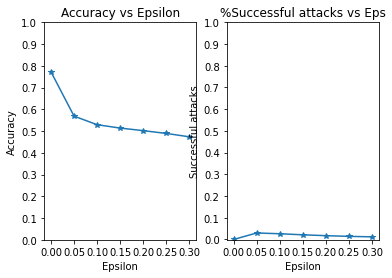

In [39]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


In [62]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(EPSILONS)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(EPSILONS),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(EPSILONS[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.tight_layout()
plt.show()

Constant beta

In [49]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(model_beta_001, device, logits_val_dataloader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████▍                                      | 1/7 [00:03<00:20,  3.43s/it]

Epsilon: 0	Test Accuracy = 36628 / 49933 = 0.7335429191589355	 %succesful attacks: 0.0	 Out of total of 50016 data points


 29%|████████████▊                                | 2/7 [00:06<00:16,  3.35s/it]

Epsilon: 0.05	Test Accuracy = 18288 / 49933 = 0.36625078320503235	 %succesful attacks: 0.0021628982837001583	 Out of total of 50016 data points


 43%|███████████████████▎                         | 3/7 [00:10<00:13,  3.33s/it]

Epsilon: 0.1	Test Accuracy = 8271 / 49933 = 0.16564196348190308	 %succesful attacks: 0.005907916608255062	 Out of total of 50016 data points


 57%|█████████████████████████▋                   | 4/7 [00:13<00:09,  3.32s/it]

Epsilon: 0.15	Test Accuracy = 4309 / 49933 = 0.08629563450813293	 %succesful attacks: 0.00783049286043298	 Out of total of 50016 data points


 71%|████████████████████████████████▏            | 5/7 [00:16<00:06,  3.31s/it]

Epsilon: 0.2	Test Accuracy = 2300 / 49933 = 0.04606172442436218	 %succesful attacks: 0.006929285242224581	 Out of total of 50016 data points


 86%|██████████████████████████████████████▌      | 6/7 [00:19<00:03,  3.31s/it]

Epsilon: 0.25	Test Accuracy = 1355 / 49933 = 0.027136363089084625	 %succesful attacks: 0.0060881581318967416	 Out of total of 50016 data points


100%|█████████████████████████████████████████████| 7/7 [00:23<00:00,  3.32s/it]

Epsilon: 0.3	Test Accuracy = 895 / 49933 = 0.01792401820421219	 %succesful attacks: 0.005727675084613382	 Out of total of 50016 data points


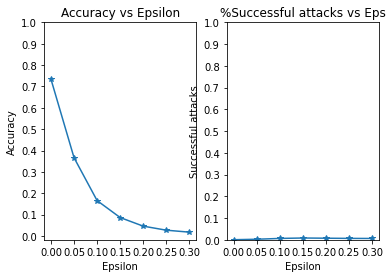

In [50]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


Dynamic beta

In [51]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(model_beta_dyn, device, logits_val_dataloader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████▍                                      | 1/7 [00:03<00:20,  3.40s/it]

Epsilon: 0	Test Accuracy = 37067 / 49938 = 0.7422603964805603	 %succesful attacks: 0.0	 Out of total of 50016 data points


 29%|████████████▊                                | 2/7 [00:06<00:16,  3.34s/it]

Epsilon: 0.05	Test Accuracy = 27300 / 49938 = 0.5466778874397278	 %succesful attacks: 0.00014017381553125876	 Out of total of 50016 data points


 43%|███████████████████▎                         | 3/7 [00:09<00:13,  3.31s/it]

Epsilon: 0.1	Test Accuracy = 10041 / 49938 = 0.20106932520866394	 %succesful attacks: 8.009932316071929e-05	 Out of total of 50016 data points


 57%|█████████████████████████▋                   | 4/7 [00:13<00:09,  3.30s/it]

Epsilon: 0.15	Test Accuracy = 5506 / 49938 = 0.11025671660900116	 %succesful attacks: 0.0	 Out of total of 50016 data points


 71%|████████████████████████████████▏            | 5/7 [00:16<00:06,  3.30s/it]

Epsilon: 0.2	Test Accuracy = 4033 / 49938 = 0.08076014369726181	 %succesful attacks: 2.0024830790179822e-05	 Out of total of 50016 data points


 86%|██████████████████████████████████████▌      | 6/7 [00:19<00:03,  3.29s/it]

Epsilon: 0.25	Test Accuracy = 3322 / 49938 = 0.06652248650789261	 %succesful attacks: 4.0049661580359644e-05	 Out of total of 50016 data points


100%|█████████████████████████████████████████████| 7/7 [00:23<00:00,  3.31s/it]

Epsilon: 0.3	Test Accuracy = 2850 / 49938 = 0.0570707693696022	 %succesful attacks: 6.007449237053947e-05	 Out of total of 50016 data points


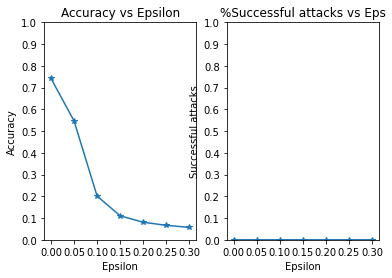

In [52]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


#### Hybrid model

Constant beta

In [34]:
hybrid_model = HybridModel(model, model_beta_001, device)

Untargeted

In [66]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████                                    | 1/7 [10:14<1:01:28, 614.78s/it]

Epsilon: 0	Test Accuracy = 36672 / 36674 = 0.9999454617500305	 %succesful attacks: 5.453454763592736e-05	 Out of total of 50016 data points


 29%|████████████▌                               | 2/7 [20:43<51:53, 622.69s/it]

Epsilon: 0.05	Test Accuracy = 15930 / 36674 = 0.43436768651008606	 %succesful attacks: 0.5656323280798385	 Out of total of 50016 data points


 43%|██████████████████▊                         | 3/7 [31:16<41:49, 627.47s/it]

Epsilon: 0.1	Test Accuracy = 15732 / 36674 = 0.42896875739097595	 %succesful attacks: 0.5710312482957954	 Out of total of 50016 data points


 57%|█████████████████████████▏                  | 4/7 [41:49<31:29, 629.93s/it]

Epsilon: 0.15	Test Accuracy = 15751 / 36674 = 0.42948684096336365	 %succesful attacks: 0.5705131700932541	 Out of total of 50016 data points


 71%|███████████████████████████████▍            | 5/7 [52:25<21:03, 631.96s/it]

Epsilon: 0.2	Test Accuracy = 15786 / 36674 = 0.4304411709308624	 %succesful attacks: 0.5695588155096254	 Out of total of 50016 data points


 86%|████████████████████████████████████      | 6/7 [1:03:01<10:33, 633.45s/it]

Epsilon: 0.25	Test Accuracy = 15684 / 36674 = 0.42765992879867554	 %succesful attacks: 0.5723400774390577	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 7/7 [1:13:40<00:00, 631.47s/it]

Epsilon: 0.3	Test Accuracy = 15514 / 36674 = 0.4230244755744934	 %succesful attacks: 0.5769755139881114	 Out of total of 50016 data points


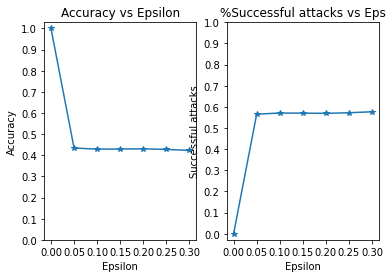

In [67]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


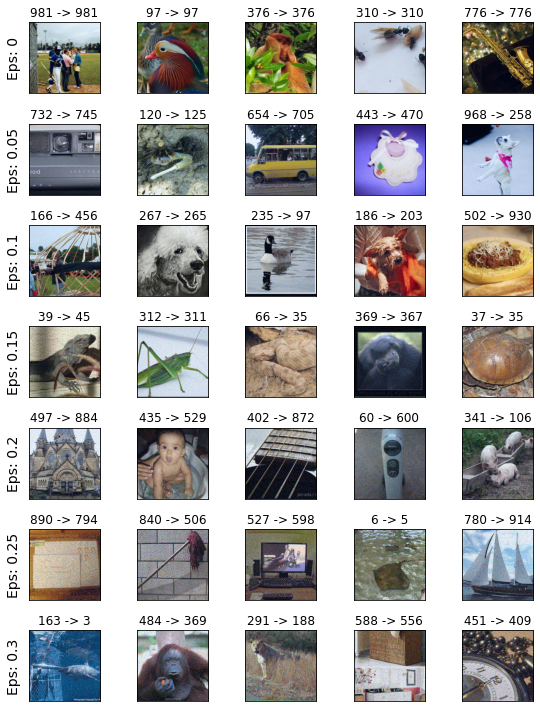

In [68]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(EPSILONS)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(EPSILONS),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(EPSILONS[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.tight_layout()
plt.show()

Targeted

In [35]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████                                   | 1/6 [12:39<1:03:15, 759.09s/it]

Epsilon: 0.05	Test Accuracy = 27477 / 49933 = 0.5502773523330688	 %succesful attacks: 0.0013017443374121322	 Out of total of 50016 data points


 33%|██████████████▋                             | 2/6 [25:55<52:04, 781.14s/it]

Epsilon: 0.1	Test Accuracy = 26814 / 49933 = 0.5369995832443237	 %succesful attacks: 0.0013417980093325056	 Out of total of 50016 data points


 50%|██████████████████████                      | 3/6 [39:16<39:30, 790.24s/it]

Epsilon: 0.15	Test Accuracy = 26308 / 49933 = 0.5268660187721252	 %succesful attacks: 0.0011215028137704524	 Out of total of 50016 data points


 67%|█████████████████████████████▎              | 4/6 [52:38<26:29, 794.76s/it]

Epsilon: 0.2	Test Accuracy = 25588 / 49933 = 0.5124467015266418	 %succesful attacks: 0.0011815833216510124	 Out of total of 50016 data points


 83%|███████████████████████████████████       | 5/6 [1:06:03<13:18, 798.40s/it]

Epsilon: 0.25	Test Accuracy = 24754 / 49933 = 0.4957442879676819	 %succesful attacks: 0.0012216369935713857	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 6/6 [1:19:26<00:00, 794.42s/it]

Epsilon: 0.3	Test Accuracy = 23763 / 49933 = 0.4758976995944977	 %succesful attacks: 0.0014018785172130654	 Out of total of 50016 data points


Dynamic beta

In [70]:
hybrid_model = HybridModel(model, model_beta_dyn, device)

Unargeted

In [71]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████                                    | 1/7 [10:20<1:02:03, 620.65s/it]

Epsilon: 0	Test Accuracy = 37108 / 37112 = 0.9998922348022461	 %succesful attacks: 0.00010778184953653804	 Out of total of 50016 data points


 29%|████████████▌                               | 2/7 [20:53<52:18, 627.75s/it]

Epsilon: 0.05	Test Accuracy = 20049 / 37112 = 0.5402295589447021	 %succesful attacks: 0.4597704246604872	 Out of total of 50016 data points


 43%|██████████████████▊                         | 3/7 [31:26<42:00, 630.18s/it]

Epsilon: 0.1	Test Accuracy = 18573 / 37112 = 0.5004580616950989	 %succesful attacks: 0.4995419271394697	 Out of total of 50016 data points


 57%|█████████████████████████▏                  | 4/7 [42:02<31:37, 632.58s/it]

Epsilon: 0.15	Test Accuracy = 17838 / 37112 = 0.48065316677093506	 %succesful attacks: 0.5193468419918086	 Out of total of 50016 data points


 71%|███████████████████████████████▍            | 5/7 [52:39<21:08, 634.10s/it]

Epsilon: 0.2	Test Accuracy = 17415 / 37112 = 0.4692552387714386	 %succesful attacks: 0.5307447725802975	 Out of total of 50016 data points


 86%|████████████████████████████████████      | 6/7 [1:03:16<10:35, 635.20s/it]

Epsilon: 0.25	Test Accuracy = 17004 / 37112 = 0.45818063616752625	 %succesful attacks: 0.5418193576201767	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 7/7 [1:13:53<00:00, 633.39s/it]

Epsilon: 0.3	Test Accuracy = 16474 / 37112 = 0.443899542093277	 %succesful attacks: 0.5561004526837681	 Out of total of 50016 data points


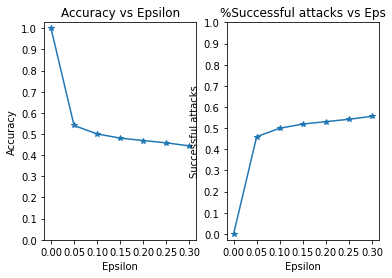

In [72]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


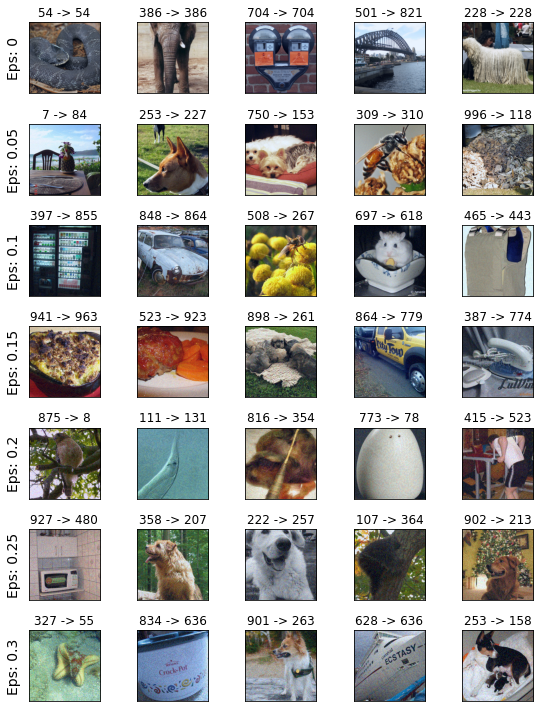

In [73]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(EPSILONS)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(EPSILONS),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(EPSILONS[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.tight_layout()
plt.show()

Targeted

In [75]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████                                    | 1/7 [10:43<1:04:23, 643.88s/it]

Epsilon: 0	Test Accuracy = 37067 / 49938 = 0.7422603964805603	 %succesful attacks: 0.0	 Out of total of 50016 data points


 29%|████████████▌                               | 2/7 [21:43<54:24, 652.95s/it]

Epsilon: 0.05	Test Accuracy = 26287 / 49938 = 0.5263926982879639	 %succesful attacks: 0.00040049661580359645	 Out of total of 50016 data points


 43%|██████████████████▊                         | 3/7 [32:47<43:52, 658.03s/it]

Epsilon: 0.1	Test Accuracy = 24864 / 49938 = 0.4978973865509033	 %succesful attacks: 0.0005807200929152149	 Out of total of 50016 data points


 57%|█████████████████████████▏                  | 4/7 [43:51<33:01, 660.37s/it]

Epsilon: 0.15	Test Accuracy = 24164 / 49938 = 0.48388001322746277	 %succesful attacks: 0.0006007449237053947	 Out of total of 50016 data points


 71%|███████████████████████████████▍            | 5/7 [54:55<22:03, 661.89s/it]

Epsilon: 0.2	Test Accuracy = 23582 / 49938 = 0.472225546836853	 %succesful attacks: 0.00046057110817413594	 Out of total of 50016 data points


 86%|████████████████████████████████████      | 6/7 [1:05:59<11:02, 662.41s/it]

Epsilon: 0.25	Test Accuracy = 23048 / 49938 = 0.4615322947502136	 %succesful attacks: 0.00042052144659377626	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 7/7 [1:17:02<00:00, 660.38s/it]

Epsilon: 0.3	Test Accuracy = 22310 / 49938 = 0.44675397872924805	 %succesful attacks: 0.00048059593896431575	 Out of total of 50016 data points


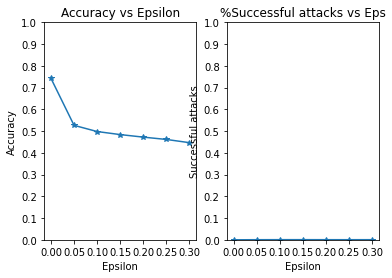

In [76]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


### New loss function

In [13]:
beta_model_dict = {10: "/D/models/cifar_new_loss_10_time_1684054963.pkl",
5: "/D/models/cifar_new_loss_5_time_1684066906.pkl",
1: "/D/models/cifar_new_loss_1_time_1684078849.pkl",
0.1: "/D/models/imagenet_new_loss_0.1_time_1684098473.pkl",
0.01: "/D/models/imagenet_new_loss_0.01_time_1684109202.pkl"}

In [14]:
# Load the pretrained Inception V3 model
inception_encoder = torchvision.models.inception_v3(pretrained=True)
_ = inception_encoder.eval()

# Move the model to the GPU if available
_ = inception_encoder.to(device)

In [15]:
with open(beta_model_dict[0.1], 'rb') as f:
    vib_classifier = pickle.load(f)

hybrid_model = HybridModel(inception_encoder, vib_classifier, device)

Untargeted

In [18]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████                                    | 1/7 [12:01<1:12:06, 721.10s/it]

Epsilon: 0	Test Accuracy = 37026 / 37029 = 0.9999189972877502	 %succesful attacks: 8.101758081503687e-05	 Out of total of 50016 data points


 29%|████████████                              | 2/7 [24:30<1:01:30, 738.04s/it]

Epsilon: 0.05	Test Accuracy = 20250 / 37029 = 0.5468686819076538	 %succesful attacks: 0.45313132949850116	 Out of total of 50016 data points


 43%|██████████████████▊                         | 3/7 [37:15<49:59, 749.94s/it]

Epsilon: 0.1	Test Accuracy = 18492 / 37029 = 0.4993923604488373	 %succesful attacks: 0.5006076318561128	 Out of total of 50016 data points


 57%|█████████████████████████▏                  | 4/7 [49:56<37:42, 754.28s/it]

Epsilon: 0.15	Test Accuracy = 17656 / 37029 = 0.47681546211242676	 %succesful attacks: 0.5231845310432364	 Out of total of 50016 data points


 71%|██████████████████████████████            | 5/7 [1:02:37<25:13, 756.86s/it]

Epsilon: 0.2	Test Accuracy = 17199 / 37029 = 0.46447378396987915	 %succesful attacks: 0.5355262091873937	 Out of total of 50016 data points


 86%|████████████████████████████████████      | 6/7 [1:15:18<12:38, 758.23s/it]

Epsilon: 0.25	Test Accuracy = 16680 / 37029 = 0.45045775175094604	 %succesful attacks: 0.549542250668395	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 7/7 [1:27:57<00:00, 753.98s/it]

Epsilon: 0.3	Test Accuracy = 16168 / 37029 = 0.4366307556629181	 %succesful attacks: 0.5633692511274947	 Out of total of 50016 data points


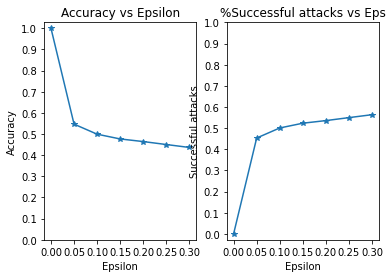

In [20]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


Targeted

In [25]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████                                   | 1/6 [12:41<1:03:25, 761.17s/it]

Epsilon: 0.05	Test Accuracy = 24998 / 49927 = 0.5006909966468811	 %succesful attacks: 0.0005808480381356781	 Out of total of 50016 data points


 33%|██████████████▋                             | 2/6 [25:44<51:37, 774.32s/it]

Epsilon: 0.1	Test Accuracy = 23814 / 49927 = 0.4769763946533203	 %succesful attacks: 0.0007010234943016805	 Out of total of 50016 data points


 50%|██████████████████████                      | 3/6 [38:47<38:54, 778.17s/it]

Epsilon: 0.15	Test Accuracy = 23433 / 49927 = 0.46934524178504944	 %succesful attacks: 0.0006209065235243456	 Out of total of 50016 data points


 67%|█████████████████████████████▎              | 4/6 [51:51<26:01, 780.64s/it]

Epsilon: 0.2	Test Accuracy = 23092 / 49927 = 0.462515264749527	 %succesful attacks: 0.0007210527369960142	 Out of total of 50016 data points


 83%|███████████████████████████████████       | 5/6 [1:05:01<13:03, 783.93s/it]

Epsilon: 0.25	Test Accuracy = 22646 / 49927 = 0.453582227230072	 %succesful attacks: 0.0007611112223846816	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 6/6 [1:18:24<00:00, 784.08s/it]

Epsilon: 0.3	Test Accuracy = 22028 / 49927 = 0.44120416045188904	 %succesful attacks: 0.0007410819796903479	 Out of total of 50016 data points


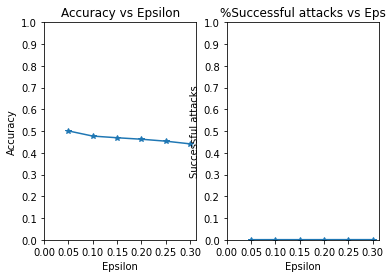

In [26]:
fig, ax = plt.subplots(1, 2)
_ = ax[0].plot(EPSILONS, accuracies, "*-")
_ = ax[0].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[0].set_title("Accuracy vs Epsilon")
_ = ax[0].set_xlabel("Epsilon")
_ = ax[0].set_ylabel("Accuracy")

_ = ax[1].plot(EPSILONS, total_succesful_attacks_list, "*-")
_ = ax[1].set_yticks(np.arange(0, 1.1, step=0.1))
_ = ax[1].set_xticks(np.arange(0, .35, step=0.05))
_ = ax[1].set_title("%Successful attacks vs Eps")
_ = ax[1].set_xlabel("Epsilon")
_ = ax[1].set_ylabel("Successful attacks")


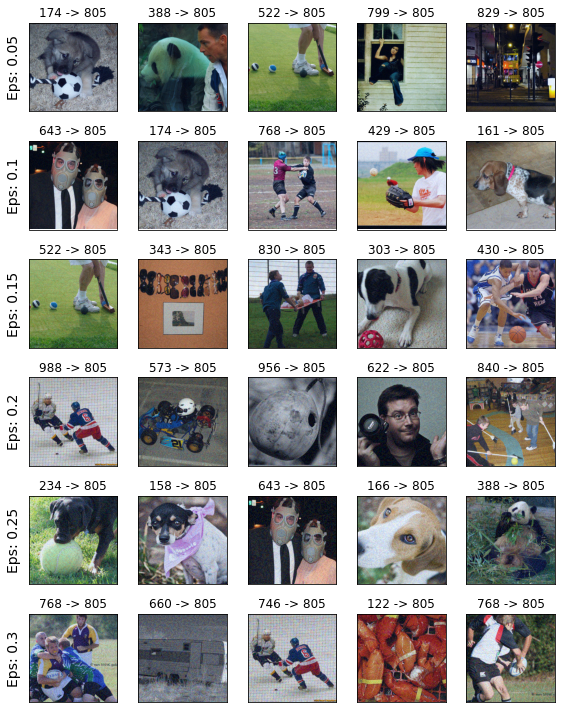

In [27]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(EPSILONS)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(EPSILONS),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(EPSILONS[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.tight_layout()
plt.show()

#### New loss CIFAR

In [15]:
pretrained_cifar_model = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_repvgg_a2", pretrained=True)
pretrained_cifar_model = pretrained_cifar_model.to(device)
with open('/D/models/cifar_new_loss_100_time_1684181795.pkl', 'rb') as f:
    cifar_hybrid_model = pickle.load(f)

Using cache found in /home/nir/.cache/torch/hub/chenyaofo_pytorch-cifar-models_master


Untargeted

In [22]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(cifar_hybrid_model, device, cifar_test_loader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████▍                                      | 1/7 [00:14<01:29, 14.95s/it]

Epsilon: 0	Test Accuracy = 7618 / 7618 = 1.0	 %succesful attacks: 0.0	 Out of total of 10112 data points


 29%|████████████▊                                | 2/7 [00:29<01:14, 14.97s/it]

Epsilon: 0.05	Test Accuracy = 2168 / 7618 = 0.28458914160728455	 %succesful attacks: 0.7154108689944867	 Out of total of 10112 data points


 43%|███████████████████▎                         | 3/7 [00:45<01:00, 15.02s/it]

Epsilon: 0.1	Test Accuracy = 1423 / 7618 = 0.1867944300174713	 %succesful attacks: 0.8132055657652927	 Out of total of 10112 data points


 57%|█████████████████████████▋                   | 4/7 [01:00<00:45, 15.07s/it]

Epsilon: 0.15	Test Accuracy = 1121 / 7618 = 0.14715148508548737	 %succesful attacks: 0.8528485166710422	 Out of total of 10112 data points


 71%|████████████████████████████████▏            | 5/7 [01:15<00:30, 15.13s/it]

Epsilon: 0.2	Test Accuracy = 921 / 7618 = 0.12089787423610687	 %succesful attacks: 0.8791021265423996	 Out of total of 10112 data points


 86%|██████████████████████████████████████▌      | 6/7 [01:30<00:15, 15.17s/it]

Epsilon: 0.25	Test Accuracy = 756 / 7618 = 0.09923864901065826	 %succesful attacks: 0.9007613546862694	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 7/7 [01:45<00:00, 15.14s/it]

Epsilon: 0.3	Test Accuracy = 644 / 7618 = 0.08453662693500519	 %succesful attacks: 0.9154633762142295	 Out of total of 10112 data points


Targeted

In [23]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(cifar_hybrid_model, device, cifar_test_loader, eps, is_image=False, target_label=15)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████▍                                      | 1/7 [00:15<01:35, 15.86s/it]

Epsilon: 0	Test Accuracy = 7542 / 9882 = 0.7632058262825012	 %succesful attacks: 0.0	 Out of total of 10112 data points


 29%|████████████▊                                | 2/7 [00:31<01:19, 15.89s/it]

Epsilon: 0.05	Test Accuracy = 4661 / 9882 = 0.4716656506061554	 %succesful attacks: 0.03936450111313499	 Out of total of 10112 data points


 43%|███████████████████▎                         | 3/7 [00:47<01:03, 15.93s/it]

Epsilon: 0.1	Test Accuracy = 3628 / 9882 = 0.36713215708732605	 %succesful attacks: 0.03784658975915806	 Out of total of 10112 data points


 57%|█████████████████████████▋                   | 4/7 [01:03<00:47, 15.96s/it]

Epsilon: 0.15	Test Accuracy = 2921 / 9882 = 0.2955879271030426	 %succesful attacks: 0.02671523982999393	 Out of total of 10112 data points


 71%|████████████████████████████████▏            | 5/7 [01:19<00:31, 15.99s/it]

Epsilon: 0.2	Test Accuracy = 2285 / 9882 = 0.23122850060462952	 %succesful attacks: 0.013458814005262092	 Out of total of 10112 data points


 86%|██████████████████████████████████████▌      | 6/7 [01:35<00:16, 16.02s/it]

Epsilon: 0.25	Test Accuracy = 1720 / 9882 = 0.1740538328886032	 %succesful attacks: 0.005970451325642582	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 7/7 [01:52<00:00, 16.03s/it]

Epsilon: 0.3	Test Accuracy = 1306 / 9882 = 0.13215948641300201	 %succesful attacks: 0.0024286581663630845	 Out of total of 10112 data points


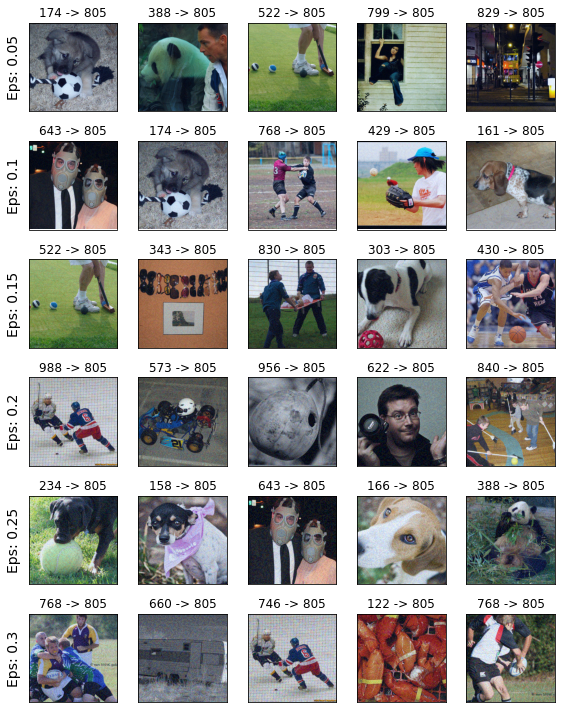

In [27]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(EPSILONS)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(EPSILONS),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(EPSILONS[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.tight_layout()
plt.show()

#### New loss MNIST

In [14]:
# Load the pretrained Inception V3 model
inception_encoder = torchvision.models.inception_v3(pretrained=True)
_ = inception_encoder.eval()

# Move the model to the GPU if available
_ = inception_encoder.to(device)

In [15]:
with open(beta_model_dict[0.1], 'rb') as f:
    vib_classifier = pickle.load(f)

hybrid_model = HybridModel(inception_encoder, vib_classifier, device)

Untargeted

In [18]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████                                    | 1/7 [12:01<1:12:06, 721.10s/it]

Epsilon: 0	Test Accuracy = 37026 / 37029 = 0.9999189972877502	 %succesful attacks: 8.101758081503687e-05	 Out of total of 50016 data points


 29%|████████████                              | 2/7 [24:30<1:01:30, 738.04s/it]

Epsilon: 0.05	Test Accuracy = 20250 / 37029 = 0.5468686819076538	 %succesful attacks: 0.45313132949850116	 Out of total of 50016 data points


 43%|██████████████████▊                         | 3/7 [37:15<49:59, 749.94s/it]

Epsilon: 0.1	Test Accuracy = 18492 / 37029 = 0.4993923604488373	 %succesful attacks: 0.5006076318561128	 Out of total of 50016 data points


 57%|█████████████████████████▏                  | 4/7 [49:56<37:42, 754.28s/it]

Epsilon: 0.15	Test Accuracy = 17656 / 37029 = 0.47681546211242676	 %succesful attacks: 0.5231845310432364	 Out of total of 50016 data points


 71%|██████████████████████████████            | 5/7 [1:02:37<25:13, 756.86s/it]

Epsilon: 0.2	Test Accuracy = 17199 / 37029 = 0.46447378396987915	 %succesful attacks: 0.5355262091873937	 Out of total of 50016 data points


 86%|████████████████████████████████████      | 6/7 [1:15:18<12:38, 758.23s/it]

Epsilon: 0.25	Test Accuracy = 16680 / 37029 = 0.45045775175094604	 %succesful attacks: 0.549542250668395	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 7/7 [1:27:57<00:00, 753.98s/it]

Epsilon: 0.3	Test Accuracy = 16168 / 37029 = 0.4366307556629181	 %succesful attacks: 0.5633692511274947	 Out of total of 50016 data points


Targeted

In [25]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████                                   | 1/6 [12:41<1:03:25, 761.17s/it]

Epsilon: 0.05	Test Accuracy = 24998 / 49927 = 0.5006909966468811	 %succesful attacks: 0.0005808480381356781	 Out of total of 50016 data points


 33%|██████████████▋                             | 2/6 [25:44<51:37, 774.32s/it]

Epsilon: 0.1	Test Accuracy = 23814 / 49927 = 0.4769763946533203	 %succesful attacks: 0.0007010234943016805	 Out of total of 50016 data points


 50%|██████████████████████                      | 3/6 [38:47<38:54, 778.17s/it]

Epsilon: 0.15	Test Accuracy = 23433 / 49927 = 0.46934524178504944	 %succesful attacks: 0.0006209065235243456	 Out of total of 50016 data points


 67%|█████████████████████████████▎              | 4/6 [51:51<26:01, 780.64s/it]

Epsilon: 0.2	Test Accuracy = 23092 / 49927 = 0.462515264749527	 %succesful attacks: 0.0007210527369960142	 Out of total of 50016 data points


 83%|███████████████████████████████████       | 5/6 [1:05:01<13:03, 783.93s/it]

Epsilon: 0.25	Test Accuracy = 22646 / 49927 = 0.453582227230072	 %succesful attacks: 0.0007611112223846816	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 6/6 [1:18:24<00:00, 784.08s/it]

Epsilon: 0.3	Test Accuracy = 22028 / 49927 = 0.44120416045188904	 %succesful attacks: 0.0007410819796903479	 Out of total of 50016 data points


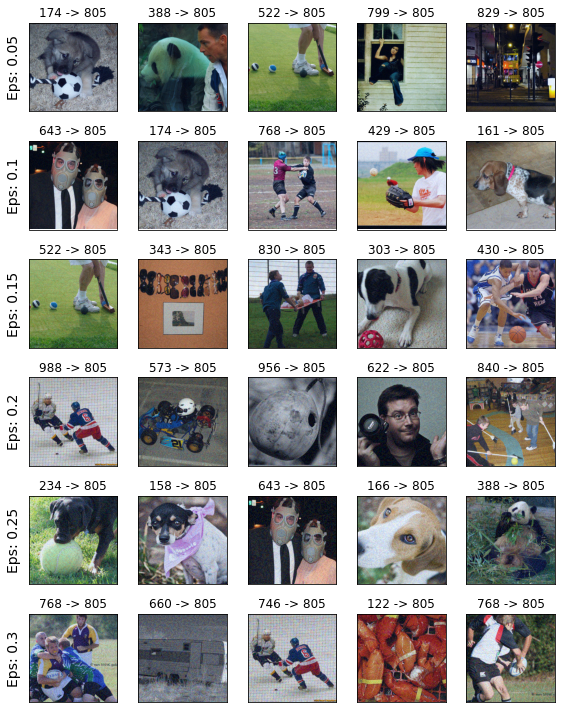

In [27]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(EPSILONS)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(EPSILONS),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(EPSILONS[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.tight_layout()
plt.show()

### New models

Constant high beta

In [44]:
def fetch_scalar_data(run_id, metric_name):
    api = wandb.Api()
    run = api.run(f"reichman_uni/dynamic_beta/{run_id}")
    history = run.history(keys=[metric_name], samples=1000)  # You can adjust the number of samples
    return history[metric_name].values

In [247]:
run_id = "62f3f4hn"

run_train_loss = fetch_scalar_data(run_id, "charts/epoch_train_loss")
run_total_kld = fetch_scalar_data(run_id, "charts/epoch_total_kld")


In [248]:
delta_kld = run_total_kld[:-1] - run_total_kld[1:]
delta_loss = run_train_loss[:-1] - run_train_loss[1:]

In [251]:
delta_kld / (delta_kld + delta_loss)

array([0.99929004, 0.99956179, 0.99926216, 0.99880411, 0.98315367,
       0.99830395, 0.99893169, 0.99937622, 1.01074496, 0.99958369,
       0.99949236, 0.99973432, 0.99958175, 0.99981343, 0.99970865,
       0.99984191, 0.99980794, 0.99986779, 0.99985331, 0.99981655,
       1.000046  , 0.99995004, 0.99997715, 0.99647001, 0.99983752,
       1.00005015, 1.00010461, 1.00005085, 1.00060665, 1.00054354,
       1.00007487, 1.00017103, 0.99917865, 0.99878049, 1.02163553,
       1.00007517, 1.00089279, 1.00033132, 0.99958811, 1.00015533,
       1.00112741, 0.9988394 , 0.99998897, 1.00146636, 0.99853653,
       1.00002772, 1.00402725, 1.00010225, 1.00044733, 1.00016155,
       1.00010533, 1.00750154, 1.00015628, 1.00010333, 1.00030388,
       1.00063888, 1.0004295 , 1.00465267, 1.00065349, 1.00051396,
       0.99425663, 1.00367204, 1.00288562, 1.00129841, 0.99582042,
       0.998231  , 1.0024784 , 0.99930716, 0.99733383])

In [79]:
run_id = "62f3f4hn"
metric_name = "charts/avg_epoch_ratio"

scalar_data = fetch_scalar_data(run_id, metric_name)
average = np.mean(scalar_data)

print(f"Average of {metric_name} over run {run_id}: {average}")

Average of charts/avg_epoch_ratio over run 62f3f4hn: 0.039361155325812955


#### Constant model wth $\beta=0.04$ and minibatches

In [12]:
LR = 1e-4
EPOCHS = 70
BETA = 4e-2
NUM_MINIBATCHES = 4

run_name = f"vib_imagenet_beta0.04_new_logits_70epochs_time_{int(time.time())}"

constant_vib_beta_004_classifier = VIB(2048, device).to(device)
optimizer = optim.Adam(constant_vib_beta_004_classifier.parameters(), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(constant_vib_beta_004_classifier, logits_trian_dataloader, logits_val_dataloader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=False, run_name=run_name)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: nirzvi89 (reichman_uni). Use `wandb login --relogin` to force relogin


100%|███████████████████████████████████████| 70/70 [13:18:43<00:00, 684.63s/it]


In [14]:
# with open(f'/D/models/{run_name}.pkl', 'wb') as f:
#     pickle.dump(constant_vib_beta_004_classifier, f)
# print(f'Saved model to /D/models/{run_name}.pkl')

Saved model to /D/models/vib_imagenet_beta0.04_new_logits_70epochs_time_1682964900.pkl


In [15]:
test_model(constant_vib_beta_004_classifier, logits_val_dataloader)

100%|█████████████████████████████████████| 1563/1563 [00:01<00:00, 1458.19it/s]

tensor(0.7404, device='cuda:0')
acc: None


In [14]:
with open("/D/models/vib_imagenet_beta0.04_new_logits_70epochs_time_1682964900.pkl", 'rb') as f:
    constant_vib_beta_004_classifier = pickle.load(f)

In [15]:
hybrid_model = HybridModel(model, constant_vib_beta_004_classifier, device)

In [16]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████                                    | 1/7 [10:19<1:01:58, 619.70s/it]

Epsilon: 0	Test Accuracy = 37020 / 37022 = 0.9999459981918335	 %succesful attacks: 5.402193290475933e-05	 Out of total of 50016 data points


 29%|████████████▌                               | 2/7 [20:50<52:10, 626.16s/it]

Epsilon: 0.05	Test Accuracy = 17609 / 37022 = 0.4756360948085785	 %succesful attacks: 0.5243638917400465	 Out of total of 50016 data points


 43%|██████████████████▊                         | 3/7 [31:22<41:56, 629.10s/it]

Epsilon: 0.1	Test Accuracy = 17143 / 37022 = 0.4630489945411682	 %succesful attacks: 0.5369510021068554	 Out of total of 50016 data points


 57%|█████████████████████████▏                  | 4/7 [41:56<31:32, 630.89s/it]

Epsilon: 0.15	Test Accuracy = 17008 / 37022 = 0.45940253138542175	 %succesful attacks: 0.5405974825779266	 Out of total of 50016 data points


 71%|███████████████████████████████▍            | 5/7 [52:27<21:02, 631.05s/it]

Epsilon: 0.2	Test Accuracy = 16883 / 37022 = 0.4560261368751526	 %succesful attacks: 0.5439738533844741	 Out of total of 50016 data points


 86%|████████████████████████████████████      | 6/7 [1:02:59<10:31, 631.29s/it]

Epsilon: 0.25	Test Accuracy = 16659 / 37022 = 0.4499756991863251	 %succesful attacks: 0.5500243098698071	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 7/7 [1:13:32<00:00, 630.29s/it]

Epsilon: 0.3	Test Accuracy = 16338 / 37022 = 0.44130516052246094	 %succesful attacks: 0.5586948301010211	 Out of total of 50016 data points


Targeted

In [18]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 14%|██████                                    | 1/7 [10:46<1:04:40, 646.75s/it]

Epsilon: 0	Test Accuracy = 36976 / 49940 = 0.7404084801673889	 %succesful attacks: 0.0	 Out of total of 50016 data points


 29%|████████████▌                               | 2/7 [21:47<54:34, 654.92s/it]

Epsilon: 0.05	Test Accuracy = 28238 / 49940 = 0.5654385089874268	 %succesful attacks: 0.0009411293552262715	 Out of total of 50016 data points


 43%|██████████████████▊                         | 3/7 [32:46<43:47, 656.80s/it]

Epsilon: 0.1	Test Accuracy = 27479 / 49940 = 0.5502402782440186	 %succesful attacks: 0.0010612735282338806	 Out of total of 50016 data points


 57%|█████████████████████████▏                  | 4/7 [43:50<32:59, 659.67s/it]

Epsilon: 0.15	Test Accuracy = 26786 / 49940 = 0.5363636612892151	 %succesful attacks: 0.0011213456147376852	 Out of total of 50016 data points


 71%|███████████████████████████████▍            | 5/7 [54:54<22:02, 661.12s/it]

Epsilon: 0.2	Test Accuracy = 26097 / 49940 = 0.522567093372345	 %succesful attacks: 0.0009010812975570685	 Out of total of 50016 data points


 86%|████████████████████████████████████      | 6/7 [1:06:00<11:02, 662.96s/it]

Epsilon: 0.25	Test Accuracy = 25307 / 49940 = 0.5067480802536011	 %succesful attacks: 0.0009010812975570685	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 7/7 [1:17:07<00:00, 661.10s/it]

Epsilon: 0.3	Test Accuracy = 24443 / 49940 = 0.48944732546806335	 %succesful attacks: 0.0008209851822186623	 Out of total of 50016 data points


Best so far on lowest beta:
- 54% acc for dyn
    * Scored 74.22% on val set
- 47.5% acc for const with $\beta=0.04$ which is same as our average
    * Scored 74.04% acc on val set
- 43% acc for const with $\beta=0.01$
- 32% acc for original

##### Dynamic beta with higher beta

In [22]:
LR = 1e-4
EPOCHS = 70
BETA = 0.1
NUM_MINIBATCHES = 4

run_name = f"vib_imagenet_dynamic_beta_01_epochs_time_{int(time.time())}"

dyn_beta_01 = VIB(2048, device).to(device)
optimizer = optim.Adam(dyn_beta_01.parameters(), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(dyn_beta_01, logits_trian_dataloader, logits_val_dataloader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=True, run_name=run_name)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: nirzvi89 (reichman_uni). Use `wandb login --relogin` to force relogin


100%|███████████████████████████████████████| 70/70 [13:40:03<00:00, 702.91s/it]


In [23]:
# with open(f'/D/models/{run_name}.pkl', 'wb') as f:
#     pickle.dump(dyn_beta_01, f)
# print(f'Saved model to /D/models/{run_name}.pkl')

Saved model to /D/models/vib_imagenet_dynamic_beta_01_epochs_time_1683025405.pkl


In [19]:
with open('/D/models/vib_imagenet_dynamic_beta_01_epochs_time_1683025405.pkl', 'rb') as f:
    dyn_beta_01 = pickle.load(f)

In [23]:
hybrid_model = HybridModel(model, dyn_beta_01, device)

In [27]:
test_model(hybrid_model, val_data_loader)

100%|███████████████████████████████████████| 1563/1563 [04:44<00:00,  5.48it/s]

tensor(0.7438, device='cuda:0')
acc: None


In [24]:
EPSILONS = [.05, .1, .15, .2, .25, .3]

untargeted

In [25]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▎                                    | 1/6 [10:11<50:59, 611.86s/it]

Epsilon: 0.05	Test Accuracy = 10835 / 37189 = 0.2913495898246765	 %succesful attacks: 0.7086504073785259	 Out of total of 50016 data points


 33%|██████████████▋                             | 2/6 [20:32<41:08, 617.12s/it]

Epsilon: 0.1	Test Accuracy = 9911 / 37189 = 0.26650354266166687	 %succesful attacks: 0.7334964640081745	 Out of total of 50016 data points


 50%|██████████████████████                      | 3/6 [30:51<30:54, 618.12s/it]

Epsilon: 0.15	Test Accuracy = 9942 / 37189 = 0.2673371136188507	 %succesful attacks: 0.7326628841861841	 Out of total of 50016 data points


 67%|█████████████████████████████▎              | 4/6 [41:13<20:39, 619.60s/it]

Epsilon: 0.2	Test Accuracy = 10103 / 37189 = 0.27166634798049927	 %succesful attacks: 0.7283336470461695	 Out of total of 50016 data points


 83%|████████████████████████████████████▋       | 5/6 [51:39<10:21, 621.81s/it]

Epsilon: 0.25	Test Accuracy = 10316 / 37189 = 0.2773938477039337	 %succesful attacks: 0.7226061469789454	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 6/6 [1:02:06<00:00, 621.15s/it]

Epsilon: 0.3	Test Accuracy = 10389 / 37189 = 0.27935680747032166	 %succesful attacks: 0.7206432009465165	 Out of total of 50016 data points


Targeted

In [26]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▎                                    | 1/6 [10:53<54:25, 653.14s/it]

Epsilon: 0.05	Test Accuracy = 32719 / 49936 = 0.6552186608314514	 %succesful attacks: 0.0004405639218199295	 Out of total of 50016 data points


 33%|██████████████▋                             | 2/6 [21:46<43:32, 653.04s/it]

Epsilon: 0.1	Test Accuracy = 31519 / 49936 = 0.631187915802002	 %succesful attacks: 0.0006408202499198974	 Out of total of 50016 data points


 50%|██████████████████████                      | 3/6 [32:39<32:39, 653.06s/it]

Epsilon: 0.15	Test Accuracy = 30515 / 49936 = 0.6110821962356567	 %succesful attacks: 0.0006207946171099006	 Out of total of 50016 data points


 67%|█████████████████████████████▎              | 4/6 [43:34<21:47, 653.81s/it]

Epsilon: 0.2	Test Accuracy = 29643 / 49936 = 0.5936198234558105	 %succesful attacks: 0.0005607177186799103	 Out of total of 50016 data points


 83%|████████████████████████████████████▋       | 5/6 [54:25<10:53, 653.00s/it]

Epsilon: 0.25	Test Accuracy = 28678 / 49936 = 0.5742951035499573	 %succesful attacks: 0.0005607177186799103	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 6/6 [1:05:22<00:00, 653.75s/it]

Epsilon: 0.3	Test Accuracy = 27617 / 49936 = 0.5530478954315186	 %succesful attacks: 0.0004806151874399231	 Out of total of 50016 data points


#### Dynamic beta with high beta

In [ ]:
LR = 1e-4
EPOCHS = 70
BETA = 1
NUM_MINIBATCHES = 4

run_name = f"vib_imagenet_dynamic_beta_1_epochs_time_{int(time.time())}"

dyn_beta_1 = VIB(2048, device).to(device)
optimizer = optim.Adam(dyn_beta_1.parameters(), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(dyn_beta_1, logits_trian_dataloader, logits_val_dataloader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=True, run_name=run_name)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: nirzvi89 (reichman_uni). Use `wandb login --relogin` to force relogin


 54%|████████████████████▋                 | 38/70 [7:22:55<6:14:03, 701.35s/it]

In [ ]:
# with open(f'/D/models/{run_name}.pkl', 'wb') as f:
#     pickle.dump(dyn_beta_1, f)
# print(f'Saved model to /D/models/{run_name}.pkl')

In [ ]:
with open('/D/models/vib_imagenet_dynamic_beta_1_epochs_time_1683098947.pkl', 'rb') as f:
    dyn_beta_1 = pickle.load(f)

In [25]:
hybrid_model = HybridModel(model, dyn_beta_1, device)

In [26]:
test_model(hybrid_model, val_data_loader)

100%|███████████████████████████████████████| 1563/1563 [04:43<00:00,  5.52it/s]

tensor(0.7459, device='cuda:0')
acc: None


untargeted

In [32]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▎                                    | 1/6 [10:18<51:34, 618.80s/it]

Epsilon: 0.05	Test Accuracy = 9267 / 37297 = 0.24846503138542175	 %succesful attacks: 0.7515349760034319	 Out of total of 50016 data points


 33%|██████████████▋                             | 2/6 [20:46<41:35, 623.80s/it]

Epsilon: 0.1	Test Accuracy = 9105 / 37297 = 0.2441215068101883	 %succesful attacks: 0.7558784888865057	 Out of total of 50016 data points


 50%|██████████████████████                      | 3/6 [31:17<31:21, 627.08s/it]

Epsilon: 0.15	Test Accuracy = 9426 / 37297 = 0.25272810459136963	 %succesful attacks: 0.7472718985441188	 Out of total of 50016 data points


 67%|█████████████████████████████▎              | 4/6 [41:48<20:57, 628.86s/it]

Epsilon: 0.2	Test Accuracy = 9758 / 37297 = 0.2616296112537384	 %succesful attacks: 0.7383703783146097	 Out of total of 50016 data points


 83%|████████████████████████████████████▋       | 5/6 [52:20<10:30, 630.10s/it]

Epsilon: 0.25	Test Accuracy = 10086 / 37297 = 0.27042388916015625	 %succesful attacks: 0.7295761053167815	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 6/6 [1:02:54<00:00, 629.05s/it]

Epsilon: 0.3	Test Accuracy = 10262 / 37297 = 0.27514275908470154	 %succesful attacks: 0.7248572271228249	 Out of total of 50016 data points


Targeted

In [33]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(hybrid_model, device, val_data_loader, eps, is_image=False, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▎                                    | 1/6 [10:55<54:35, 655.11s/it]

Epsilon: 0.05	Test Accuracy = 34041 / 49939 = 0.6816515922546387	 %succesful attacks: 0.0005206351749133943	 Out of total of 50016 data points


 33%|██████████████▋                             | 2/6 [21:48<43:36, 654.24s/it]

Epsilon: 0.1	Test Accuracy = 32878 / 49939 = 0.6583632230758667	 %succesful attacks: 0.000560684034522117	 Out of total of 50016 data points


 50%|██████████████████████                      | 3/6 [32:44<32:44, 654.76s/it]

Epsilon: 0.15	Test Accuracy = 31919 / 49939 = 0.6391597986221313	 %succesful attacks: 0.0005807084643264783	 Out of total of 50016 data points


 67%|█████████████████████████████▎              | 4/6 [43:43<21:53, 656.66s/it]

Epsilon: 0.2	Test Accuracy = 30979 / 49939 = 0.6203368306159973	 %succesful attacks: 0.0006808306133482849	 Out of total of 50016 data points


 83%|████████████████████████████████████▋       | 5/6 [54:43<10:57, 657.84s/it]

Epsilon: 0.25	Test Accuracy = 29847 / 49939 = 0.5976691842079163	 %succesful attacks: 0.0005807084643264783	 Out of total of 50016 data points


100%|██████████████████████████████████████████| 6/6 [1:05:41<00:00, 656.99s/it]

Epsilon: 0.3	Test Accuracy = 28478 / 49939 = 0.570255696773529	 %succesful attacks: 0.0006608061835439236	 Out of total of 50016 data points


Compute $\beta$ as derivative

In [51]:
import math
run_id = "yt6va6ze"

izx_bound = math.log(1000, 2) - fetch_scalar_data(run_id, "charts/epoch_total_kld")
izx_bound = fetch_scalar_data(run_id, "charts/epoch_total_kld")
izy_bound = fetch_scalar_data(run_id, "charts/epoch_classification_loss")

# print(f"Average of {metric_name} over run {run_id}: {average}")

#### Rebuilding for MNIST

In [62]:
from torchvision.datasets import MNIST

Data

In [63]:
MNIST_DATASET_DIR = '/D/datasets/MNIST'
BATCH_SIZE = 128
NUM_WORKERS = 1

transform = transforms.Compose([transforms.Resize((28, 28)), transforms.ToTensor()])

if os.path.isdir(MNIST_DATASET_DIR):
    mnist_train_data = MNIST(root=MNIST_DATASET_DIR, train=True, transform=transform)
    mnist_test_data = MNIST(root=MNIST_DATASET_DIR, train=False, transform=transform)
else:
    os.mkdir(DATASET_DIR)
    mnist_train_data = MNIST(root=MNIST_DATASET_DIR, train=True, download=True, transform=transforms.ToTensor())
    mnist_test_data = MNIST(root=MNIST_DATASET_DIR, train=False, download=True, transform=transforms.ToTensor())

mnist_train_loader = DataLoader(mnist_train_data,
                      batch_size=BATCH_SIZE,
                      shuffle=True,
                      num_workers=NUM_WORKERS,
                      drop_last=True)

mnist_test_loader = DataLoader(mnist_test_data,
                         batch_size=BATCH_SIZE,
                         shuffle=False,
                         num_workers=NUM_WORKERS,
                         drop_last=False)

mnist_classes = mnist_train_data.classes

Train basic model

In [26]:
# Initialize the CNN
mnist_model = MNIST_CNN().to(device)

# Set loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(mnist_model.parameters(), lr=0.001)

# Train the CNN
num_epochs = 12

for epoch in range(num_epochs):
    running_loss = 0.0
    for i, data in enumerate(mnist_train_loader, 0):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = mnist_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch + 1}, Loss: {running_loss / (i + 1)}")

print("Training finished")

# Test the CNN
correct = 0
total = 0
with torch.no_grad():
    for data in mnist_test_loader:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        outputs = mnist_model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f"Accuracy on the test set: {100 * correct / total}%")

NameError: name 'mnist_train_loader' is not defined

Untargeted attack - original model

In [181]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(mnist_model, device, mnist_test_loader, eps, is_image=True)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:00<00:03,  1.34it/s]

Epsilon: 0.05	Test Accuracy = 9703 / 9898 = 0.9802990555763245	 %succesful attacks: 0.019700949686805417	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:01<00:02,  1.34it/s]

Epsilon: 0.1	Test Accuracy = 9172 / 9898 = 0.9266518354415894	 %succesful attacks: 0.07334815114164478	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:02<00:02,  1.34it/s]

Epsilon: 0.15	Test Accuracy = 7770 / 9898 = 0.7850070595741272	 %succesful attacks: 0.214992927864215	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [00:02<00:01,  1.33it/s]

Epsilon: 0.2	Test Accuracy = 5174 / 9898 = 0.5227318406105042	 %succesful attacks: 0.47726813497676296	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [00:03<00:00,  1.33it/s]

Epsilon: 0.25	Test Accuracy = 2257 / 9898 = 0.2280258685350418	 %succesful attacks: 0.7719741361891291	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [00:04<00:00,  1.33it/s]

Epsilon: 0.3	Test Accuracy = 752 / 9898 = 0.07597494125366211	 %succesful attacks: 0.9240250555667812	 Out of total of 10112 data points


Targeted attack - original model

In [182]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# for model in [model_beta_001, model_beta_dyn]

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(mnist_model, device, mnist_test_loader, eps, is_image=True, target_label=2)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:00<00:03,  1.34it/s]

Epsilon: 0.05	Test Accuracy = 8845 / 8952 = 0.9880473613739014	 %succesful attacks: 0.0027926720285969616	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:01<00:02,  1.35it/s]

Epsilon: 0.1	Test Accuracy = 8720 / 8952 = 0.9740840196609497	 %succesful attacks: 0.013628239499553172	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:02<00:02,  1.34it/s]

Epsilon: 0.15	Test Accuracy = 8325 / 8952 = 0.929959774017334	 %succesful attacks: 0.05060321715817694	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [00:02<00:01,  1.33it/s]

Epsilon: 0.2	Test Accuracy = 7125 / 8952 = 0.7959115505218506	 %succesful attacks: 0.17616175156389632	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [00:03<00:00,  1.34it/s]

Epsilon: 0.25	Test Accuracy = 4452 / 8952 = 0.4973190426826477	 %succesful attacks: 0.4657059874888293	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [00:04<00:00,  1.34it/s]

Epsilon: 0.3	Test Accuracy = 1977 / 8952 = 0.22084450721740723	 %succesful attacks: 0.7552502234137622	 Out of total of 10112 data points


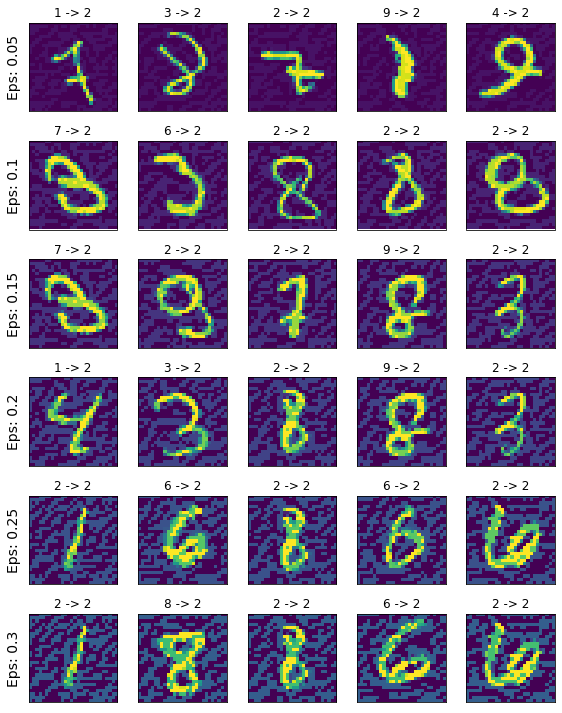

In [183]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(EPSILONS)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(EPSILONS),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(EPSILONS[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
#         normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(ex)
plt.tight_layout()
plt.show()

Hybrid model

Constant beta training

In [66]:
with open('/D/models/pretrained/mnist_model.pkl', 'rb') as f:
    mnist_model = pickle.load(f)

In [185]:
LR = 1e-4
EPOCHS = 210
BETA = 10
NUM_MINIBATCHES = 1

run_name = f"vib_mnist_new_loss_beta_10_time_{int(time.time())}"

new_loss_vib_mnist_classifier = VIB(256, device).to(device)
mnist_vib_hybrid_model = NewHybridModel(mnist_model, new_loss_vib_mnist_classifier, device)
mnist_vib_hybrid_model.freeze_base()

optimizer = optim.Adam(filter(lambda p: p.requires_grad, mnist_vib_hybrid_model.parameters()), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(mnist_vib_hybrid_model, mnist_train_loader, mnist_test_loader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=False, run_name=run_name)

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
100%|█████████████████████████████████████████| 210/210 [17:03<00:00,  4.87s/it]


In [ ]:
# 0.989

In [186]:
test_model(mnist_vib_hybrid_model, mnist_test_loader)

100%|██████████████████████████████████████████| 79/79 [00:00<00:00, 102.62it/s]

tensor(0.9914, device='cuda:0')
acc: None


Constant beta attack - untargeted

In [187]:
mnist_vib_hybrid_model.unfreeze_base()

In [188]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(mnist_vib_hybrid_model, device, mnist_test_loader, eps, is_image=True)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:00<00:03,  1.26it/s]

Epsilon: 0.05	Test Accuracy = 9700 / 9914 = 0.9784143567085266	 %succesful attacks: 0.02158563647367359	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:01<00:03,  1.26it/s]

Epsilon: 0.1	Test Accuracy = 9376 / 9914 = 0.9457333087921143	 %succesful attacks: 0.05426669356465604	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:02<00:02,  1.26it/s]

Epsilon: 0.15	Test Accuracy = 8904 / 9914 = 0.8981238603591919	 %succesful attacks: 0.10187613475892678	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [00:03<00:01,  1.26it/s]

Epsilon: 0.2	Test Accuracy = 8113 / 9914 = 0.8183376789093018	 %succesful attacks: 0.18166229574339318	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [00:03<00:00,  1.27it/s]

Epsilon: 0.25	Test Accuracy = 6575 / 9914 = 0.6632035374641418	 %succesful attacks: 0.33679644946540244	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [00:04<00:00,  1.26it/s]

Epsilon: 0.3	Test Accuracy = 4621 / 9914 = 0.4661085307598114	 %succesful attacks: 0.5338914666128707	 Out of total of 10112 data points


Constant beta attack - targeted

In [189]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(mnist_vib_hybrid_model, device, mnist_test_loader, eps, is_image=True, target_label=2)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:00<00:04,  1.24it/s]

Epsilon: 0.05	Test Accuracy = 8824 / 8956 = 0.9852612614631653	 %succesful attacks: 0.004131308619919607	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:01<00:03,  1.28it/s]

Epsilon: 0.1	Test Accuracy = 8652 / 8956 = 0.9660562872886658	 %succesful attacks: 0.011165698972755694	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:02<00:02,  1.29it/s]

Epsilon: 0.15	Test Accuracy = 8287 / 8956 = 0.9253014922142029	 %succesful attacks: 0.022889682894149173	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [00:03<00:01,  1.27it/s]

Epsilon: 0.2	Test Accuracy = 7571 / 8956 = 0.8453550934791565	 %succesful attacks: 0.047007592675301475	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [00:03<00:00,  1.29it/s]

Epsilon: 0.25	Test Accuracy = 6280 / 8956 = 0.7012059092521667	 %succesful attacks: 0.10328271549799017	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [00:04<00:00,  1.29it/s]

Epsilon: 0.3	Test Accuracy = 4733 / 8956 = 0.5284725427627563	 %succesful attacks: 0.177422956677088	 Out of total of 10112 data points


Dyn beta

In [190]:
LR = 1e-4
EPOCHS = 210
BETA = 1
NUM_MINIBATCHES = 4

run_name = f"vib_mnist_dyn_beta_1_time_{int(time.time())}"

dyn_vib_beta_1_mnist_classifier = VIB(256, device).to(device)
mnist_vib_hybrid_dyn_model = NewHybridModel(mnist_model, dyn_vib_beta_1_mnist_classifier, device)
mnist_vib_hybrid_dyn_model.freeze_base()

optimizer = optim.Adam(filter(lambda p: p.requires_grad, mnist_vib_hybrid_dyn_model.parameters()), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(mnist_vib_hybrid_dyn_model, mnist_train_loader, mnist_test_loader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=True, run_name=run_name)


charts/epoch_classification_loss,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_total_kld,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_train_loss,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_val_loss,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
charts/epoch_classification_loss,0.00169
charts/epoch_total_kld,15.55872
charts/epoch_train_loss,0.01729
charts/epoch_val_loss,162.66594
global_step,196


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
100%|█████████████████████████████████████████| 210/210 [27:43<00:00,  7.92s/it]


In [168]:
# 0.9891

In [191]:
test_model(mnist_vib_hybrid_dyn_model, mnist_test_loader)

100%|███████████████████████████████████████████| 79/79 [00:00<00:00, 97.11it/s]

tensor(0.9911, device='cuda:0')
acc: None


Dyn beta untargeted

In [192]:
mnist_vib_hybrid_dyn_model.unfreeze_base()

In [193]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(mnist_vib_hybrid_dyn_model, device, mnist_test_loader, eps, is_image=True)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:00<00:03,  1.27it/s]

Epsilon: 0.05	Test Accuracy = 9687 / 9911 = 0.9773988723754883	 %succesful attacks: 0.022601150237110283	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:01<00:03,  1.23it/s]

Epsilon: 0.1	Test Accuracy = 9195 / 9911 = 0.9277570247650146	 %succesful attacks: 0.07224296236504893	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:02<00:02,  1.23it/s]

Epsilon: 0.15	Test Accuracy = 8338 / 9911 = 0.8412874341011047	 %succesful attacks: 0.15871254162042175	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [00:03<00:01,  1.22it/s]

Epsilon: 0.2	Test Accuracy = 6952 / 9911 = 0.7014428377151489	 %succesful attacks: 0.2985571587125416	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [00:04<00:00,  1.22it/s]

Epsilon: 0.25	Test Accuracy = 5167 / 9911 = 0.5213399529457092	 %succesful attacks: 0.47866007466451416	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [00:04<00:00,  1.23it/s]

Epsilon: 0.3	Test Accuracy = 3538 / 9911 = 0.35697710514068604	 %succesful attacks: 0.6430229038442135	 Out of total of 10112 data points


Dyn beta targeted

In [194]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(mnist_vib_hybrid_dyn_model, device, mnist_test_loader, eps, is_image=True, target_label=2)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:00<00:04,  1.25it/s]

Epsilon: 0.05	Test Accuracy = 8832 / 8957 = 0.9860444068908691	 %succesful attacks: 0.0043541364296081275	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:01<00:03,  1.19it/s]

Epsilon: 0.1	Test Accuracy = 8662 / 8957 = 0.9670648574829102	 %succesful attacks: 0.0152952997655465	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:02<00:02,  1.18it/s]

Epsilon: 0.15	Test Accuracy = 8331 / 8957 = 0.930110514163971	 %succesful attacks: 0.03427486881768449	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [00:03<00:01,  1.17it/s]

Epsilon: 0.2	Test Accuracy = 7588 / 8957 = 0.847158670425415	 %succesful attacks: 0.0764764988277325	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [00:04<00:00,  1.18it/s]

Epsilon: 0.25	Test Accuracy = 6265 / 8957 = 0.6994529366493225	 %succesful attacks: 0.15395779836998996	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [00:05<00:00,  1.19it/s]

Epsilon: 0.3	Test Accuracy = 4803 / 8957 = 0.5362286567687988	 %succesful attacks: 0.2528748464887797	 Out of total of 10112 data points


#### Rebuilding for CIFAR

In [13]:
from torchvision.datasets import CIFAR100

Data

In [13]:
CIFAR_DATASET_DIR = '/D/datasets/CIFAR'
BATCH_SIZE = 128
NUM_WORKERS = 1

# Data augmentation and normalization for training
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

# Just normalization for testing
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

if os.path.isdir(CIFAR_DATASET_DIR):
    cifar_train_data = CIFAR100(root=CIFAR_DATASET_DIR, train=True, transform=train_transform)
    cifar_test_data = CIFAR100(root=CIFAR_DATASET_DIR, train=False, transform=test_transform)
else:
    os.mkdir(CIFAR_DATASET_DIR)
    cifar_train_data = CIFAR100(root=CIFAR_DATASET_DIR, train=True, download=True, transform=train_transform)
    cifar_test_data = CIFAR100(root=CIFAR_DATASET_DIR, train=False, download=True, transform=test_transform)

cifar_train_loader = DataLoader(cifar_train_data,
                      batch_size=BATCH_SIZE,
                      shuffle=True,
                      num_workers=NUM_WORKERS,
                      drop_last=True)

cifar_test_loader = DataLoader(cifar_test_data,
                         batch_size=BATCH_SIZE,
                         shuffle=False,
                         num_workers=NUM_WORKERS,
                         drop_last=False)

cifar_classes = cifar_train_data.classes

In [15]:
pretrained_cifar_model = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_repvgg_a2", pretrained=True)
pretrained_cifar_model = pretrained_cifar_model.to(device)

Using cache found in /home/nir/.cache/torch/hub/chenyaofo_pytorch-cifar-models_master


In [215]:
test_model(pretrained_cifar_model, cifar_test_loader)

100%|███████████████████████████████████████████| 79/79 [00:03<00:00, 20.10it/s]

tensor(0.7186, device='cuda:0')
acc: None


In [23]:
LR = 1e-4
EPOCHS = 50
BETA = 3e-3
NUM_MINIBATCHES = 1

for beta in [1e-3, 1e-2, 1e-1, 0.5, 1]:
    run_name = f"cifar_new_loss_{beta}_time_{int(time.time())}"

    new_loss_vib_cifar_classifier = VIB(100, device).to(device)
    cifar_vib_hybrid_model = NewHybridModel(pretrained_cifar_model, new_loss_vib_cifar_classifier, device)
    cifar_vib_hybrid_model.freeze_base()

    optimizer = optim.Adam(filter(lambda p: p.requires_grad, cifar_vib_hybrid_model.parameters()), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
    scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

    loop_data(cifar_vib_hybrid_model, cifar_train_loader, cifar_test_loader, beta,
              num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
              optimizer=optimizer, scheduler=scheduler, is_ppo=False, run_name=run_name, is_new_loss=True)

    test_model(cifar_vib_hybrid_model, cifar_test_loader)
    

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: nirzvi89 (reichman_uni). Use `wandb login --relogin` to force relogin


  0%|                                                    | 0/50 [00:00<?, ?it/s]


TypeError: maximum(): argument 'input' (position 1) must be Tensor, not float

Untargeted attack - original model

In [220]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(pretrained_cifar_model, device, cifar_test_loader, eps, is_image=True)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:15<01:17, 15.46s/it]

Epsilon: 0.05	Test Accuracy = 1705 / 7186 = 0.2372669130563736	 %succesful attacks: 0.7627330921235737	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:31<01:02, 15.52s/it]

Epsilon: 0.1	Test Accuracy = 1359 / 7186 = 0.18911772966384888	 %succesful attacks: 0.8108822710826608	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:46<00:46, 15.58s/it]

Epsilon: 0.15	Test Accuracy = 1130 / 7186 = 0.15725021064281464	 %succesful attacks: 0.8427497912607849	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [01:02<00:31, 15.65s/it]

Epsilon: 0.2	Test Accuracy = 961 / 7186 = 0.13373225927352905	 %succesful attacks: 0.866267742833287	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:18<00:15, 15.71s/it]

Epsilon: 0.25	Test Accuracy = 831 / 7186 = 0.1156415268778801	 %succesful attacks: 0.8843584748121347	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:34<00:00, 15.69s/it]

Epsilon: 0.3	Test Accuracy = 737 / 7186 = 0.10256053507328033	 %succesful attacks: 0.8974394656276092	 Out of total of 10112 data points


Targeted attack - Original model

In [221]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(pretrained_cifar_model, device, cifar_test_loader, eps, is_image=True, target_label=15)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:16<01:22, 16.42s/it]

Epsilon: 0.05	Test Accuracy = 2381 / 9871 = 0.24121162295341492	 %succesful attacks: 0.004052274338972748	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:32<01:05, 16.50s/it]

Epsilon: 0.1	Test Accuracy = 2027 / 9871 = 0.20534899830818176	 %succesful attacks: 0.005369263499138892	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:49<00:49, 16.56s/it]

Epsilon: 0.15	Test Accuracy = 1737 / 9871 = 0.17597001791000366	 %succesful attacks: 0.004356194914395705	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [01:06<00:33, 16.61s/it]

Epsilon: 0.2	Test Accuracy = 1535 / 9871 = 0.15550602972507477	 %succesful attacks: 0.00314051261270388	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:23<00:16, 16.65s/it]

Epsilon: 0.25	Test Accuracy = 1352 / 9871 = 0.13696686923503876	 %succesful attacks: 0.002431364603383649	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:39<00:00, 16.63s/it]

Epsilon: 0.3	Test Accuracy = 1212 / 9871 = 0.12278391420841217	 %succesful attacks: 0.0019248303110120555	 Out of total of 10112 data points


Constant beta training

In [228]:
LR = 1e-4
EPOCHS = 100
BETA = 3e-3
NUM_MINIBATCHES = 1

run_name = f"vib_cifar_const_beta_0003_512_time_{int(time.time())}"

constant_vib_cifar_classifier = VIB(100, device).to(device)
cifar_vib_hybrid_model = NewHybridModel(pretrained_cifar_model, constant_vib_cifar_classifier, device)
cifar_vib_hybrid_model.freeze_base()

optimizer = optim.Adam(filter(lambda p: p.requires_grad, cifar_vib_hybrid_model.parameters()), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(cifar_vib_hybrid_model, cifar_train_loader, cifar_test_loader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=False, run_name=run_name)

charts/epoch_classification_loss,█▃▂▁▁▁▁▁▁▁▁▁▁
charts/epoch_total_kld,▆█▇▅▄▄▃▂▂▂▁▁▁
charts/epoch_train_loss,█▃▂▂▂▁▁▁▁▁▁▁▁
charts/epoch_val_loss,██▆▅▄▃▃▂▂▂▁▁
global_step,▁▂▂▃▃▄▅▅▆▆▇▇█
charts/epoch_classification_loss,0.07863
charts/epoch_total_kld,95.67377
charts/epoch_train_loss,0.36659
charts/epoch_val_loss,3170.1084
global_step,12


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
100%|███████████████████████████████████████| 100/100 [1:22:29<00:00, 49.50s/it]


In [229]:
test_model(cifar_vib_hybrid_model, cifar_test_loader)

100%|███████████████████████████████████████████| 79/79 [00:04<00:00, 17.60it/s]

tensor(0.7633, device='cuda:0')
acc: None


In [230]:
cifar_vib_hybrid_model.unfreeze_base()

Untargeted attack - const beta model

In [236]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(cifar_vib_hybrid_model, device, cifar_test_loader, eps, is_image=True)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:19<01:37, 19.54s/it]

Epsilon: 0.05	Test Accuracy = 1682 / 7633 = 0.2203589677810669	 %succesful attacks: 0.7796410323594917	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:39<01:18, 19.66s/it]

Epsilon: 0.1	Test Accuracy = 1334 / 7633 = 0.17476746439933777	 %succesful attacks: 0.8252325429058037	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:59<00:59, 19.78s/it]

Epsilon: 0.15	Test Accuracy = 1117 / 7633 = 0.14633826911449432	 %succesful attacks: 0.8536617319533604	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [01:19<00:39, 19.88s/it]

Epsilon: 0.2	Test Accuracy = 972 / 7633 = 0.12734180688858032	 %succesful attacks: 0.8726581946809905	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:39<00:19, 19.98s/it]

Epsilon: 0.25	Test Accuracy = 837 / 7633 = 0.10965543985366821	 %succesful attacks: 0.8903445565308529	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:59<00:00, 19.94s/it]

Epsilon: 0.3	Test Accuracy = 734 / 7633 = 0.09616140276193619	 %succesful attacks: 0.9038385955718591	 Out of total of 10112 data points


Targeted attack - const beta model

In [237]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(cifar_vib_hybrid_model, device, cifar_test_loader, eps, is_image=True, target_label=15)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:21<01:45, 21.02s/it]

Epsilon: 0.05	Test Accuracy = 2161 / 9866 = 0.2190350741147995	 %succesful attacks: 0.003142104196229475	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:42<01:24, 21.19s/it]

Epsilon: 0.1	Test Accuracy = 1798 / 9866 = 0.18224205076694489	 %succesful attacks: 0.003142104196229475	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [01:04<01:04, 21.43s/it]

Epsilon: 0.15	Test Accuracy = 1574 / 9866 = 0.15953780710697174	 %succesful attacks: 0.002432596797080884	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [01:25<00:43, 21.56s/it]

Epsilon: 0.2	Test Accuracy = 1379 / 9866 = 0.1397729516029358	 %succesful attacks: 0.0018244475978106628	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:47<00:21, 21.70s/it]

Epsilon: 0.25	Test Accuracy = 1215 / 9866 = 0.12315021455287933	 %succesful attacks: 0.0011149401986620718	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [02:09<00:00, 21.63s/it]

Epsilon: 0.3	Test Accuracy = 1069 / 9866 = 0.10835191607475281	 %succesful attacks: 0.0008108655990269613	 Out of total of 10112 data points


Dyn beta hybrid model

In [28]:
LR = 1e-4
EPOCHS = 100
BETA = 1
NUM_MINIBATCHES = 4

run_name = f"vib_cifar_dyn_beta_new_kld_from_base_time_{int(time.time())}"

dyn_vib_cifar_classifier = VIB(100, device).to(device)
dyn_cifar_vib_hybrid_model = NewHybridModel(pretrained_cifar_model, dyn_vib_cifar_classifier, device)
dyn_cifar_vib_hybrid_model.freeze_base()

optimizer = optim.Adam(filter(lambda p: p.requires_grad, dyn_cifar_vib_hybrid_model.parameters()), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(dyn_cifar_vib_hybrid_model, cifar_train_loader, cifar_test_loader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=True, run_name=run_name)

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
100%|██████████████████████████████████████| 100/100 [3:15:23<00:00, 117.23s/it]


In [29]:
# newest kld ratio sum of old and new
test_model(dyn_cifar_vib_hybrid_model, cifar_test_loader)

100%|███████████████████████████████████████████| 79/79 [00:04<00:00, 17.45it/s]

tensor(0.7581, device='cuda:0')
acc: None


In [20]:
# reverse kld in ratio
test_model(dyn_cifar_vib_hybrid_model, cifar_test_loader)

100%|███████████████████████████████████████████| 79/79 [00:03<00:00, 20.01it/s]

tensor(0.7587, device='cuda:0')
acc: None


In [242]:
# old kld in ratio
test_model(dyn_cifar_vib_hybrid_model, cifar_test_loader)

100%|███████████████████████████████████████████| 79/79 [00:03<00:00, 19.93it/s]

tensor(0.7588, device='cuda:0')
acc: None


In [ ]:
dyn_cifar_vib_hybrid_model.unfreeze_base()

Untargeted attack - const beta model

In [243]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(dyn_cifar_vib_hybrid_model, device, cifar_test_loader, eps, is_image=True)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:19<01:36, 19.40s/it]

Epsilon: 0.05	Test Accuracy = 1728 / 7588 = 0.2277279943227768	 %succesful attacks: 0.77227200843437	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:38<01:17, 19.46s/it]

Epsilon: 0.1	Test Accuracy = 1363 / 7588 = 0.1796257197856903	 %succesful attacks: 0.8203742751713231	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:58<00:58, 19.54s/it]

Epsilon: 0.15	Test Accuracy = 1119 / 7588 = 0.1474696844816208	 %succesful attacks: 0.8525303110173958	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [01:18<00:39, 19.63s/it]

Epsilon: 0.2	Test Accuracy = 960 / 7588 = 0.12651555240154266	 %succesful attacks: 0.8734844491302056	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:38<00:19, 19.70s/it]

Epsilon: 0.25	Test Accuracy = 836 / 7588 = 0.11017395555973053	 %succesful attacks: 0.889826041117554	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:58<00:00, 19.68s/it]

Epsilon: 0.3	Test Accuracy = 744 / 7588 = 0.09804955124855042	 %succesful attacks: 0.9019504480759093	 Out of total of 10112 data points


Targeted attack - const beta model

In [244]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(dyn_cifar_vib_hybrid_model, device, cifar_test_loader, eps, is_image=True, target_label=15)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:20<01:42, 20.50s/it]

Epsilon: 0.05	Test Accuracy = 2099 / 9872 = 0.2126215547323227	 %succesful attacks: 0.0023298217179902755	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:41<01:22, 20.54s/it]

Epsilon: 0.1	Test Accuracy = 1689 / 9872 = 0.17108994722366333	 %succesful attacks: 0.0019246353322528362	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [01:01<01:01, 20.58s/it]

Epsilon: 0.15	Test Accuracy = 1452 / 9872 = 0.14708265662193298	 %succesful attacks: 0.0014181523500810373	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [01:22<00:41, 20.62s/it]

Epsilon: 0.2	Test Accuracy = 1258 / 9872 = 0.12743112444877625	 %succesful attacks: 0.0007090761750405186	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:43<00:20, 20.67s/it]

Epsilon: 0.25	Test Accuracy = 1115 / 9872 = 0.11294570565223694	 %succesful attacks: 0.0002025931928687196	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [02:03<00:00, 20.65s/it]

Epsilon: 0.3	Test Accuracy = 998 / 9872 = 0.10109400004148483	 %succesful attacks: 0.00030388978930307944	 Out of total of 10112 data points


In [32]:
EPSILONS = [.05, .1, .15, .2, .25, .3]

In [36]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(dyn_cifar_vib_hybrid_model, device, cifar_test_loader, eps, is_image=True)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:14<01:14, 14.86s/it]

Epsilon: 0.05	Test Accuracy = 1655 / 7581 = 0.2183089256286621	 %succesful attacks: 0.7816910697797125	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:29<00:59, 14.89s/it]

Epsilon: 0.1	Test Accuracy = 1315 / 7581 = 0.1734599620103836	 %succesful attacks: 0.826540034296267	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:44<00:44, 14.94s/it]

Epsilon: 0.15	Test Accuracy = 1097 / 7581 = 0.14470386505126953	 %succesful attacks: 0.8552961350745284	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [00:59<00:29, 14.98s/it]

Epsilon: 0.2	Test Accuracy = 932 / 7581 = 0.12293892353773117	 %succesful attacks: 0.8770610737369741	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:14<00:15, 15.04s/it]

Epsilon: 0.25	Test Accuracy = 820 / 7581 = 0.10816515237092972	 %succesful attacks: 0.8918348502836038	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:30<00:00, 15.02s/it]

Epsilon: 0.3	Test Accuracy = 727 / 7581 = 0.09589763730764389	 %succesful attacks: 0.9041023611660731	 Out of total of 10112 data points


In [37]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(dyn_cifar_vib_hybrid_model, device, cifar_test_loader, eps, is_image=True, target_label=15)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:15<01:18, 15.73s/it]

Epsilon: 0.05	Test Accuracy = 1935 / 9875 = 0.19594936072826385	 %succesful attacks: 0.0014177215189873419	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:31<01:03, 15.75s/it]

Epsilon: 0.1	Test Accuracy = 1602 / 9875 = 0.16222785413265228	 %succesful attacks: 0.0014177215189873419	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:47<00:47, 15.77s/it]

Epsilon: 0.15	Test Accuracy = 1364 / 9875 = 0.13812658190727234	 %succesful attacks: 0.0007088607594936709	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [01:03<00:31, 15.80s/it]

Epsilon: 0.2	Test Accuracy = 1190 / 9875 = 0.12050633132457733	 %succesful attacks: 0.00020253164556962027	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:19<00:15, 15.83s/it]

Epsilon: 0.25	Test Accuracy = 1026 / 9875 = 0.10389873385429382	 %succesful attacks: 0.00040506329113924053	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:34<00:00, 15.82s/it]

Epsilon: 0.3	Test Accuracy = 903 / 9875 = 0.09144303947687149	 %succesful attacks: 0.00020253164556962027	 Out of total of 10112 data points


Beta is 0

In [38]:
LR = 1e-4
EPOCHS = 100
BETA = 0
NUM_MINIBATCHES = 4

run_name = f"zero_beta_{int(time.time())}"

zero_beta_cifar_classifier = VIB(100, device).to(device)
zero_beta_hybrid_model = NewHybridModel(pretrained_cifar_model, zero_beta_cifar_classifier, device)
zero_beta_hybrid_model.freeze_base()

optimizer = optim.Adam(filter(lambda p: p.requires_grad, zero_beta_hybrid_model.parameters()), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(zero_beta_hybrid_model, cifar_train_loader, cifar_test_loader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=True, run_name=run_name)

charts/avg_epoch_ratio,█▂▁▁▁▁▁▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁
charts/epoch_classification_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_kld_from_base_new,█▃▁▁▃▁▁█▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁
charts/epoch_kld_from_base_old,█▃▁▁▃▁▁█▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁
charts/epoch_ratio1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_ratio2,█▂▁▁▂▁▁▃▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▂▁▁▁▁▁▁▁
charts/epoch_ratio3,█▂▁▁▁▁▁▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁
charts/epoch_ratio4,█▂▁▁▁▁▁▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_total_kld,▂▆▇██▆▇▆▆▆▅▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁
charts/epoch_train_loss,█▃▁▁▂▁▁▃▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_val_loss,▃▇▇██▆▇▅▅▆▄▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
100%|██████████████████████████████████████| 100/100 [3:15:06<00:00, 117.07s/it]


In [39]:
test_model(zero_beta_hybrid_model, cifar_test_loader)

100%|███████████████████████████████████████████| 79/79 [00:04<00:00, 16.88it/s]

tensor(0.7643, device='cuda:0')
acc: None


In [41]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(zero_beta_hybrid_model, device, cifar_test_loader, eps, is_image=True)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:14<01:14, 14.86s/it]

Epsilon: 0.05	Test Accuracy = 1573 / 7643 = 0.20580923557281494	 %succesful attacks: 0.7941907627894805	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:29<00:59, 14.92s/it]

Epsilon: 0.1	Test Accuracy = 1240 / 7643 = 0.1622399538755417	 %succesful attacks: 0.8377600418683763	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:44<00:44, 14.96s/it]

Epsilon: 0.15	Test Accuracy = 1034 / 7643 = 0.13528719544410706	 %succesful attacks: 0.8647128091063718	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [00:59<00:30, 15.01s/it]

Epsilon: 0.2	Test Accuracy = 878 / 7643 = 0.11487635970115662	 %succesful attacks: 0.8851236425487374	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:15<00:15, 15.06s/it]

Epsilon: 0.25	Test Accuracy = 760 / 7643 = 0.09943739324808121	 %succesful attacks: 0.9005626063064242	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:30<00:00, 15.05s/it]

Epsilon: 0.3	Test Accuracy = 674 / 7643 = 0.08818526566028595	 %succesful attacks: 0.9118147324349077	 Out of total of 10112 data points


In [42]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(zero_beta_hybrid_model, device, cifar_test_loader, eps, is_image=True, target_label=15)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:15<01:18, 15.74s/it]

Epsilon: 0.05	Test Accuracy = 1913 / 9880 = 0.19362348318099976	 %succesful attacks: 0.0018218623481781376	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:31<01:03, 15.76s/it]

Epsilon: 0.1	Test Accuracy = 1615 / 9880 = 0.16346153616905212	 %succesful attacks: 0.0016194331983805667	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:47<00:47, 15.78s/it]

Epsilon: 0.15	Test Accuracy = 1348 / 9880 = 0.13643725216388702	 %succesful attacks: 0.0013157894736842105	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [01:03<00:31, 15.81s/it]

Epsilon: 0.2	Test Accuracy = 1150 / 9880 = 0.11639676243066788	 %succesful attacks: 0.0005060728744939271	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:19<00:15, 15.84s/it]

Epsilon: 0.25	Test Accuracy = 1008 / 9880 = 0.10202429443597794	 %succesful attacks: 0.0006072874493927126	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:35<00:00, 15.84s/it]

Epsilon: 0.3	Test Accuracy = 885 / 9880 = 0.08957489579916	 %succesful attacks: 0.0004048582995951417	 Out of total of 10112 data points


In [538]:
LR = 1e-4
EPOCHS = 100
BETA = 1
NUM_MINIBATCHES = 1

run_name = f"test_new_entropy_{int(time.time())}"

test_cifar_classifier = VIB(100, device).to(device)
test_hybrid_model = NewHybridModel(pretrained_cifar_model, test_cifar_classifier, device)
test_hybrid_model.freeze_base()

optimizer = optim.Adam(filter(lambda p: p.requires_grad, test_hybrid_model.parameters()), LR / NUM_MINIBATCHES, betas=(0.5,0.999))
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.97)

loop_data(test_hybrid_model, cifar_train_loader, cifar_test_loader, BETA,
          num_minibatches=NUM_MINIBATCHES, model_save_path='/tmp', epochs=EPOCHS, device=device,
          optimizer=optimizer, scheduler=scheduler, is_ppo=False, run_name=run_name, is_dyn_beta=True)


charts/epoch_classification_loss,▇▁▅█▇▇▆▅▄▃▂▂▂▁▁
charts/epoch_dyn_beta,▁▁█▂▂▂▂▂▂▂▁▁▁▁▁▁
charts/epoch_i_z_x,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_i_z_y,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_total_kld,▄█▂▁▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_train_loss,▁▁█▂▁▁▁▁▁▁▁▁▁▁▁
charts/epoch_val_loss,▁▁█▂▂▂▂▂▂▂▁▁▁▁▁
global_step,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
charts/epoch_classification_loss,0.74194
charts/epoch_dyn_beta,0.03847
charts/epoch_i_z_x,0.0


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
100%|███████████████████████████████████████| 100/100 [1:22:07<00:00, 49.28s/it]


In [539]:
test_model(test_hybrid_model, cifar_test_loader)

100%|███████████████████████████████████████████| 79/79 [00:03<00:00, 20.02it/s]

tensor(0.7627, device='cuda:0')
acc: None


In [540]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(test_hybrid_model, device, cifar_test_loader, eps, is_image=True)#, target_label=805)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:14<01:14, 14.84s/it]

Epsilon: 0.05	Test Accuracy = 1678 / 7627 = 0.22000786662101746	 %succesful attacks: 0.7799921332109611	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:29<00:59, 14.87s/it]

Epsilon: 0.1	Test Accuracy = 1339 / 7627 = 0.17556050419807434	 %succesful attacks: 0.8244394912809755	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:44<00:44, 14.92s/it]

Epsilon: 0.15	Test Accuracy = 1094 / 7627 = 0.14343778789043427	 %succesful attacks: 0.8565622131899829	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [00:59<00:29, 14.97s/it]

Epsilon: 0.2	Test Accuracy = 943 / 7627 = 0.12363970279693604	 %succesful attacks: 0.8763602989379835	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:14<00:15, 15.02s/it]

Epsilon: 0.25	Test Accuracy = 804 / 7627 = 0.1054149717092514	 %succesful attacks: 0.8945850268781959	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:30<00:00, 15.00s/it]

Epsilon: 0.3	Test Accuracy = 710 / 7627 = 0.09309034049510956	 %succesful attacks: 0.9069096630392028	 Out of total of 10112 data points


In [541]:
accuracies = []
examples = []
total_succesful_attacks_list = []

# Run test for each epsilon
for eps in tqdm(EPSILONS):
    acc, total_succesful_attacks, ex = run_adverserial_attacks(test_hybrid_model, device, cifar_test_loader, eps, is_image=True, target_label=15)
    accuracies.append(acc)
    total_succesful_attacks_list.append(total_succesful_attacks)    
    examples.append(ex)

 17%|███████▌                                     | 1/6 [00:15<01:18, 15.72s/it]

Epsilon: 0.05	Test Accuracy = 2159 / 9878 = 0.21856650710105896	 %succesful attacks: 0.0024296416278598906	 Out of total of 10112 data points


 33%|███████████████                              | 2/6 [00:31<01:02, 15.75s/it]

Epsilon: 0.1	Test Accuracy = 1852 / 9878 = 0.18748734891414642	 %succesful attacks: 0.0024296416278598906	 Out of total of 10112 data points


 50%|██████████████████████▌                      | 3/6 [00:47<00:47, 15.77s/it]

Epsilon: 0.15	Test Accuracy = 1530 / 9878 = 0.15488965809345245	 %succesful attacks: 0.0021259364243774045	 Out of total of 10112 data points


 67%|██████████████████████████████               | 4/6 [01:03<00:31, 15.80s/it]

Epsilon: 0.2	Test Accuracy = 1311 / 9878 = 0.13271917402744293	 %succesful attacks: 0.0014172909495849362	 Out of total of 10112 data points


 83%|█████████████████████████████████████▌       | 5/6 [01:19<00:15, 15.83s/it]

Epsilon: 0.25	Test Accuracy = 1125 / 9878 = 0.11388944834470749	 %succesful attacks: 0.000911115610447459	 Out of total of 10112 data points


100%|█████████████████████████████████████████████| 6/6 [01:34<00:00, 15.82s/it]

Epsilon: 0.3	Test Accuracy = 998 / 9878 = 0.10103259980678558	 %succesful attacks: 0.00020247013565499088	 Out of total of 10112 data points


### Inspect results

In [13]:
!ls /D/models/dicts

cifar_vub_24.05_13:55.pkl	     cifar_vub_clip_loss_24.05_13:51.pkl
cifar_vub_clip_grad_22.05_23:59.pkl  mnist_clip_loss_kl_ts_1684753371.pkl
cifar_vub_clip_loss_22.05_23:59.pkl  mnist_clip_loss_ts_1684753322.pkl


In [12]:
!ls /D/models/dicts

cifar_ppo_29.05_20:05.pkl  cifar_vub_clip_loss_29.05_22:56.pkl
cifar_vib_29.05_13:19.pkl  cifar_vub_kl_rate_clip_loss_30.05_00:41.pkl
cifar_vib_29.05_18:03.pkl  imagenet_ppo_30.05_21:23.pkl


In [36]:
with open('/D/models/dicts/cifar_vub_clip_loss_24.05_13:51.pkl', 'rb') as f:
    clip_loss_dict = pickle.load(f)
    
with open('/D/models/dicts/cifar_vub_24.05_13:55.pkl', 'rb') as f:
    no_loss_dict = pickle.load(f)

### TODO
Add a plot option that reads all the dicts and either averages each dict per beta value or takes from each dict the run with the best test accuracy (from all betas) and plots them together in one plot. Also remove outliers with very small accuracies first such that the plot will be readable.

In [175]:
dicts[0]['imagenet_vub_clip_loss_beta_0.01_run_0_08.06_13:38']['fgs_epsilons']

[0.1, 0.35, 0.4, 0.45, 0.5]

In [172]:
dicts[0]['imagenet_vub_clip_loss_beta_0.01_run_0_08.06_13:38']['untargeted_total_succesful_attacks_list']

[0.44194614509400226,
 0.5431814487728234,
 0.564772173159235,
 0.5873110472991278,
 0.6117733109389392]

In [24]:
def plot_casted_embeddings(model, train_loader, device,
                          fmnist_classes, title, method,
                          take_stochastic=1, model_type='stochastic'):
    latent_list = []
    label_list = []
    label_text_list = []
    model.eval()
    for idx, (image_batch, label_batch) in enumerate(train_loader):
        with torch.no_grad():
#             if model.num_weights > 1:
#                 (mu, _), _, _ = model(image_batch.to(device))
#                 mu = mu.view(train_loader.batch_size * model.num_weights, model.k)
#                 for label in label_batch:
#                     for w in range(model.num_weights):
#                         label_list.append(int(label))
#                         label_text_list.append(fmnist_classes[int(label)])
#             elif model.num_stochastic > 1:
#                 if take_stochastic == 1:
#                     (mu, _), (_, _), _ = model(image_batch.to(device))
#                 elif take_stochastic == 2:
#                     (_, _), (mu, _), _ = model(image_batch.to(device))
#                 label_list += [int(label) for label in label_batch]
#                 label_text_list += [fmnist_classes[int(label)] for label in label_batch]
#             else:
            if model_type == 'stochastic':
                (mu, _), _, _ = model(image_batch.to(device))
                label_list += [int(label) for label in label_batch]
                label_text_list += [fmnist_classes[int(label)] for label in label_batch]
                latent_list += [mu1.unsqueeze(0).cpu() for mu1 in mu]
            if model_type == 'deterministic':
                mu = model(image_batch.to(device))
                label_list += [int(label) for label in label_batch]
                label_text_list += [fmnist_classes[int(label)] for label in label_batch]
                latent_list += [mu1.unsqueeze(0).cpu() for mu1 in mu]                
        if idx > 5000:
            break
    latent_array = np.array([tensor.cpu().numpy()[0] for tensor in latent_list])
    
    if method.lower() == 'tsne':
        E = TSNE(n_components=2).fit_transform(latent_array)
        f, a = plt.subplots(figsize=(15, 4))
        s = a.scatter(E[:,0], E[:,1], c=label_list, cmap='tab10')
        a.grid(False)
        a.axis('equal')
        a.set_title(title, fontsize=16)
        f.colorbar(s, ax=a, ticks=np.arange(10), boundaries=np.arange(11) - .5)
        return E

    elif method.lower() == 'umap':
        reducer = umap.UMAP()
        scaler = StandardScaler().partial_fit(latent_array)
        scaled_data = scaler.transform(latent_array)
        embedding = reducer.fit_transform(scaled_data)

        labels = pd.Series(label_text_list)
        fig, axes = plt.subplots(1, 1, figsize=(7, 7))
        c = [[c for c in range(1,11)][x] for x in labels\
               .map({label: i for i, label in enumerate(labels.unique())})]

        scatter = axes.scatter(
                            embedding[:, 0],
                            embedding[:, 1],
                            c=c,
                            cmap='tab20c')

        # TODO: fix legend real class correlation
        legend1 = axes.legend(scatter.legend_elements()[0],\
                            [text for text in fmnist_classes],\
                            fontsize=16, prop={'size': 12})

        axes.add_artist(legend1)
        fig.canvas.draw()
        axes.set_title(title, fontsize=16)
        return reducer
    else:
        raise


In [25]:
def get_avg_list(betas, sx):
    d = {}
    for beta, value in zip(betas, sx):
        if beta in d.keys():
            d[beta].append(value)
        else:
            d[beta] = [value]
    avg_accs = [(beta, np.mean(values)) for beta, values in d.items()]
    sorted_avg_accs = sorted(avg_accs, key=lambda x: x[1])
    return sorted_avg_accs

def plot_dict(result_dict, plot=False, fgs_epsilon=-1):
    dict_name = [k for k in result_dict.keys()][0].split('_beta')[0]
    betas = []
    test_accs = []

    for _, model_data in result_dict.items():
        if not 'beta' in model_data.keys():
            model_data['beta'] = 0
        betas.append(model_data['beta'])
        test_accs.append(model_data['test_accuracy'])


    if plot:
        fig, ax = plt.subplots(3, 1, figsize=(10,15))
        fig.suptitle(dict_name, fontsize=18, y=0.93)
        fig.subplots_adjust(hspace=0.3)
        # plt.show()
        ax[0].set_title('Test accuracy', fontsize=14)
        ax[1].set_title('Untargeted success %', fontsize=14)
        ax[2].set_title('Targeted success %', fontsize=14)

        colors = plt.cm.viridis(np.linspace(0, 1, len(betas)))
        for beta, accuracy, color in zip(betas, test_accs, colors):
            ax[0].scatter(beta, accuracy, c=color.reshape(1, -1), label=f'Beta: {beta}')

        ax[0].set_xlabel('Beta')
        ax[0].set_ylabel('Test Accuracies')
        _ = ax[0].set_xticks(betas)
        ax[0].legend()

        for _, model_data in result_dict.items():
            ax[1].plot(model_data['fgs_epsilons'][1:], model_data['untargeted_total_succesful_attacks_list'][1:])
            ax[2].plot(model_data['fgs_epsilons'][1:], model_data['targeted_total_succesful_attacks_list'][1:])
        #     ax[1].scatter(model_data['fgs_epsilons'][1:], model_data['untargeted_total_succesful_attacks_list'][1:])

        ax[1].legend(betas)
        ax[2].legend(betas)
        ax[1].set_xlabel('Epsilon')
        ax[1].set_ylabel('Beta')
        ax[2].set_xlabel('Epsilon')
        ax[2].set_ylabel('Beta')
        _ = ax[1].set_xticks(model_data['fgs_epsilons'][1:])
        _ = ax[2].set_xticks(model_data['fgs_epsilons'][1:])

    betas = []
    untargeted_sx = []
    targeted_sx = []
    for _, model in result_dict.items():
        betas.append(model['beta'])
        untargeted_sx.append(model['untargeted_total_succesful_attacks_list'][fgs_epsilon])
        targeted_sx.append(model['targeted_total_succesful_attacks_list'][fgs_epsilon])

    sorted_untargeted = sorted(zip(betas, untargeted_sx), key=lambda x: x[1])
    sorted_targeted = sorted(zip(betas, targeted_sx), key=lambda x: x[1])
    sorted_accuracies = sorted(zip(betas, test_accs), key=lambda x: x[1])
    
    avg_accuracies = get_avg_list(betas, test_accs)
    avg_untargeted = get_avg_list(betas, untargeted_sx)
    avg_targeted = get_avg_list(betas, targeted_sx)
                               
    print(f'\n\t\t### {dict_name} ###\n')
    
    print('## Sorted test accuracies')
    for beta, acc in sorted_accuracies:
        print(f'Beta: {beta}\t Acc: {acc}')

    print('\n# Sorted avg accuracies')
    for beta, acc in avg_accuracies:
        print(f'Beta: {beta}\t Acc: {acc}')
        
    print(f'\n## Sorted attack success rate for eps={model["fgs_epsilons"][fgs_epsilon]}')
    print(f'\n#Untargeted:')
    for beta, rate in sorted_untargeted:
        print(f'Beta: {beta}\t rate: {rate}')
        
    print('\n# Avg untargeted')
    for beta, acc in avg_untargeted:
        print(f'Beta: {beta}\t Acc: {acc}')
        
    print(f'\n#Targeted:')
    for beta, rate in sorted_targeted:
        print(f'Beta: {beta}\t rate: {rate}')
        
    print('\n# Avg targeted')
    for beta, acc in avg_targeted:
        print(f'Beta: {beta}\t Acc: {acc}')

## TNSE
Try with:
* 10 labels
* Many samples
* umap and tsne
* vib and vub

/home/nir/.pyenv/versions/3.7.9/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/nir/.pyenv/versions/3.7.9/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


array([[-16.279497 , -12.143509 ],
       [ 18.16212  , -33.11612  ],
       [ -2.451586 ,   1.1420621],
       ...,
       [ 28.940176 ,  29.95653  ],
       [ 36.867073 ,  10.585795 ],
       [-20.246586 ,  40.240295 ]], dtype=float32)

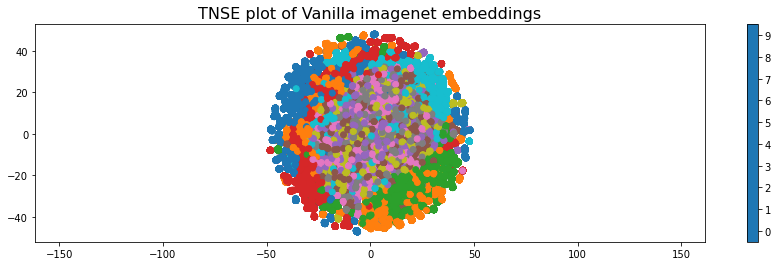

In [83]:
pretrained_model = torch.load('/D/models/pretrained/inceptionv3.pkl')
pretrained_model.to(device)
pretrained_model.eval()
train_loader, test_loader = get_dataloaders('imagenet', logits=False)
labels = [label[0] for label in train_loader.dataset.classes]
plot_casted_embeddings(pretrained_model, train_loader, device, labels, 'TNSE plot of Vanilla imagenet embeddings', 'tsne', model_type='deterministic')


/home/nir/.pyenv/versions/3.7.9/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/nir/.pyenv/versions/3.7.9/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


array([[ 16.556812 ,  -5.074881 ],
       [ 27.37883  , -29.022713 ],
       [ 24.576048 , -11.265363 ],
       ...,
       [  6.1283245, -33.283676 ],
       [-13.802894 ,  -1.7024853],
       [ 28.944746 ,   6.2174544]], dtype=float32)

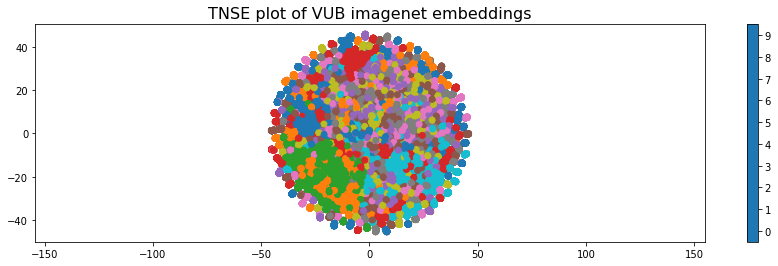

In [84]:
model = dicts[0]['imagenet_vub_clip_loss_beta_0.01_run_0_08.06_13:38']['vib_classifier']
model.to(device)
train_loader, test_loader = get_dataloaders('imagenet', logits=True)
plot_casted_embeddings(model, train_loader, device, labels, 'TNSE plot of VUB imagenet embeddings', 'tsne')


In [26]:
class HybridModel(nn.Module):
    """
    Head is a pretrained model, classifier is VIB
    fc_name should be 'fc2' for inception-v3 (imagenet) and mnist-cnn, '_fc' for efficient-net (CIFAR)
    """
    def __init__(self, base_model, vib_model, device, fc_name, return_only_logits=False):
        super(HybridModel, self).__init__()
        self.device = device
        self.base_model = base_model
        setattr(self.base_model, fc_name, torch.nn.Identity())
        self.vib_model = vib_model
        self.train_loss = []
        self.test_loss = []
        self.freeze_base()
        self.return_only_logits = return_only_logits

    def set_return_only_logits(self, bool_value):
        self.return_only_logits = bool_value
    
    def freeze_base(self):
        # Freeze the weights of the inception_model
        for param in self.base_model.parameters():
            param.requires_grad = False

    def unfreeze_base(self):
        # Freeze the weights of the inception_model
        for param in self.base_model.parameters():
            param.requires_grad = True

    def forward(self, x):
        encoded = self.base_model(x)
        (mu, std), log_probs, logits = self.vib_model(encoded)
        if self.return_only_logits:
            return logits.squeeze(0)
        else:
            return ((mu, std), log_probs, logits)

In [15]:
with open('/D/models/dicts/imagenet_vub_clip_loss_08.06_13:38.pkl', 'rb') as f:
    dict_ = pickle.load(f)

In [112]:
train_loader, test_loader = get_dataloaders('cifar', logits=False)

In [115]:
len(test_loader.dataset) // 100

100

In [16]:
from new_loss_func import get_dataloaders

fc_name = 'fc'
pretrained_model = torch.load('/D/models/pretrained/inceptionv3.pkl')
pretrained_model.to(device)
pretrained_model.eval()
# vib_classifier = dicts[0]['cifar_vib_beta_0.001_run_0_16.06_10:04']['vib_classifier']
vib_classifier = dict_['imagenet_vub_clip_loss_beta_0.1_run_0_08.06_13:38']['vib_classifier']
vib_classifier.eval()
hybrid_model = HybridModel(pretrained_model, vib_classifier, device, fc_name=fc_name)
hybrid_model = hybrid_model.to(device)
hybrid_model.set_return_only_logits(True)
hybrid_model.eval()
train_loader, test_loader = get_dataloaders('imagenet', logits=False)
classes = train_loader.dataset.classes
mean = (0.4914, 0.4822, 0.4465)
std = (0.2023, 0.1994, 0.2010)

test_subset_dataset = torch.utils.data.Subset(test_loader.dataset, range(1000))
test_subset_dataloader = DataLoader(test_subset_dataset, batch_size=32, shuffle=True)


In [53]:
train_loader, test_loader = get_dataloaders('imagenet', logits=False)
test_subset_dataset = torch.utils.data.Subset(test_loader.dataset, range(320))
test_subset_dataloader = DataLoader(test_subset_dataset, batch_size=32, shuffle=True)

In [54]:
len(test_subset_dataloader)

10

In [66]:
perturbed_data.shape

torch.Size([32, 3, 299, 299])

In [69]:
num_successful_attacks

tensor(32, device='cuda:0')

In [68]:
torch.dist(perturbed_data, data[relevant_attack_idx], p=2)

tensor(8.2344, device='cuda:0')

In [55]:
## model = hybrid_model
test_loader = test_subset_dataloader
epsilon = 0.01
is_image = False
print_results = False
target_label = 805
attack_type='cw'
mean = (0.4914, 0.4822, 0.4465)
std = (0.2023, 0.1994, 0.2010)

# Accuracy counter
correct = 0
relevant_pertrubations = 0
total_succesful_attacks = 0
adv_examples = []

model.eval()

if isinstance(model, HybridModel):
    model.set_return_only_logits(True)

l2_dist_for_sx_attack_list = []
    
# Loop over all examples in test set
for data, labels in test_loader:
    # Send the data and label to the device
    data, labels = data.to(device), labels.to(device)

    # Set requires_grad attribute of tensor. Important for Attack
    data.requires_grad = True

    # Forward pass the data through the model
    output = model(data)
    if type(output) == tuple:
        _, _, output = model(data)

    # get the index of the max log-probability
    init_pred = output.squeeze(0).max(dim=-1, keepdim=True)[1]

    hit_vector = init_pred.squeeze(1) == labels
#         relevant_targeted_attack_vector = init_pred.squeeze(1) != target_label
    relevant_targeted_attack_vector = labels != target_label
    if target_label:
        relevant_attack_idx = torch.nonzero(relevant_targeted_attack_vector & (
            init_pred.squeeze(1) != target_label)).flatten()
    else:
        relevant_attack_idx = torch.nonzero(hit_vector).flatten()

    # If the initial prediction is wrong, don't bother attacking, just move on
    if len(relevant_attack_idx) == 0:
        correct += hit_vector.sum().to(torch.device('cpu'))
        continue

    relevant_output = output.squeeze(0)[relevant_attack_idx]
    relevant_labels = labels[relevant_attack_idx]

    if attack_type.lower() == 'fgs':
        # Calculate the loss for the gradient
        if target_label:
            # Targeted attack
            #             loss = F.nll_loss(relevant_output, torch.tensor([target_label]).to(device))
            loss = F.nll_loss(relevant_output, torch.tensor(
                target_label).expand(relevant_output.shape[0]).to(device))
        else:
            # Untargeted attack
            loss = F.nll_loss(relevant_output, relevant_labels)
        # Zero all existing gradients
        model.zero_grad()
        # Calculate gradients of model in backward pass
        loss.backward()
        # Collect ``datagrad``
        data_grad = data.grad[relevant_attack_idx].data
        # Call FGSM Attack
        perturbed_data = fgsm_attack(data[relevant_attack_idx], epsilon, data_grad, is_targeted=bool(
            target_label), is_image=is_image)
        
    elif attack_type.lower() == 'cw':  # Carlini Wagner L2 attack
        data = data.detach()
        if isinstance(test_loader.dataset, torch.utils.data.dataset.Subset):
            classes = test_loader.dataset.dataset.classes
        else:
            classes = test_loader.dataset.classes
        inputs_box = (min((0 - m) / s for m, s in zip(mean, std)),
                      max((1 - m) / s for m, s in zip(mean, std)))
        adversary = cw.L2Adversary(targeted=bool(target_label),
                                confidence=0.0,
                                search_steps=10,
                                box=inputs_box,
                                optimizer_lr=5e-4,
                                num_classes=len(classes),
                                device=device)
        # a batch of any attack targets
        if bool(target_label):
            attack_targets = torch.ones(data.size(0)).to(torch.int64) * target_label
            attack_targets = attack_targets.to(device)
        else:
            attack_targets = labels
        perturbed_data = adversary(model, data[relevant_attack_idx], attack_targets, to_numpy=False)
        assert isinstance(perturbed_data, torch.FloatTensor)
        assert perturbed_data.size() == data.size()
        perturbed_data = perturbed_data.to(device)

    # Re-classify the perturbed image
    perturbed_output = model(perturbed_data)
    if type(perturbed_output) == tuple:
        perturbed_output = perturbed_output[-1]

    relevant_pertrubations += perturbed_output.squeeze(0).shape[0]

    # Check for success
    perturbed_pred = perturbed_output.squeeze(0).max(
        dim=-1, keepdim=True)[1]  # get the index of the max log-probability

    correct_perturbed_classifications = perturbed_pred.flatten(
    ) == labels[relevant_attack_idx]


    # Unsuccessful attack
    if target_label:
        unsuccessful_attack_vector = perturbed_pred.flatten() != target_label
    else:
        unsuccessful_attack_vector = correct_perturbed_classifications

    num_unsuccessful_attacks = unsuccessful_attack_vector.sum()
    successful_attack_idx = torch.nonzero(
        ~unsuccessful_attack_vector.flatten())
    num_successful_attacks = (~unsuccessful_attack_vector).sum()
    unsuccessful_attack_idx = torch.nonzero(
        unsuccessful_attack_vector.flatten())

    total_succesful_attacks += num_successful_attacks

    # Diff between unsuccessful attack and correct classification
    # In correct classification we also take into account unrelevant items and those who didn't reach the required target
#         correct_batch_classifications = (~relevant_targeted_attack_vector & hit_vector).sum() + correct_perturbed_classifications.sum()
    correct_batch_classifications = correct_perturbed_classifications.sum()
    l2_dist_for_sx_attack_list.append(torch.dist(perturbed_data, data[successful_attack_idx], p=2) / len(successful_attack_idx))
    
    correct += correct_batch_classifications.to(torch.device('cpu'))
    # Special case for saving 0 epsilon examples
    if (epsilon == 0) and (len(adv_examples) < 5):
        adv_ex = perturbed_data[unsuccessful_attack_idx][0].squeeze(
        ).detach().cpu().numpy()
        adv_examples.append((init_pred[unsuccessful_attack_idx][0].item(
        ), perturbed_pred[unsuccessful_attack_idx][0].item(), adv_ex))

    if num_successful_attacks and (epsilon != 0):
        # Save some adv examples for visualization later
        #             if (len(adv_examples) < 5) and (not bool(target_label) or (target_label != labels.item())):
        if (len(adv_examples) < 5):
            adv_ex = perturbed_data[successful_attack_idx][0].squeeze(
            ).detach().cpu().numpy()
            adv_examples.append((init_pred[successful_attack_idx][0].item(
            ), perturbed_pred[successful_attack_idx][0].item(), adv_ex))

# Calculate final accuracy for this epsilon
# float(len(test_loader) * test_loader.batch_size)
final_acc = correct / relevant_pertrubations
# float(len(test_loader) * test_loader.batch_size)
succesful_attack_rate = total_succesful_attacks.item() / relevant_pertrubations
if print_results:
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}\t %succesful attacks: {}\t Out of total of {} data points".format(epsilon,
        correct, relevant_pertrubations, final_acc, succesful_attack_rate, len(test_loader) * test_loader.batch_size))

if isinstance(model, HybridModel):
    model.set_return_only_logits(False)


Using scale consts: [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001]
batch [0] loss: 4.897564888000488
batch [10] loss: 5.965827941894531
batch [20] loss: 4.668698787689209
batch [30] loss: 4.289731025695801
batch [40] loss: 4.255224704742432
batch [50] loss: 4.227899551391602
batch [60] loss: 4.219402313232422
batch [70] loss: 4.209881782531738
batch [80] loss: 4.217999458312988
batch [90] loss: 4.214741230010986
batch [100] loss: 4.212671756744385
batch [110] loss: 4.212381839752197
batch [120] loss: 4.215577125549316
batch [130] loss: 4.214127540588379
batch [140] loss: 4.214555740356445
batch [150] loss: 4.215871334075928
batch [160] loss: 4.21749210357666
batch [170] loss: 4.217925071716309
batch [180] loss: 4.218894004821777
batch [190] loss: 4.219781875610352
batch [200] loss: 4.217931747436523
Using scale

batch [10] loss: 36.26774597167969
batch [20] loss: 36.081459045410156
batch [30] loss: 36.03824996948242
batch [40] loss: 35.901153564453125
batch [50] loss: 35.93303680419922
batch [60] loss: 35.90205001831055
batch [70] loss: 35.48581314086914
batch [80] loss: 35.73313903808594
batch [90] loss: 35.763343811035156
batch [100] loss: 35.51311492919922
batch [110] loss: 35.32906723022461
batch [120] loss: 35.88728713989258
batch [130] loss: 35.65142822265625
batch [140] loss: 35.35377883911133
batch [150] loss: 35.65876388549805
batch [160] loss: 36.06376647949219
batch [170] loss: 36.25529479980469
batch [180] loss: 36.011940002441406
batch [190] loss: 36.05455780029297
batch [200] loss: 35.74958801269531
Using scale consts: [0.029687500000000002, 0.018437500000000002, 0.0353125, 0.012812500000000001, 0.15625, 0.029687500000000002, 0.0240625, 0.0240625, 0.15625, 0.029687500000000002, 0.018437500000000002, 0.0521875, 0.0521875, 0.0009921875, 0.012812500000000001, 0.018437500000000002, 0

batch [250] loss: 69.83889770507812
batch [260] loss: 72.48418426513672
batch [270] loss: 70.22586059570312
batch [280] loss: 71.265869140625
batch [290] loss: 71.33562469482422
batch [300] loss: 69.73238372802734
batch [310] loss: 69.94992065429688
batch [320] loss: 69.14513397216797
batch [330] loss: 69.54676055908203
batch [340] loss: 68.58112335205078
batch [350] loss: 68.64866638183594
batch [360] loss: 68.90066528320312
batch [370] loss: 68.25887298583984
batch [380] loss: 68.50386047363281
batch [390] loss: 69.11953735351562
batch [400] loss: 68.23651123046875
batch [410] loss: 68.7816162109375
batch [420] loss: 68.5751724243164
batch [430] loss: 68.72610473632812
batch [440] loss: 68.14302825927734
batch [450] loss: 67.95331573486328
batch [460] loss: 69.27742004394531
batch [470] loss: 67.71356201171875
batch [480] loss: 67.8980712890625
batch [490] loss: 68.62081909179688
batch [500] loss: 67.06686401367188
batch [510] loss: 67.57749938964844
batch [520] loss: 67.099769592285

batch [30] loss: 62.87553405761719
batch [40] loss: 62.53172302246094
batch [50] loss: 62.74367141723633
batch [60] loss: 62.665008544921875
batch [70] loss: 62.62167739868164
batch [80] loss: 62.47111511230469
batch [90] loss: 62.34746551513672
batch [100] loss: 62.96300506591797
batch [110] loss: 62.81338882446289
batch [120] loss: 62.69086456298828
batch [130] loss: 62.73976135253906
batch [140] loss: 62.826576232910156
batch [150] loss: 62.72633361816406
batch [160] loss: 62.65812683105469
batch [170] loss: 62.69137191772461
batch [180] loss: 62.52925109863281
batch [190] loss: 62.67778015136719
batch [200] loss: 62.44084167480469
batch [210] loss: 62.45252227783203
batch [220] loss: 62.58832550048828
batch [230] loss: 62.56922912597656
batch [240] loss: 62.440650939941406
batch [250] loss: 62.753875732421875
batch [260] loss: 62.44153594970703
batch [270] loss: 62.56502151489258
batch [280] loss: 62.1248779296875
batch [290] loss: 62.389015197753906
batch [300] loss: 62.6655387878

batch [270] loss: 62.61682891845703
batch [280] loss: 63.60696029663086
batch [290] loss: 63.45175552368164
batch [300] loss: 63.14863586425781
batch [310] loss: 62.90489959716797
batch [320] loss: 61.33509063720703
batch [330] loss: 62.933284759521484
batch [340] loss: 62.99910354614258
batch [350] loss: 63.20337677001953
batch [360] loss: 61.91584777832031
batch [370] loss: 62.30860137939453
batch [380] loss: 62.44817352294922
batch [390] loss: 62.136085510253906
batch [400] loss: 63.391014099121094
Using scale consts: [1.0, 0.055, 0.055, 0.055, 0.055, 1.0, 0.055, 0.055, 0.055, 1.0, 0.055, 1.0, 1.0, 0.055, 0.055, 0.055, 0.055, 1.0, 0.055, 0.055, 1.0, 0.055, 1.0, 0.055, 1.0, 0.055, 1.0, 0.055, 0.055, 0.055, 1.0, 1.0]
batch [0] loss: 146.27572631835938
batch [10] loss: 193.22232055664062
batch [20] loss: 147.96109008789062
batch [30] loss: 129.33580017089844
batch [40] loss: 117.92210388183594
batch [50] loss: 110.48016357421875
batch [60] loss: 107.86767578125
batch [70] loss: 103.442

batch [10] loss: 53.163352966308594
batch [20] loss: 52.97727584838867
batch [30] loss: 52.90361785888672
batch [40] loss: 52.908172607421875
batch [50] loss: 52.73470687866211
batch [60] loss: 53.136390686035156
batch [70] loss: 53.100425720214844
batch [80] loss: 52.80835723876953
batch [90] loss: 52.890716552734375
batch [100] loss: 52.60347366333008
batch [110] loss: 52.76111602783203
batch [120] loss: 52.75138854980469
batch [130] loss: 52.74342346191406
batch [140] loss: 52.571529388427734
batch [150] loss: 52.758270263671875
batch [160] loss: 52.73375701904297
batch [170] loss: 52.80498504638672
batch [180] loss: 52.892234802246094
batch [190] loss: 52.65433120727539
batch [200] loss: 52.58721923828125
batch [210] loss: 52.98824691772461
batch [220] loss: 52.974483489990234
batch [230] loss: 52.84632873535156
batch [240] loss: 52.86534118652344
batch [250] loss: 52.836978912353516
batch [260] loss: 52.790496826171875
batch [270] loss: 53.09244918823242
batch [280] loss: 52.90467

batch [630] loss: 54.09097671508789
batch [640] loss: 53.122650146484375
batch [650] loss: 53.366756439208984
batch [660] loss: 53.053585052490234
batch [670] loss: 53.33708190917969
batch [680] loss: 53.42784881591797
batch [690] loss: 52.836997985839844
batch [700] loss: 53.59038162231445
Using scale consts: [0.055, 1.0, 0.055, 0.055, 0.055, 0.055, 1.0, 1.0, 0.055, 0.055, 1.0, 0.055, 0.055, 1.0, 0.00325, 0.055, 1.0, 1.0, 1.0, 0.055, 0.055, 0.055, 1.0, 0.055, 1.0, 1.0, 0.055, 0.055, 0.055, 1.0, 1.0, 0.055]
batch [0] loss: 103.45744323730469
batch [10] loss: 182.219482421875
batch [20] loss: 156.90985107421875
batch [30] loss: 142.87850952148438
batch [40] loss: 134.58653259277344
batch [50] loss: 130.78656005859375
batch [60] loss: 128.46441650390625
batch [70] loss: 123.09151458740234
batch [80] loss: 110.0650634765625
batch [90] loss: 105.91993713378906
batch [100] loss: 114.62973022460938
Using scale consts: [0.0325, 0.55, 0.0325, 0.0325, 0.0325, 0.0325, 0.55, 0.55, 0.0325, 0.0775,

batch [10] loss: 46.48644256591797
batch [20] loss: 46.418548583984375
batch [30] loss: 46.30733108520508
batch [40] loss: 46.41270065307617
batch [50] loss: 46.27738952636719
batch [60] loss: 46.31995391845703
batch [70] loss: 46.304344177246094
batch [80] loss: 46.52568817138672
batch [90] loss: 46.287147521972656
batch [100] loss: 46.270931243896484
batch [110] loss: 46.099090576171875
batch [120] loss: 46.30422592163086
batch [130] loss: 46.242191314697266
batch [140] loss: 46.130027770996094
batch [150] loss: 46.56858825683594
batch [160] loss: 46.632843017578125
batch [170] loss: 46.372703552246094
batch [180] loss: 46.43668746948242
batch [190] loss: 46.73027038574219
batch [200] loss: 46.419090270996094
Using scale consts: [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001]
batch [0] loss: 4.859949111938477


batch [220] loss: 46.73915100097656
batch [230] loss: 46.32335662841797
batch [240] loss: 47.71563720703125
batch [250] loss: 47.488624572753906
batch [260] loss: 47.0238151550293
batch [270] loss: 47.41157150268555
batch [280] loss: 46.40626525878906
batch [290] loss: 47.40223693847656
batch [300] loss: 46.87227249145508
batch [310] loss: 48.48932647705078
batch [320] loss: 47.22146224975586
batch [330] loss: 47.38054656982422
batch [340] loss: 47.690589904785156
batch [350] loss: 47.17118835449219
batch [360] loss: 46.67090606689453
batch [370] loss: 47.346580505371094
batch [380] loss: 47.30529022216797
batch [390] loss: 47.49707794189453
batch [400] loss: 46.74442672729492
batch [410] loss: 47.630435943603516
batch [420] loss: 47.62145233154297
batch [430] loss: 46.69938659667969
batch [440] loss: 47.44927978515625
batch [450] loss: 47.52842330932617
batch [460] loss: 47.44752883911133
batch [470] loss: 47.399208068847656
batch [480] loss: 48.034751892089844
batch [490] loss: 47.01

batch [10] loss: 31.75603485107422
batch [20] loss: 29.36058807373047
batch [30] loss: 28.596372604370117
batch [40] loss: 27.853450775146484
batch [50] loss: 27.892059326171875
batch [60] loss: 27.773967742919922
batch [70] loss: 27.391395568847656
batch [80] loss: 27.31068229675293
batch [90] loss: 27.25574493408203
batch [100] loss: 27.090904235839844
batch [110] loss: 27.167448043823242
batch [120] loss: 27.145166397094727
batch [130] loss: 27.066686630249023
batch [140] loss: 27.03104019165039
batch [150] loss: 27.1108455657959
batch [160] loss: 27.06245231628418
batch [170] loss: 27.138439178466797
batch [180] loss: 27.012754440307617
batch [190] loss: 26.996688842773438
batch [200] loss: 27.07239532470703
batch [210] loss: 26.936046600341797
batch [220] loss: 26.946950912475586
batch [230] loss: 26.899112701416016
batch [240] loss: 26.853479385375977
batch [250] loss: 26.9771728515625
batch [260] loss: 26.96735382080078
batch [270] loss: 26.979900360107422
batch [280] loss: 27.0

batch [180] loss: 58.91743087768555
batch [190] loss: 58.983055114746094
batch [200] loss: 59.9249267578125
Using scale consts: [0.21250000000000002, 0.015625, 0.049375, 0.21250000000000002, 0.026875000000000003, 0.015625, 0.026875000000000003, 0.21250000000000002, 0.026875000000000003, 0.21250000000000002, 0.21250000000000002, 0.049375, 0.015625, 0.038125, 0.094375, 0.005218749999999999, 0.015625, 0.21250000000000002, 0.21250000000000002, 0.038125, 0.015625, 0.009718750000000002, 0.015625, 0.21250000000000002, 0.015625, 0.026875000000000003, 0.015625, 0.038125, 0.015625, 0.071875, 0.060625, 0.049375]
batch [0] loss: 59.467735290527344
batch [10] loss: 58.124290466308594
batch [20] loss: 57.60710525512695
batch [30] loss: 57.1106071472168
batch [40] loss: 57.58233642578125
batch [50] loss: 56.74258804321289
batch [60] loss: 57.052490234375
batch [70] loss: 56.64690399169922
batch [80] loss: 56.893035888671875
batch [90] loss: 56.506858825683594
batch [100] loss: 56.82138442993164
batch

batch [170] loss: 25.404577255249023
batch [180] loss: 25.358070373535156
batch [190] loss: 25.351688385009766
batch [200] loss: 25.198484420776367
batch [210] loss: 25.276222229003906
batch [220] loss: 25.26995086669922
batch [230] loss: 25.37889862060547
batch [240] loss: 25.250402450561523
batch [250] loss: 25.29974365234375
batch [260] loss: 25.337400436401367
batch [270] loss: 25.162456512451172
batch [280] loss: 25.248485565185547
batch [290] loss: 25.344871520996094
batch [300] loss: 25.407405853271484
Using scale consts: [0.0055, 0.1, 0.1, 0.1, 0.0055, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.0055, 0.1, 0.0055, 0.1]
batch [0] loss: 142.84750366210938
batch [10] loss: 106.41932678222656
batch [20] loss: 96.65801239013672
batch [30] loss: 84.876953125
batch [40] loss: 79.620849609375
batch [50] loss: 76.68193054199219
batch [60] loss: 76.83079528808594
batch [70] loss: 71.25634765625
batch [80] loss: 71.9

batch [10] loss: 50.835201263427734
batch [20] loss: 50.38249588012695
batch [30] loss: 50.05830383300781
batch [40] loss: 50.44364929199219
batch [50] loss: 50.00188446044922
batch [60] loss: 49.83753967285156
batch [70] loss: 49.72999572753906
batch [80] loss: 50.7626838684082
batch [90] loss: 50.23681640625
batch [100] loss: 50.547019958496094
batch [110] loss: 50.183013916015625
batch [120] loss: 50.053375244140625
batch [130] loss: 49.779571533203125
batch [140] loss: 50.011207580566406
batch [150] loss: 50.029258728027344
batch [160] loss: 50.096561431884766
batch [170] loss: 50.10719299316406
batch [180] loss: 50.256317138671875
batch [190] loss: 50.03760528564453
batch [200] loss: 50.007102966308594
batch [210] loss: 49.84941864013672
batch [220] loss: 50.126190185546875
batch [230] loss: 50.327484130859375
batch [240] loss: 49.92591094970703
batch [250] loss: 49.89860153198242
batch [260] loss: 50.192684173583984
batch [270] loss: 50.05938720703125
batch [280] loss: 49.8711509

batch [60] loss: 91.90015411376953
batch [70] loss: 89.59927368164062
batch [80] loss: 87.70619201660156
batch [90] loss: 86.33930969238281
batch [100] loss: 84.6988525390625
batch [110] loss: 83.88555908203125
batch [120] loss: 83.30833435058594
batch [130] loss: 82.30376434326172
batch [140] loss: 82.81716918945312
batch [150] loss: 83.2774658203125
batch [160] loss: 81.06986999511719
batch [170] loss: 81.88572692871094
batch [180] loss: 80.84459686279297
batch [190] loss: 80.6291732788086
batch [200] loss: 80.56192016601562
batch [210] loss: 80.30880737304688
batch [220] loss: 80.23665618896484
batch [230] loss: 79.77639770507812
batch [240] loss: 79.32832336425781
batch [250] loss: 79.00525665283203
batch [260] loss: 79.82893371582031
batch [270] loss: 79.96366882324219
batch [280] loss: 78.95145416259766
batch [290] loss: 79.5517578125
batch [300] loss: 79.213623046875
batch [310] loss: 79.16969299316406
batch [320] loss: 78.90115356445312
batch [330] loss: 78.54655456542969
batch

batch [40] loss: 76.69495391845703
batch [50] loss: 76.90546417236328
batch [60] loss: 76.43949127197266
batch [70] loss: 77.3341064453125
batch [80] loss: 77.26583862304688
batch [90] loss: 77.0643081665039
batch [100] loss: 77.06803894042969
batch [110] loss: 76.8759536743164
batch [120] loss: 77.18968200683594
batch [130] loss: 76.86288452148438
batch [140] loss: 76.51774597167969
batch [150] loss: 76.80288696289062
batch [160] loss: 77.04136657714844
batch [170] loss: 76.31852722167969
batch [180] loss: 76.5938491821289
batch [190] loss: 77.04917907714844
batch [200] loss: 76.31868743896484
batch [210] loss: 77.09117889404297
batch [220] loss: 76.95968627929688
batch [230] loss: 76.98199462890625
batch [240] loss: 76.74797821044922
batch [250] loss: 77.2257080078125
batch [260] loss: 77.00587463378906
batch [270] loss: 76.74203491210938
batch [280] loss: 76.96559143066406
batch [290] loss: 76.63682556152344
batch [300] loss: 77.10824584960938
Using scale consts: [0.15625, 0.0240625

batch [20] loss: 101.78971862792969
batch [30] loss: 90.64204406738281
batch [40] loss: 84.59843444824219
batch [50] loss: 82.30252838134766
batch [60] loss: 78.839599609375
batch [70] loss: 77.26240539550781
batch [80] loss: 74.69449615478516
batch [90] loss: 73.48797607421875
batch [100] loss: 72.57623291015625
batch [110] loss: 71.19869995117188
batch [120] loss: 71.7982177734375
batch [130] loss: 70.44000244140625
batch [140] loss: 71.07395935058594
batch [150] loss: 70.09423065185547
batch [160] loss: 69.1797866821289
batch [170] loss: 67.7004623413086
batch [180] loss: 68.32030487060547
batch [190] loss: 66.34486389160156
batch [200] loss: 67.70613861083984
batch [210] loss: 66.38943481445312
batch [220] loss: 66.09024810791016
batch [230] loss: 66.74580383300781
batch [240] loss: 66.6717758178711
batch [250] loss: 65.4057388305664
batch [260] loss: 65.68971252441406
batch [270] loss: 66.43630981445312
batch [280] loss: 64.83589172363281
batch [290] loss: 64.93724060058594
batch 

batch [140] loss: 53.51704788208008
batch [150] loss: 54.076446533203125
batch [160] loss: 53.7005729675293
batch [170] loss: 53.757720947265625
batch [180] loss: 54.10519790649414
batch [190] loss: 53.836612701416016
batch [200] loss: 54.06718444824219
Using scale consts: [0.047968750000000004, 0.01140625, 0.031093750000000003, 0.01984375, 0.031093750000000003, 0.031093750000000003, 0.128125, 0.184375, 0.08734375, 0.031093750000000003, 0.01984375, 0.128125, 0.045156249999999995, 0.031093750000000003, 0.128125, 0.06484375, 0.045156249999999995, 0.128125, 0.05078125, 0.128125, 0.031093750000000003, 0.128125, 0.031093750000000003, 0.128125, 0.053593749999999996, 0.0099296875, 0.01984375, 0.02828125, 0.07328124999999999, 0.05921875, 0.036718749999999994, 0.01421875]
batch [0] loss: 53.70892333984375
batch [10] loss: 53.77934265136719
batch [20] loss: 53.58926010131836
batch [30] loss: 53.5234260559082
batch [40] loss: 53.68578338623047
batch [50] loss: 53.55144119262695
batch [60] loss: 5

batch [90] loss: 78.33647155761719
batch [100] loss: 79.97703552246094
batch [110] loss: 81.5628890991211
batch [120] loss: 79.8573226928711
batch [130] loss: 82.54627990722656
batch [140] loss: 80.03718566894531
batch [150] loss: 79.47195434570312
batch [160] loss: 78.65962219238281
batch [170] loss: 81.25430297851562
batch [180] loss: 81.7432861328125
batch [190] loss: 79.14360809326172
batch [200] loss: 80.11834716796875
Using scale consts: [0.06625, 0.325, 0.04375, 0.02125, 0.04375, 0.325, 0.325, 0.325, 0.02125, 0.02125, 0.325, 0.08875, 0.02125, 0.325, 0.325, 0.04375, 0.02125, 0.04375, 0.02125, 0.325, 0.325, 0.06625, 0.325, 0.325, 0.02125, 0.04375, 0.02125, 0.02125, 0.02125, 0.08875, 0.08875, 0.325]
batch [0] loss: 80.25016784667969
batch [10] loss: 77.54618835449219
batch [20] loss: 74.78456115722656
batch [30] loss: 74.06657409667969
batch [40] loss: 73.9112548828125
batch [50] loss: 72.61817932128906
batch [60] loss: 73.1353530883789
batch [70] loss: 71.9598388671875
batch [80] 

In [51]:
len(test_loader)

1

In [60]:
# final_acc
# succesful_attack_rate
avg_l2_dist_for_sx_attack
# len(adv_examples)

tensor(0.)

In [25]:
import imp
imp.reload(cw)

<module 'cw' from '/home/nir/multimodal-transformer-rl/src/notebooks/cw.py'>

In [24]:
classes = train_loader.dataset.classes
mean = (0.4914, 0.4822, 0.4465)
std = (0.2023, 0.1994, 0.2010)
inputs_box = (min((0 - m) / s for m, s in zip(mean, std)),
              max((1 - m) / s for m, s in zip(mean, std)))
test_subset_dataset = torch.utils.data.Subset(test_loader.dataset, range(1000))
test_subset_dataloader = DataLoader(test_subset_dataset, batch_size=32, shuffle=True)

In [26]:
inputs_box = (min((0 - m) / s for m, s in zip(mean, std)),
              max((1 - m) / s for m, s in zip(mean, std)))
# an untargeted adversary
adversary = cw.L2Adversary(targeted=False,
                           confidence=0.0,
                           search_steps=10,
                           box=inputs_box,
                           optimizer_lr=5e-4,
                           num_classes=len(classes),
                           device=device)

inputs, targets = next(iter(test_subset_dataloader))
inputs = inputs.to(device)
targets = targets.to(torch.int64).to(device)
adversarial_examples = adversary(hybrid_model, inputs, targets, to_numpy=False)
assert isinstance(adversarial_examples, torch.FloatTensor)
assert adversarial_examples.size() == inputs.size()

Using scale consts: [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001]
batch [0] loss: 2.232055902481079
batch [10] loss: 3.878596782684326
batch [20] loss: 2.519503355026245
batch [30] loss: 2.1172804832458496
batch [40] loss: 2.0963780879974365
batch [50] loss: 2.081134796142578
batch [60] loss: 2.071727991104126
batch [70] loss: 2.06771183013916
batch [80] loss: 2.0660459995269775
batch [90] loss: 2.067357063293457
batch [100] loss: 2.0667080879211426
batch [110] loss: 2.065812110900879
batch [120] loss: 2.067925453186035
batch [130] loss: 2.067960262298584
batch [140] loss: 2.067460298538208
batch [150] loss: 2.0686707496643066
batch [160] loss: 2.0688552856445312
batch [170] loss: 2.0675225257873535
batch [180] loss: 2.0696654319763184
batch [190] loss: 2.0695996284484863
batch [200] loss: 2.0690670013427734
U

batch [180] loss: 31.592605590820312
batch [190] loss: 31.76436424255371
batch [200] loss: 31.782777786254883
batch [210] loss: 31.495718002319336
batch [220] loss: 31.45639991760254
batch [230] loss: 31.555051803588867
batch [240] loss: 31.476551055908203
batch [250] loss: 31.41980743408203
batch [260] loss: 31.50434684753418
batch [270] loss: 31.47547721862793
batch [280] loss: 31.698823928833008
batch [290] loss: 31.88898277282715
batch [300] loss: 31.75579833984375
batch [310] loss: 31.468616485595703
batch [320] loss: 31.6184139251709
batch [330] loss: 31.71033477783203
batch [340] loss: 31.660287857055664
batch [350] loss: 31.71390724182129
batch [360] loss: 31.49835205078125
batch [370] loss: 31.484046936035156
batch [380] loss: 31.72963523864746
batch [390] loss: 31.616153717041016
batch [400] loss: 31.839900970458984
Using scale consts: [0.005218749999999999, 0.026875000000000003, 1.5625e-05, 0.026875000000000003, 0.00803125, 0.000984375, 0.015625, 0.000484375, 0.00128125, 0.0

In [45]:
logits = hybrid_model(adversarial_examples.to(device))
predictions = torch.argmax(torch.softmax(logits, dim=-1), dim=1)
predictions

tensor([  7,  34,   5, 912, 330, 147,  92, 427,  16, 393,   7, 442,  10, 382,
        411,   3,   8, 639, 369,  10, 973, 961, 302, 353, 389,   8, 638, 410,
        772, 231,   8,   2], device='cuda:0')

In [46]:
logits = hybrid_model(inputs.to(device))
predictions = torch.argmax(torch.softmax(logits, dim=-1), dim=1)
predictions

tensor([  8,  14,   5,  15,  13,   5,  11,   8,  19,   0,   8,   9,  12,  18,
         18,   4,   8,   9,   5,  19,  16,  19,  15, 353,   0,   7,   6,   0,
          1,  11,   7,   3], device='cuda:0')

In [47]:
targets

tensor([ 8, 14,  6, 15, 13,  5, 11,  8, 19,  0,  8,  9, 12, 18, 18,  4,  7,  9,
         5, 19, 16, 19, 15, 18,  0,  7,  6,  0,  1, 11,  7,  3],
       device='cuda:0')

In [55]:
torch.dist(adversarial_examples.to(device), inputs, p=2)

tensor(5.6733, device='cuda:0')

In [19]:
train_loader, test_loader = get_dataloaders('imagenet', logits=False)
inputs, targets = next(iter(test_loader))

In [21]:
pretrained_model = torch.load('/D/models/pretrained/inceptionv3.pkl')
pretrained_model.to(device)
pretrained_model.eval()
pretrained_model(inputs.to(device)).shape

torch.Size([32, 1000])

In [25]:
# a targeted adversary
adversary = cw.L2Adversary(targeted=True,
                           confidence=0.0,
                           search_steps=10,
                           box=inputs_box,
                           optimizer_lr=5e-4,
                           num_classes=len(classes),
                           device=device)

inputs, real_targets = next(iter(test_loader))
inputs = inputs.to(device)
# a batch of any attack targets
attack_targets = torch.ones(inputs.size(0)).to(torch.int64) * 805
attack_targets = attack_targets.to(device)
targeted_adversarial_examples = adversary(pretrained_model, inputs.to(device), attack_targets, to_numpy=False)
assert isinstance(targeted_adversarial_examples, torch.FloatTensor)
assert targeted_adversarial_examples.size() == inputs.size()

Using scale consts: [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001]
batch [0] loss: 0.3333878517150879
batch [10] loss: 2.79953670501709
batch [20] loss: 0.8249708414077759
batch [30] loss: 0.33835822343826294
batch [40] loss: 0.37179410457611084
batch [50] loss: 0.3585679829120636
batch [60] loss: 0.34201085567474365
batch [70] loss: 0.3347935974597931
batch [80] loss: 0.3333669602870941
batch [90] loss: 0.3337014317512512
batch [100] loss: 0.3335164785385132
Using scale consts: [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01]
batch [0] loss: 3.3307995796203613
batch [10] loss: 3.322539806365967
batch [20] loss: 3.322671890258789
batch [30] loss: 3.322016477584839
batch

batch [0] loss: 717.3912963867188
batch [10] loss: 616.63232421875
batch [20] loss: 641.8021240234375
batch [30] loss: 569.1680297851562
batch [40] loss: 529.7066650390625
batch [50] loss: 527.0055541992188
batch [60] loss: 514.8982543945312
batch [70] loss: 495.06304931640625
batch [80] loss: 468.1374816894531
batch [90] loss: 470.9827880859375
batch [100] loss: 461.0725402832031
batch [110] loss: 454.9358215332031
batch [120] loss: 446.3510437011719
batch [130] loss: 444.0717468261719
batch [140] loss: 440.50506591796875
batch [150] loss: 431.27593994140625
batch [160] loss: 434.52252197265625
batch [170] loss: 443.851806640625
batch [180] loss: 438.0984191894531
batch [190] loss: 429.95599365234375
batch [200] loss: 437.19561767578125
batch [210] loss: 423.95538330078125
batch [220] loss: 417.28997802734375
batch [230] loss: 415.2322082519531
batch [240] loss: 411.98968505859375
batch [250] loss: 406.12103271484375
batch [260] loss: 408.51690673828125
batch [270] loss: 428.026245117

In [27]:
logits = pretrained_model(inputs.to(device))
predictions = torch.argmax(torch.softmax(logits, dim=-1), dim=1)
predictions

tensor([394,   0, 391,   0,   0,   0,   0,   0,   0,   0, 133,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 389,
          0,   0,   0,   0], device='cuda:0')

In [29]:
real_targets

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])

In [31]:
logits = pretrained_model(targeted_adversarial_examples.to(device))
predictions = torch.argmax(torch.softmax(logits, dim=-1), dim=1)
predictions

tensor([805, 805, 805, 805, 805, 805, 805, 805, 805, 805, 805, 805, 805, 805,
        805, 805, 805, 805, 805, 805, 805, 805, 805, 805, 805, 805, 805, 805,
        805, 805, 805, 805], device='cuda:0')

In [33]:
torch.dist(targeted_adversarial_examples.to(device), inputs, p=2)

tensor(17.1094, device='cuda:0')

In [70]:
torch.dist(adversarial_examples.to(device), inputs, p=2)

tensor(4923.5864, device='cuda:0')

In [24]:
new_paths = ['/D/models/dicts/imagenet_vub_clip_loss_08.06_13:38.pkl',
'/D/models/dicts/imagenet_vanilla_08.06_12:11.pkl',
'/D/models/dicts/imagenet_ppo_06.06_09:20.pkl',
'/D/models/dicts/imagenet_vib_05.06_19:13.pkl']

old_paths = ['/D/models/dicts/imagenet_vub_clip_loss_04.06_00:10.pkl',
'/D/models/dicts/imagenet_vanilla_03.06_22:41.pkl',
'/D/models/dicts/imagenet_ppo_02.06_21:22.pkl',
'/D/models/dicts/imagenet_vib_02.06_14:23.pkl']

new_dicts = []
old_dicts = []

for path in new_paths:
    with open(path, 'rb') as f:
        new_dicts.append(pickle.load(f))

for path in old_paths:
    with open(path, 'rb') as f:
        old_dicts.append(pickle.load(f))
        
dicts = []
for new_dict, old_dict in zip(new_dicts, old_dicts):
    combined_dict = {}
    for dict_ in (new_dict, old_dict):
        for key, value in dict_.items():
            combined_dict[key] = value
    dicts.append(combined_dict)

In [ ]:
import wandb

def get_run_id_from_name(run_name):
    api = wandb.Api()
    runs = api.runs("reichman_uni/dynamic_beta")
    for run in runs:
        if run.name == run_name:
            return run.id

In [85]:
# vib 0.1 0.001 X 3
'/D/models/dicts/imagenet_vib_clip_loss_30.07_00:28.pkl'
# look for 3 vib 0.01 here:
'/D/models/dicts/imagenet_vib_21.06_15:35.pkl'
'/D/models/dicts/imagenet_vib_05.06_19:13.pkl'
'/D/models/dicts/imagenet_vib_02.06_14:23.pkl'

# look for vubs here:
'/D/models/dicts/imagenet_vub_clip_loss_11.07_08:04.pkl'
'/D/models/dicts/imagenet_vub_clip_loss_08.07_00:54.pkl'
dict_path = '/D/models/dicts/imagenet_vub_clip_loss_06.07_20:29.pkl'

with open(dict_path, 'rb') as f:
    d = pickle.load(f)
    
d.keys()

dict_keys(['imagenet_vub_clip_loss_beta_-0.01_run_0_06.07_20:29'])

In [84]:
for key, inner_dict in d.items():
    print(key)
    wandb_run_id = get_run_id_from_name(key)
    try:
        final_rate_term = fetch_scalar_data(wandb_run_id, 'charts/epoch_rate_term')[-1]
        final_distortion_term = fetch_scalar_data(wandb_run_id, 'charts/epoch_distortion_term')[-1]
        avg_l2 = inner_dict['avg_l2_dist_for_sx_targeted_attack']
    except:
        final_rate_term = 0
        final_distortion_term = 0
        avg_l2 = 0
    print(f"\
    test acc: {inner_dict['test_accuracy']:.4f}\n\
    % succesful fgs @ e=0.1 {inner_dict['untargeted_total_succesful_attacks_list'][0]:.4f}\n\
    % succesful fgs @ e=0.5 {inner_dict['untargeted_total_succesful_attacks_list'][-1]:.4f}\n\
    avg l2 distance for CW {avg_l2:.4f}\n\
    final rate term {final_rate_term:.4f}\n\
    final distortion term {final_distortion_term:.4f}\n")

imagenet_vub_clip_loss_beta_0.01_run_0_08.07_00:54
    test acc: 0.7404
    % succesful fgs @ e=0.1 0.4488
    % succesful fgs @ e=0.5 0.6110
    avg l2 distance for CW 788.6816
    final rate term 594.2856
    final distortion term 0.0480

imagenet_vub_clip_loss_beta_0.1_run_0_08.07_00:54
    test acc: 0.7376
    % succesful fgs @ e=0.1 0.4553
    % succesful fgs @ e=0.5 0.6215
    avg l2 distance for CW 789.4454
    final rate term 594.2759
    final distortion term 0.0474

imagenet_vub_clip_loss_beta_1.0_run_0_08.07_00:54
    test acc: 0.7343
    % succesful fgs @ e=0.1 0.7116
    % succesful fgs @ e=0.5 0.7088
    avg l2 distance for CW 788.6816
    final rate term 594.2841
    final distortion term 0.0032



In [25]:
dicts = []
for path in glob.glob('/D/models/dicts/ima*'):
    with open(path, 'rb') as f:
        dicts.append(pickle.load(f))

In [17]:
dict_['imagenet_vub_clip_loss_beta_0.01_run_0_28.06_08:13'].keys()

dict_keys(['dict_name', 'vib_classifier', 'beta', 'test_accuracy', 'fgs_epsilons', 'untargeted_accuracies', 'untargeted_total_succesful_attacks_list', 'untargeted_examples', 'targeted_accuracies', 'targeted_total_succesful_attacks_list', 'targeted_examples', 'avg_l2_dist_for_sx_targeted_attack'])

In [22]:
dict_['imagenet_vub_clip_loss_beta_0.01_run_0_28.06_08:13']['fgs_epsilons']

[0.1, 0.35, 0.4, 0.45, 0.5]

In [31]:
with open('/D/models/dicts/imagenet_vub_clip_loss_11.07_08:04.pkl', 'rb') as f:
    dict_ = pickle.load(f)

In [34]:
print(dict_['imagenet_vub_clip_loss_beta_0.01_run_0_11.07_08:04']['untargeted_accuracies'])
print(dict_['imagenet_vub_clip_loss_beta_0.01_run_0_11.07_08:04']['untargeted_total_succesful_attacks_list'])

[tensor(0.5527), tensor(0.4535), tensor(0.4336), tensor(0.4096), tensor(0.3871)]
[0.4472701693631297, 0.5465072236350846, 0.5664466208538499, 0.5903901304041989, 0.6129267896758833]


In [21]:
with open('/D/models/dicts/imagenet_vub_clip_loss_28.06_08:13.pkl', 'rb') as f:
    dict_ = pickle.load(f)
print(dict_['imagenet_vub_clip_loss_beta_0.01_run_0_28.06_08:13']['untargeted_accuracies'])
print(dict_['imagenet_vub_clip_loss_beta_0.01_run_0_28.06_08:13']['untargeted_total_succesful_attacks_list'])

[0.5401392363755031,
 0.5970575437833134,
 0.6153051234635049,
 0.6322473621233548,
 0.6520178396606113]

In [35]:
for dict_ in dicts:
    plot_dict(dict_, plot=False, fgs_epsilon=0)


		### cifar_vib ###

## Sorted test accuracies
Beta: 0.1	 Acc: 0.7657999992370605
Beta: 0.1	 Acc: 0.7698000073432922
Beta: 0.1	 Acc: 0.7709000110626221
Beta: 0.01	 Acc: 0.781499981880188
Beta: 0.01	 Acc: 0.7821000218391418
Beta: 0.01	 Acc: 0.7828999757766724
Beta: 0.001	 Acc: 0.7850000262260437
Beta: 0.001	 Acc: 0.7864999771118164
Beta: 0.001	 Acc: 0.7868000268936157

# Sorted avg accuracies
Beta: 0.1	 Acc: 0.768833339214325
Beta: 0.01	 Acc: 0.7821666598320007
Beta: 0.001	 Acc: 0.7861000100771586

## Sorted attack success rate for eps=0.005

#Untargeted:
Beta: 0.001	 rate: 0.6110708242687938
Beta: 0.001	 rate: 0.6202439908201474
Beta: 0.001	 rate: 0.6241229131381563
Beta: 0.01	 rate: 0.6300108998425579
Beta: 0.01	 rate: 0.630246020260492
Beta: 0.01	 rate: 0.6324507314714061
Beta: 0.1	 rate: 0.6447560975609756
Beta: 0.1	 rate: 0.645884072089625
Beta: 0.1	 rate: 0.6559100354479892

# Avg untargeted
Beta: 0.001	 Acc: 0.6184792427423658
Beta: 0.01	 Acc: 0.6309025505248186
Beta: 0.1	 Acc: 

In [7]:
import os
import torch
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms
from torchvision.datasets import CIFAR100
from torch.utils.data import DataLoader
from efficientnet_pytorch import EfficientNet

dataset_dir = '/D/datasets/CIFAR'
batch_size = 32
NUM_WORKERS = 4
num_epochs = 25

train_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(224, padding=4),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])
test_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

if os.path.isdir(dataset_dir):
    train_data = CIFAR100(root=dataset_dir, train=True, transform=train_transform)
    test_data = CIFAR100(root=dataset_dir, train=False, transform=test_transform)
else:
    os.mkdir(dataset_dir)
    train_data = CIFAR100(root=dataset_dir, train=True, download=True, transform=train_transform)
    test_data = CIFAR100(root=dataset_dir, train=False, download=True, transform=test_transform)

train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=NUM_WORKERS, drop_last=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, num_workers=NUM_WORKERS, drop_last=False)

efficientnet = EfficientNet.from_pretrained('efficientnet-b0')
efficientnet._fc = torch.nn.Linear(efficientnet._fc.in_features, 100)  # Adjust the number of output classes to 100 for CIFAR100

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
_ = efficientnet.to(device)


Loaded pretrained weights for efficientnet-b0


In [3]:
optimizer = optim.Adam(efficientnet.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

def train(epoch):
    efficientnet.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = efficientnet(data)
        loss = F.cross_entropy(output, target)
        loss.backward()
        optimizer.step()

        if batch_idx % 100 == 0:
            print(f'Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)} ({100. * batch_idx / len(train_loader):.0f}%)]\tLoss: {loss.item():.6f}')

def test():
    efficientnet.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = efficientnet(data)
            test_loss += F.cross_entropy(output, target, reduction='sum').item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    print(f'\nTest set: Average loss: {test_loss:.4f}, Accuracy: {correct}/{len(test_loader.dataset)} ({100. * correct / len(test_loader.dataset):.0f}%)\n')

for epoch in range(1, num_epochs + 1):
    train(epoch)
    test()
    scheduler.step()

Train Epoch: 1 [0/50000 (0%)]	Loss: 4.637671
Train Epoch: 1 [3200/50000 (6%)]	Loss: 2.488298
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.387273
Train Epoch: 1 [9600/50000 (19%)]	Loss: 1.419498
Train Epoch: 1 [12800/50000 (26%)]	Loss: 1.521809
Train Epoch: 1 [16000/50000 (32%)]	Loss: 1.740181
Train Epoch: 1 [19200/50000 (38%)]	Loss: 1.429452
Train Epoch: 1 [22400/50000 (45%)]	Loss: 1.106887
Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.138320
Train Epoch: 1 [28800/50000 (58%)]	Loss: 0.998800
Train Epoch: 1 [32000/50000 (64%)]	Loss: 0.778376
Train Epoch: 1 [35200/50000 (70%)]	Loss: 1.158792
Train Epoch: 1 [38400/50000 (77%)]	Loss: 1.105330
Train Epoch: 1 [41600/50000 (83%)]	Loss: 1.107842
Train Epoch: 1 [44800/50000 (90%)]	Loss: 1.142837
Train Epoch: 1 [48000/50000 (96%)]	Loss: 1.470231

Test set: Average loss: 1.1729, Accuracy: 6659/10000 (67%)

Train Epoch: 2 [0/50000 (0%)]	Loss: 0.789560
Train Epoch: 2 [3200/50000 (6%)]	Loss: 1.102017
Train Epoch: 2 [6400/50000 (13%)]	Loss: 0.995215
Train 

Train Epoch: 10 [35200/50000 (70%)]	Loss: 0.245957
Train Epoch: 10 [38400/50000 (77%)]	Loss: 0.357483
Train Epoch: 10 [41600/50000 (83%)]	Loss: 0.430045
Train Epoch: 10 [44800/50000 (90%)]	Loss: 0.389746
Train Epoch: 10 [48000/50000 (96%)]	Loss: 0.193453

Test set: Average loss: 1.0204, Accuracy: 7649/10000 (76%)

Train Epoch: 11 [0/50000 (0%)]	Loss: 0.127500
Train Epoch: 11 [3200/50000 (6%)]	Loss: 0.239474
Train Epoch: 11 [6400/50000 (13%)]	Loss: 0.047637
Train Epoch: 11 [9600/50000 (19%)]	Loss: 0.216664
Train Epoch: 11 [12800/50000 (26%)]	Loss: 0.044862
Train Epoch: 11 [16000/50000 (32%)]	Loss: 0.111557
Train Epoch: 11 [19200/50000 (38%)]	Loss: 0.516157
Train Epoch: 11 [22400/50000 (45%)]	Loss: 0.114305
Train Epoch: 11 [25600/50000 (51%)]	Loss: 0.068020
Train Epoch: 11 [28800/50000 (58%)]	Loss: 0.069042
Train Epoch: 11 [32000/50000 (64%)]	Loss: 0.182128
Train Epoch: 11 [35200/50000 (70%)]	Loss: 0.227361
Train Epoch: 11 [38400/50000 (77%)]	Loss: 0.108619
Train Epoch: 11 [41600/50000 (

Train Epoch: 20 [6400/50000 (13%)]	Loss: 0.035546
Train Epoch: 20 [9600/50000 (19%)]	Loss: 0.005885
Train Epoch: 20 [12800/50000 (26%)]	Loss: 0.014510
Train Epoch: 20 [16000/50000 (32%)]	Loss: 0.004651
Train Epoch: 20 [19200/50000 (38%)]	Loss: 0.011037
Train Epoch: 20 [22400/50000 (45%)]	Loss: 0.012671
Train Epoch: 20 [25600/50000 (51%)]	Loss: 0.010655
Train Epoch: 20 [28800/50000 (58%)]	Loss: 0.020386
Train Epoch: 20 [32000/50000 (64%)]	Loss: 0.021008
Train Epoch: 20 [35200/50000 (70%)]	Loss: 0.011648
Train Epoch: 20 [38400/50000 (77%)]	Loss: 0.018515
Train Epoch: 20 [41600/50000 (83%)]	Loss: 0.015298
Train Epoch: 20 [44800/50000 (90%)]	Loss: 0.020109
Train Epoch: 20 [48000/50000 (96%)]	Loss: 0.115885

Test set: Average loss: 0.8082, Accuracy: 8361/10000 (84%)

Train Epoch: 21 [0/50000 (0%)]	Loss: 0.001788
Train Epoch: 21 [3200/50000 (6%)]	Loss: 0.008846
Train Epoch: 21 [6400/50000 (13%)]	Loss: 0.019114
Train Epoch: 21 [9600/50000 (19%)]	Loss: 0.014990
Train Epoch: 21 [12800/50000 (26

In [8]:
test_model(efficientnet, test_loader)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 313/313 [00:12<00:00, 25.03it/s]

tensor(0.8382, device='cuda:0')
acc: None


In [11]:
torch.save(efficientnet, '/D/models/cifar_efficientnet.pkl')

Make logits dataset

In [67]:
mnist_model.fc2 = torch.nn.Identity()
mnist_logits_trian_dataloader = get_logits_dataloader(mnist_model, mnist_train_loader, batch_size=128, whiten=False)
mnist_logits_val_dataloader = get_logits_dataloader(mnist_model, mnist_test_loader, batch_size=128, whiten=False)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 79/79 [00:00<00:00, 101.78it/s]


In [26]:
!ls -la /D/datasets/imagenet/logits_dataloaders
# !ls -la /D/datasets/
# !mkdir /D/datasets/CIFAR/logits_dataloaders

total 10659752
drwxrwxr-x 2 nir nir        4096 Apr 29 21:32 .
drwxrwxr-x 6 nir nir        4096 Apr 29 17:22 ..
-rw-rw-r-- 1 nir nir 10505570747 Apr 29 17:24 logits_trian_dataloader.pkl
-rw-rw-r-- 1 nir nir           0 Apr 30 14:06 logits_trian_dataset.pkl
-rw-rw-r-- 1 nir nir   410001335 Apr 29 17:24 logits_val_dataloader.pkl


In [71]:
torch.save(mnist_model, '/D/models/pretrained/mnist_model.pkl')

In [70]:
with open('/D/datasets/MNIST/logits_dataloaders/logits_train_dataloader.pkl', 'wb') as f:
    pickle.dump(mnist_logits_trian_dataloader, f)
with open('/D/datasets/MNIST/logits_dataloaders/logits_test_dataloader.pkl', 'wb') as f:
    pickle.dump(mnist_logits_val_dataloader, f)

In [20]:
for x,y in test_loader:
    break

In [23]:
l = model(x.to(device))

In [32]:
l[1].shape

torch.Size([32, 768])

#### Info plane plots

In [24]:
len(vub_rate)

55

In [32]:
vub2_run_id = "kpzl7y08"

vub2_rate = fetch_scalar_data(vub2_run_id, "charts/epoch_rate_term")
vub2_distortion = fetch_scalar_data(vub2_run_id, "charts/epoch_distortion_term")
vub2_h_z_y = fetch_scalar_data(vub2_run_id, "charts/epoch_h_z_y")
vub2_loss = fetch_scalar_data(vub2_run_id, "charts/epoch_classification_loss")
vub2_i_z_y = vub_loss - vub2_h_z_y

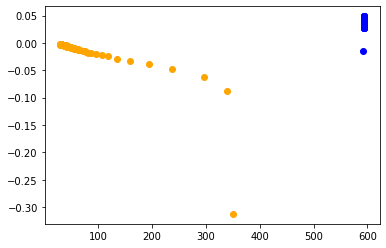

In [154]:
# vub_run_id = "0od4asif"
vub_run_id = "kibu5dm8"

vub_rate = fetch_scalar_data(vub_run_id, "charts/epoch_rate_term")
vub_distortion = fetch_scalar_data(vub_run_id, "charts/epoch_distortion_term")
vub_h_z_y = fetch_scalar_data(vub_run_id, "charts/epoch_h_z_y")
vub_loss = fetch_scalar_data(vub_run_id, "charts/epoch_classification_loss")
vub_i_z_y = vub_loss - vub_h_z_y

vib_run_id = "y312m5qj"

vib_rate = fetch_scalar_data(vib_run_id, "charts/epoch_rate_term")
vib_distortion = fetch_scalar_data(vib_run_id, "charts/epoch_distortion_term")
vib_h_z_y = fetch_scalar_data(vib_run_id, "charts/epoch_h_z_y")
vib_loss = fetch_scalar_data(vib_run_id, "charts/epoch_classification_loss")
vib_i_z_y = vib_loss - vib_h_z_y

plt.scatter(vub_rate, vub_i_z_y, color='blue')
plt.scatter(vib_rate, vib_i_z_y, color='orange')

In [161]:
# vib_distortion[-1]

vib_rate[-1]



# plt.plot(vib_distortion)
# plt.plot(vub_distortion)


30.59885597229004

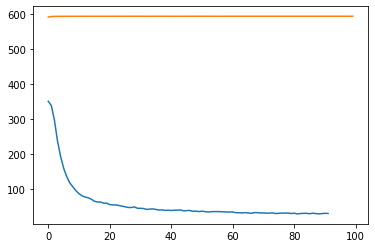

In [156]:
plt.plot(vib_rate)
plt.plot(vub_rate)

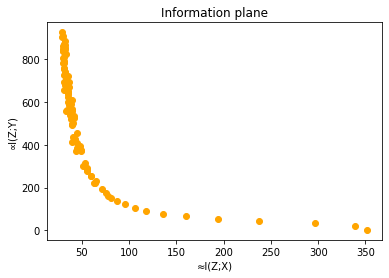

In [17]:
fig, ax = plt.subplots(1, 1)
# _ = ax.scatter(vub_rate, vub_i_z_y, color='blue')
# _ = ax.scatter(vib_rate, vib_i_z_y, color='orange')
# _ = ax.scatter(vub_rate, 1 / vub_loss, color='blue')
_ = ax.scatter(vib_rate, 1 / vib_loss, color='orange')
# _ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax.set_title("Information plane")
_ = ax.set_xlabel("≈I(Z;X)")
_ = ax.set_ylabel("∝I(Z;Y)")


In [208]:
import matplotlib as mpl

# Set the usetex to True
mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['text.usetex'] = False 

Text(0, 0.5, '$\\propto$I(Z;Y)')

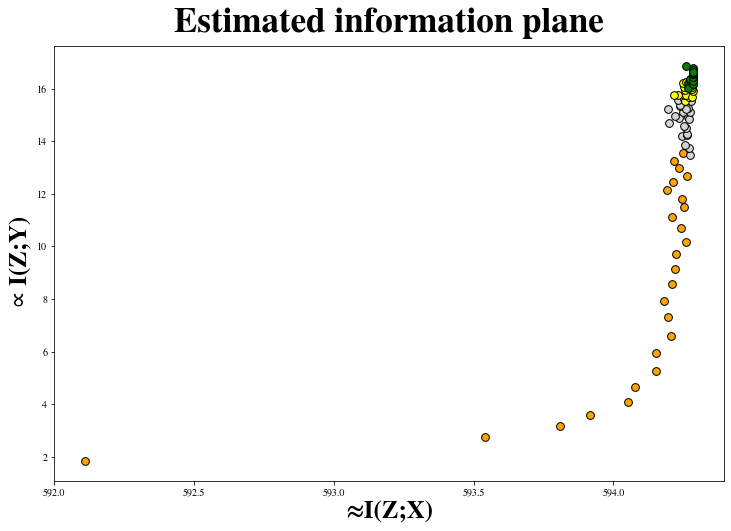

In [245]:
x = 100
fig, ax = plt.subplots(1, 1, figsize=(12,8))
# _ = ax.scatter(vub_rate, vub_i_z_y, color='blue')
# _ = ax.scatter(vib_rate, vib_i_z_y, color='orange')
# _ = ax.scatter(vub_rate, 1 / vub_loss, color='blue')
_ = ax.scatter(vub_rate[0:25], 1 / vub_loss[0:25], color='orange', edgecolors='black', linewidths=1, s=60)
_ = ax.scatter(vub_rate[25:50], 1 / vub_loss[25:50], color='lightgray', edgecolors='black', linewidths=1, s=60)
_ = ax.scatter(vub_rate[50:75], 1 / vub_loss[50:75], color='yellow', edgecolors='black', linewidths=1, s=60)
_ = ax.scatter(vub_rate[75:100], 1 / vub_loss[75:100], color='green', edgecolors='black', linewidths=1, s=60)
# _ = ax.scatter(vub2_rate, 1 / vub2_loss, color='blue')
# _ = ax.scatter(vib_rate, 1 / vib_loss, color='blue')
# _ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax.set_title(r"Estimated information plane", fontsize=35, y=1.02, weight='bold')
_ = ax.set_xlabel("≈I(Z;X)", fontsize=25, weight='bold')
# _ = ax.set_ylabel("∝I(Z;Y)", fontsize=15)
ax.set_ylabel(r'$\propto$' + 'I(Z;Y)', fontsize=25, weight='bold')


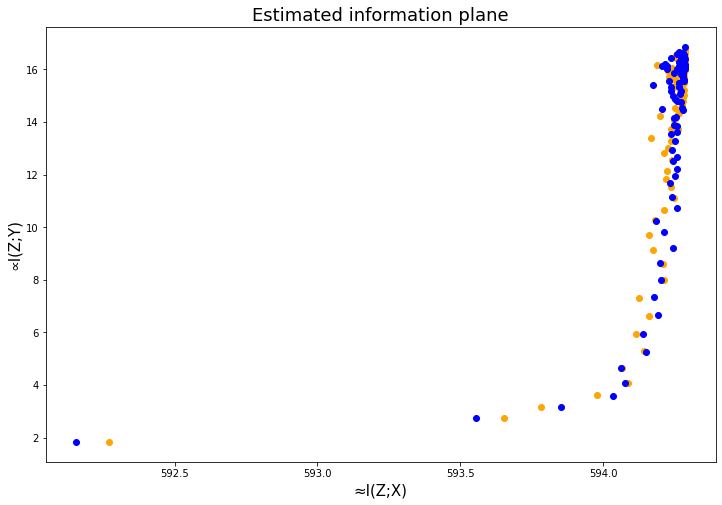

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(12,8))
# _ = ax.scatter(vub_rate, vub_i_z_y, color='blue')
# _ = ax.scatter(vib_rate, vib_i_z_y, color='orange')
# _ = ax.scatter(vub_rate, 1 / vub_loss, color='blue')
_ = ax.scatter(vub_rate, 1 / vub_loss, color='orange')
_ = ax.scatter(vub2_rate, 1 / vub2_loss, color='blue')
# _ = ax.scatter(vib_rate, 1 / vib_loss, color='blue')
# _ = ax[0].set_xticks(np.arange(0, .35, step=0.05))
_ = ax.set_title("Estimated information plane", fontsize=18)
_ = ax.set_xlabel("≈I(Z;X)", fontsize=15)
_ = ax.set_ylabel("∝I(Z;Y)", fontsize=15)


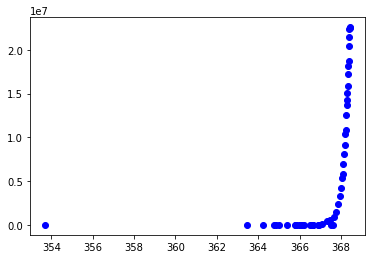

In [110]:
s=0
e=50
# plt.scatter(vub_rate[s:e], vub_i_z_y[s:e], color='blue')
plt.scatter(vub_rate[s:e], 1 / vub_loss[s:e], color='blue')
# plt.scatter(vib_rate[s:e], 1 / vib_loss[s:e], color='orange')
# plt.scatter(vib_rate[s:e], vib_i_z_y[s:e], color='orange')

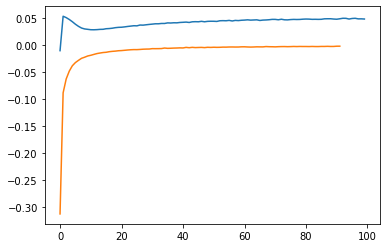

In [38]:
plt.plot(vub_i_z_y)
plt.plot(vib_i_z_y)

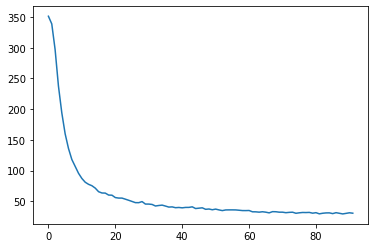

In [41]:
plt.plot(vub_rate)
plt.plot(vib_rate)

In [39]:
vub_i_z_y

array([ 9.34821367e-02, -8.43930244e-03, -5.94454072e-03, -4.56211297e-03,
       -2.58370070e-03, -1.88636081e-03, -5.48354117e-04, -5.17102890e-05,
       -8.10155296e-04,  7.27772014e-04, -5.43269911e-04,  4.78802598e-04,
        1.26997556e-03,  1.23212812e-04,  6.85803476e-04,  1.65083678e-04,
        8.12514510e-04,  1.45267218e-03,  1.16030202e-03,  1.93652173e-04,
        1.44215033e-03, -9.68170207e-05, -5.33023003e-05, -2.13299502e-05,
       -1.59698959e-05, -1.08329523e-05, -7.13301972e-06, -4.93939257e-06,
       -3.57048336e-06, -2.90158044e-06, -2.35118885e-06, -2.15866004e-06,
       -1.85751523e-06, -1.63227050e-06, -1.44488714e-06, -1.30174235e-06,
       -1.24538824e-06, -1.09569904e-06, -1.01722748e-06, -9.81454690e-07,
       -9.29232336e-07, -8.82686940e-07, -8.24830384e-07, -7.85128240e-07,
       -7.61735883e-07, -7.10359686e-07, -6.77809268e-07, -6.56734930e-07,
       -6.46665313e-07, -6.40005510e-07, -5.71897854e-07, -5.68702873e-07,
       -5.28901243e-07, -

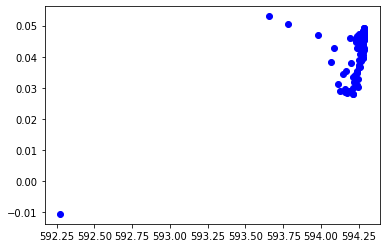

In [136]:
plt.scatter(vub_rate, vub_i_z_y, color='blue')


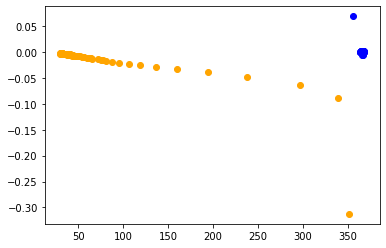

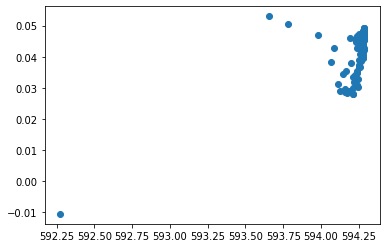

In [42]:
plt.scatter(vub_rate, vub_distortion)

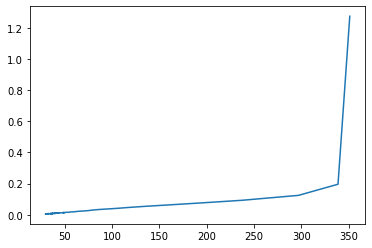

In [22]:
vib_run_id = "y312m5qj"

vib_rate = fetch_scalar_data(vib_run_id, "charts/epoch_rate_term")
vib_distortion = fetch_scalar_data(vib_run_id, "charts/epoch_distortion_term")
plt.plot(vib_rate, vib_distortion)

In [97]:
with open('/D/models/dicts/imagenet_vub_clip_loss_02.07_10:29.pkl', 'rb') as f:
    vub_run_dict = pickle.load(f)
vub_targeted_examples = vub_run_dict['imagenet_vub_clip_loss_beta_-0.01_run_0_02.07_10:29']['targeted_examples']
vub_untargeted_examples = vub_run_dict['imagenet_vub_clip_loss_beta_-0.01_run_0_02.07_10:29']['untargeted_examples']
vub_avg_dist = vub_run_dict['imagenet_vub_clip_loss_beta_-0.01_run_0_02.07_10:29']['avg_l2_dist_for_sx_targeted_attack']
vub_epsilons = vub_run_dict['imagenet_vub_clip_loss_beta_-0.01_run_0_02.07_10:29']['fgs_epsilons']

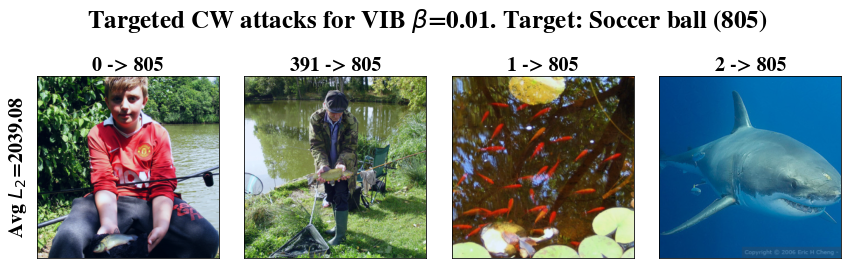

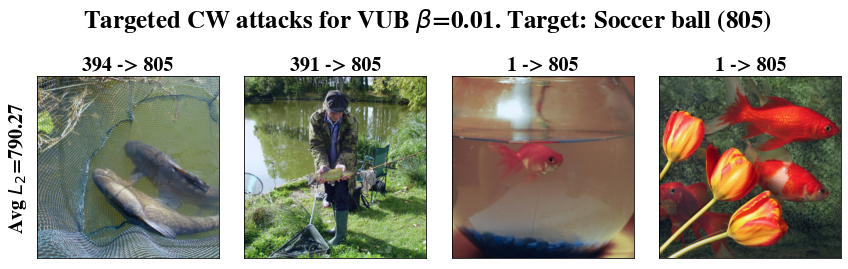

In [242]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(12,20))
i=0
for j in range(len(vib_targeted_examples[i])-1):
    cnt += 1
    plt.subplot(len(EPSILONS),len(vib_targeted_examples[0])-1,cnt)
    plt.xticks([], [])
    plt.yticks([], [])
    if j == 0:
        plt.ylabel(r"Avg $L_{2}$=" + f"{vib_avg_dist:.2f}", fontsize=20, weight='bold')
    orig,adv,ex = vib_targeted_examples[i][j]
    plt.title("{} -> {}".format(orig, adv), fontsize=20, weight='bold')
    normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
    plt.imshow(normalized_ex)
plt.suptitle(r"Targeted CW attacks for VIB $\beta$=0.01. Target: Soccer ball (805)", fontsize=25, y=1, weight='bold')
plt.tight_layout()
plt.show()

# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(12,20))
i=0
for j in range(len(vub_targeted_examples[i])-1):
    cnt += 1
    plt.subplot(len(EPSILONS),len(vub_targeted_examples[0])-1,cnt)
    plt.xticks([], [])
    plt.yticks([], [])
    if j == 0:
        plt.ylabel(r"Avg $L_{2}$" + f"={vub_avg_dist:.2f}", fontsize=20, weight='bold')
    orig,adv,ex = vub_targeted_examples[i][j]
    plt.title("{} -> {}".format(orig, adv), fontsize=20, weight='bold')
    normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
    plt.imshow(normalized_ex)
# plt.set_title("Targeted attacks for VUB ß=0.01. Target: Soccer ball (805)", fontsize=14)
plt.suptitle(r"Targeted CW attacks for VUB $\beta$=0.01. Target: Soccer ball (805)", fontsize=25, y=1, weight='bold')
plt.tight_layout()
plt.show()

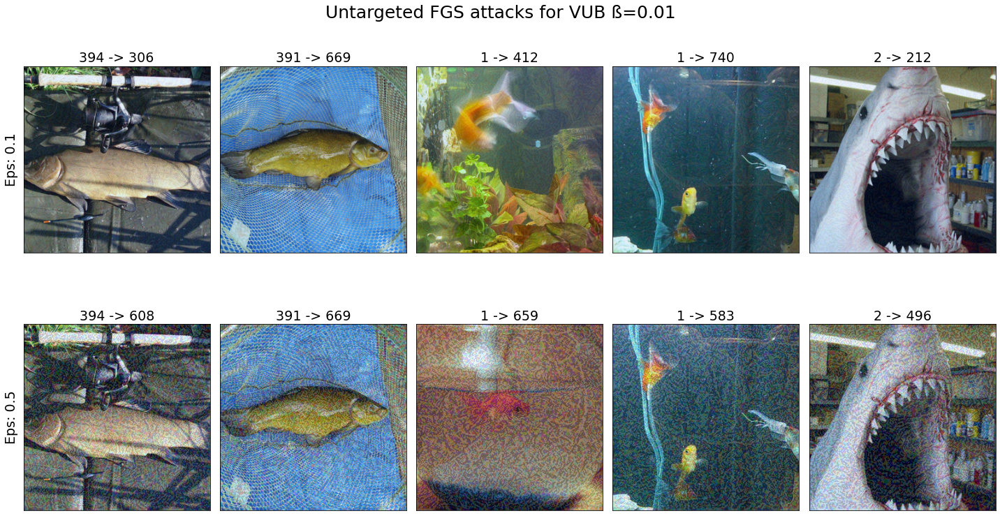

In [135]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(20,12))

vub_epsilons = [vub_epsilons[0]] + [vub_epsilons[-1]]
vub_untargeted_examples = [vub_untargeted_examples[0]] + [vub_untargeted_examples[-1]]

for i in range(2):
    for j in range(len(vub_untargeted_examples[i])):
        cnt += 1
        plt.subplot(2,len(vub_untargeted_examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(vub_epsilons[i]), fontsize=19)
        orig,adv,ex = vub_untargeted_examples[i][j]
        plt.title("{} -> {}".format(orig, adv), fontsize=19)
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.suptitle("Untargeted FGS attacks for VUB ß=0.01", fontsize=25, y=0.95)
plt.tight_layout()
plt.show()

In [132]:
with open('/D/models/dicts/imagenet_vib_21.06_15:35.pkl', 'rb') as f:
    vib_run_dict = pickle.load(f)
vib_targeted_examples = vib_run_dict['imagenet_vib_beta_0.01_run_0_21.06_15:35']['targeted_examples']
vib_untargeted_examples = vib_run_dict['imagenet_vib_beta_0.01_run_0_21.06_15:35']['untargeted_examples']
vib_avg_dist = vib_run_dict['imagenet_vib_beta_0.01_run_0_21.06_15:35']['avg_l2_dist_for_sx_targeted_attack']
vib_epsilons = vib_run_dict['imagenet_vib_beta_0.01_run_0_21.06_15:35']['fgs_epsilons']


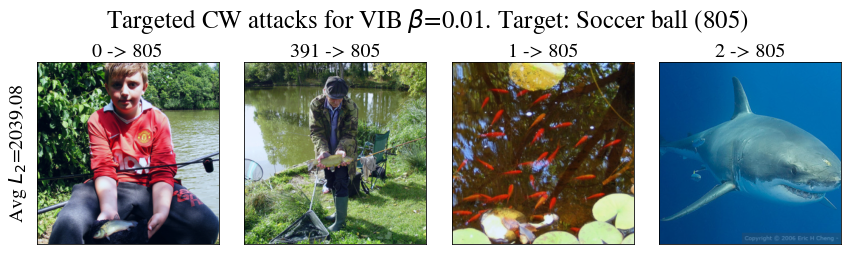

In [220]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(12,20))
i=0
for j in range(len(vib_targeted_examples[i])-1):
    cnt += 1
    plt.subplot(len(EPSILONS),len(vib_targeted_examples[0])-1,cnt)
    plt.xticks([], [])
    plt.yticks([], [])
    if j == 0:
        plt.ylabel(r"Avg $L_{2}$=" + f"{vib_avg_dist:.2f}", fontsize=20)
    orig,adv,ex = vib_targeted_examples[i][j]
    plt.title("{} -> {}".format(orig, adv), fontsize=20)
    normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
    plt.imshow(normalized_ex)
plt.suptitle(r"Targeted CW attacks for VIB $\beta$=0.01. Target: Soccer ball (805)", fontsize=25, y=0.99)
plt.tight_layout()
plt.show()

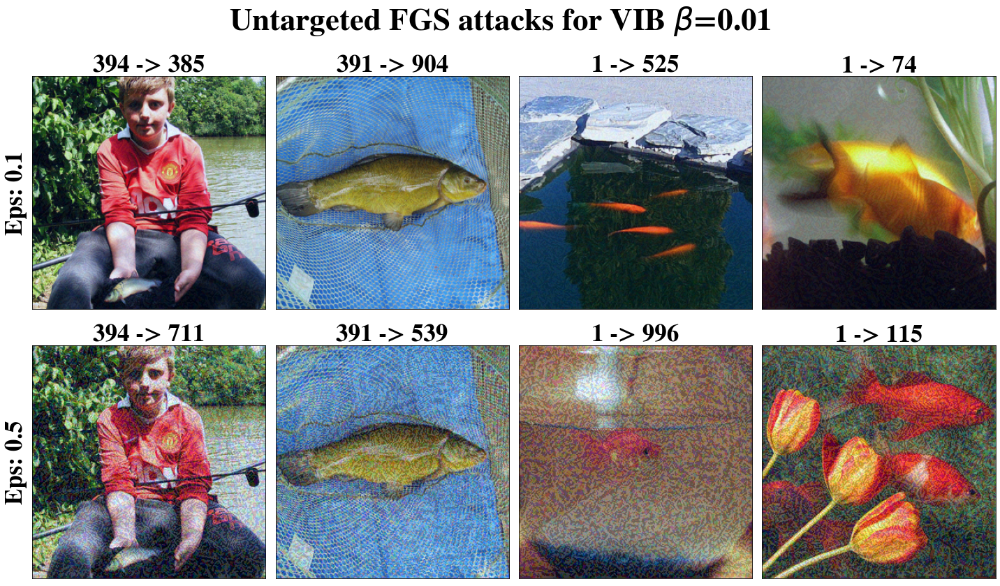

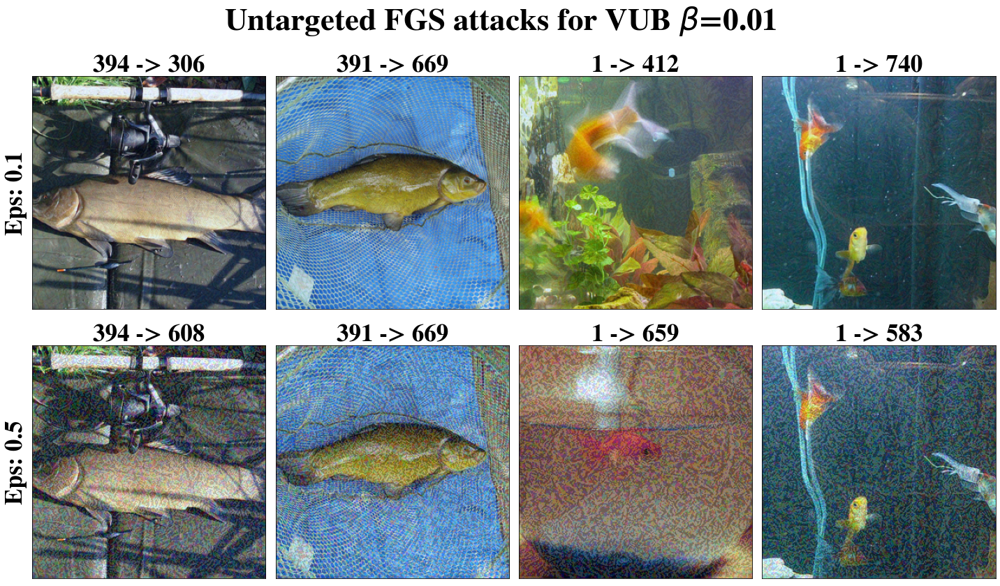

In [244]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(20,12))

vib_epsilons = [vib_epsilons[0]] + [vib_epsilons[-1]]
vib_untargeted_examples = [vib_untargeted_examples[0]] + [vib_untargeted_examples[-1]]

for i in range(2):
    for j in range(len(vib_untargeted_examples[i]) - 1):
        cnt += 1
        plt.subplot(2,len(vib_untargeted_examples[0])-1,cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(vib_epsilons[i]), fontsize=35, weight='bold')
        orig,adv,ex = vib_untargeted_examples[i][j]
        plt.title("{} -> {}".format(orig, adv), fontsize=35, weight='bold')
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.suptitle(r"Untargeted FGS attacks for VIB $\beta$=0.01", fontsize=45, y=1, weight='bold')
plt.tight_layout()


# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(20,12))

vub_epsilons = [vub_epsilons[0]] + [vub_epsilons[-1]]
vub_untargeted_examples = [vub_untargeted_examples[0]] + [vub_untargeted_examples[-1]]

for i in range(2):
    for j in range(len(vub_untargeted_examples[i]) - 1):
        cnt += 1
        plt.subplot(2,len(vub_untargeted_examples[0])-1,cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(vub_epsilons[i]), fontsize=35, weight='bold')
        orig,adv,ex = vub_untargeted_examples[i][j]
        plt.title("{} -> {}".format(orig, adv), fontsize=35, weight='bold')
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.suptitle(r"Untargeted FGS attacks for VUB $\beta$=0.01", fontsize=45, y=1, weight='bold')
plt.tight_layout()
plt.show()

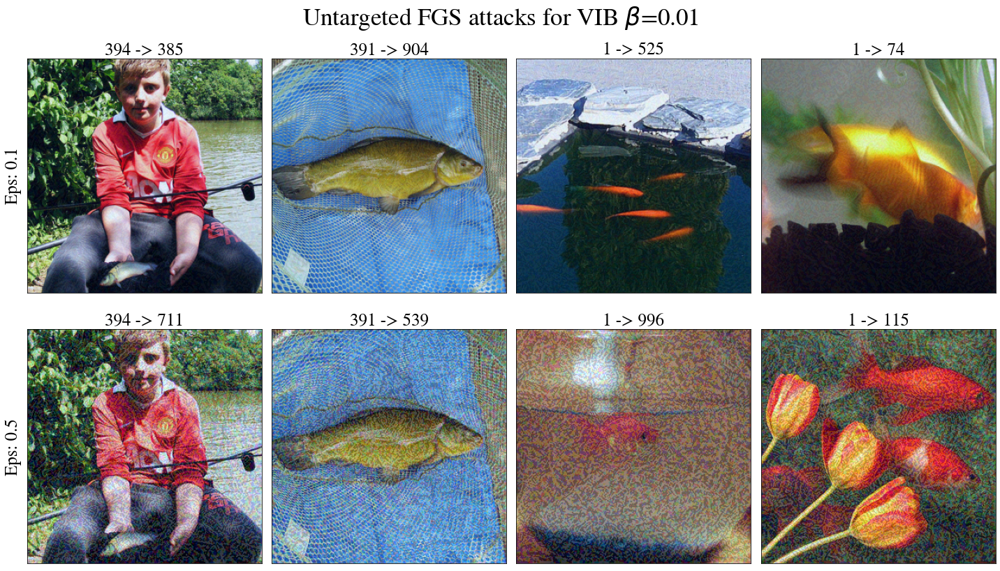

In [212]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(20,12))

vib_epsilons = [vib_epsilons[0]] + [vib_epsilons[-1]]
vib_untargeted_examples = [vib_untargeted_examples[0]] + [vib_untargeted_examples[-1]]

for i in range(2):
    for j in range(len(vib_untargeted_examples[i]) - 1):
        cnt += 1
        plt.subplot(2,len(vib_untargeted_examples[0])-1,cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(vib_epsilons[i]), fontsize=25)
        orig,adv,ex = vib_untargeted_examples[i][j]
        plt.title("{} -> {}".format(orig, adv), fontsize=25)
        normalized_ex = np.transpose( (ex - ex.min()) / (ex.max() - ex.min()) , (1, 2, 0))
        plt.imshow(normalized_ex)
plt.suptitle(r"Untargeted FGS attacks for VIB $\beta$=0.01", fontsize=35, y=0.98)
plt.tight_layout()
plt.show()